<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Cryptocurrency/Bitcoin/Bitcoin_1H_High.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.display import clear_output
import pandas as pd

if pd.__version__ != '0.25.0' or False:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git pandas==0.25.0
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)
  print('RESTARTING')
  %cd /content
  
  # force restart
  import os
  os.kill(os.getpid(), 9)

In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "mczielinski/bitcoin-historical-data"
data_resample = '1H'
data_label = 'High'
data_label_name = 'y'
start_date = '1 Jan 2018'
finish_date = '1 Jan 2019'
is_duka = False
is_yahoo = False
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe'] # True for all , ['All','Fwe','RFE','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
is_EDA = True
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [0]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

Saving kaggle.json to kaggle.json
boosterBytes
DeepLearning_grid_1_AutoML_20190724_233935_model_3.zip
DeepLearning_grid_1_AutoML_20190725_000840_model_1.zip
DeepLearning_grid_1_AutoML_20190725_001708_model_1.zip
DeepLearning_grid_1_AutoML_20190725_002541_model_3.zip
DeepLearning_grid_1_AutoML_20190725_003629_model_9.zip
DeepLearning_grid_1_AutoML_20190725_011737_model_2.zip
DeepLearning_grid_1_AutoML_20190725_014954_model_7.zip
DeepLearning_grid_1_AutoML_20190725_020106_model_6.zip
DeepLearning_grid_1_AutoML_20190725_021024_model_8.zip
DeepLearning_grid_1_AutoML_20190725_022113_model_3.zip
domains
experimental
feature_map
features_dataset
full_dataset
GLM_grid_1_AutoML_20190725_001444_model_1.zip
GLM_grid_1_AutoML_20190725_001531_model_1.zip
GLM_grid_1_AutoML_20190725_002502_model_1.zip
GLM_grid_1_AutoML_20190725_003443_model_1.zip
GLM_grid_1_AutoML_20190725_004515_model_1.zip
GLM_grid_1_AutoML_20190725_015826_model_1.zip
GLM_grid_1_AutoML_20190725_015901_model_1.zip
GLM_grid_1_AutoML_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:113: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...)..apply(<func>)


,Open,High,Low,Close,Volume,Volume_(Currency),Weighted_Price
Date,,,,,,,
2018-01-01 01:00:00,13635.06,13704.42,13312.94,13355.00,393.344524,5.301694e+06,13369.539402
2018-01-01 02:00:00,13355.00,13536.88,13302.02,13429.08,194.327902,2.606050e+06,13394.159991
2018-01-01 03:00:00,13407.98,13640.00,13321.90,13481.73,317.537375,4.292316e+06,13481.369396
2018-01-01 04:00:00,13481.73,13699.14,13372.41,13697.00,457.691397,6.206676e+06,13687.252894
2018-01-01 05:00:00,13681.04,13697.00,13483.05,13569.99,209.560181,2.843623e+06,13569.990000
2018-01-01 06:00:00,13569.36,13940.00,13483.00,13875.82,386.595175,5.310397e+06,13872.739734
2018-01-01 07:00:00,13863.32,13941.75,13643.17,13660.56,135.799526,1.876014e+06,13663.229608
2018-01-01 08:00:00,13660.56,13778.38,13429.03,13499.90,138.615175,1.877953e+06,13499.896112
2018-01-01 09:00:00,13499.90,13667.93,13459.66,13612.00,111.389162,1.512192e+06,13602.156963


,Open,High,Low,Close,Volume,Volume_(Currency),Weighted_Price
count,8759.000000,8759.000000,8759.000000,8759.000000,8759.000000,8.759000e+03,8759.000000
mean,7524.555094,7571.611877,7473.601072,7523.552770,448.915567,3.509864e+06,7523.436312
std,2407.048075,2436.485017,2375.498510,2406.361883,508.082084,4.229009e+06,2406.577181
min,3139.760000,3158.340000,3122.280000,3139.760000,1.473599,9.323622e+03,3140.157320
25%,6369.990000,6391.115000,6349.165000,6369.995000,149.574601,9.582523e+05,6369.653454
50%,6900.630000,6935.880000,6850.030000,6900.370000,297.496006,2.097040e+06,6899.746216
75%,8576.190000,8649.495000,8503.635000,8574.280000,555.462551,4.439757e+06,8572.484137
max,17142.430000,17234.990000,17026.640000,17149.670000,6903.701088,6.087490e+07,17132.184768


14

In [0]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,8
Number of observations,8759
Total Missing (%),0.0%
Total size in memory,547.6 KiB
Average record size in memory,64.0 B
Numeric,2
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,5


In [0]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import uuid
import os


features_dataset = pd.read_pickle('full_dataset').sort_index()


periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
timeperiods = [8, 12, 14, 20, 24, 30]
matypes = range(9)
nbdevs = [2, 3, 4, 5]

# date features
features_dataset['day'] = features_dataset.index.day
features_dataset['dayofweek'] = features_dataset.index.dayofweek
features_dataset['dayofyear'] = features_dataset.index.dayofyear
features_dataset['days_in_month'] = features_dataset.index.days_in_month
features_dataset['hour'] = features_dataset.index.hour
features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
features_dataset['minute'] = features_dataset.index.minute
features_dataset['month'] = features_dataset.index.month
features_dataset['quarter'] = features_dataset.index.quarter
features_dataset['second'] = features_dataset.index.second
features_dataset['week'] = features_dataset.index.week
features_dataset['weekday'] = features_dataset.index.weekday
features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
features_dataset['weekofyear'] = features_dataset.index.weekofyear

# Overlap Studies
features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                    offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                    accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                    accelerationshort=-4e37, accelerationmaxshort=-4e37)

for timeperiod in timeperiods:
    features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                           acceleration=timeperiod / 100,
                                                           maximum=timeperiod / 100)
    features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

    for matype in matypes:
        features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                           timeperiod=timeperiod, matype=matype)
        features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                               minperiod=2,
                                                                               maxperiod=timeperiod, matype=matype)
        features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                           timeperiod=timeperiod,
                                                                           vfactor=matype / 10)

        for nbdev in nbdevs:
            features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

            
gc.collect()
# Momentum Indicators
features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                              features_dataset['Close'])

for timeperiod in timeperiods:
    features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
        features_dataset['High'],
        features_dataset['Low'],
        timeperiod=timeperiod)
    features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                   features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
        'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
    features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], features_dataset['Volume'],
                                                     timeperiod=timeperiod)
    features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                               features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                             features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                             timeperiod=timeperiod)
    features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                         features_dataset['Close'], timeperiod=timeperiod)

    
gc.collect()
features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
    features_dataset['Close'], fastperiod=12,
    slowperiod=26,
    signalperiod=9)
features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
    features_dataset['Close'],
    fastperiod=12,
    fastmatype=0,
    slowperiod=26,
    slowmatype=0,
    signalperiod=9,
    signalmatype=0)

features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                         features_dataset['Low'],
                                                                         features_dataset['Close'], fastk_period=5,
                                                                         slowk_period=3, slowk_matype=0,
                                                                         slowd_period=3, slowd_matype=0)
features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                            features_dataset['Low'],
                                                                            features_dataset['Close'], fastk_period=5,
                                                                            fastd_period=3, fastd_matype=0)
features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                  timeperiod=14,
                                                                                  fastk_period=5, fastd_period=3,
                                                                                  fastd_matype=0)
features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    timeperiod1=7, timeperiod2=14, timeperiod3=28)

# Volume Indicators
features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                            features_dataset['Volume'])
features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                  features_dataset['Volume'], fastperiod=3, slowperiod=10)
features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

gc.collect()
# Volatility Indicators
for timeperiod in timeperiods:
    features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)

features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

# Price Transform
features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

gc.collect()
# Cycle Indicators
features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

# Pattern Recognition
features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'],
                                                        penetration=0)
features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                      features_dataset['Close'])
features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'], penetration=0)
features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
gc.collect()

# Statistic Functions
for timeperiod in timeperiods:
    features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                       timeperiod=timeperiod)
    features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                           timeperiod=timeperiod)
    features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                     timeperiod=timeperiod)
    features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
    features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

    
gc.collect()
# Math Transform
features_dataset['ACOS'] = ACOS(features_dataset['Close'])
features_dataset['ASIN'] = ASIN(features_dataset['Close'])
features_dataset['ATAN'] = ATAN(features_dataset['Close'])
features_dataset['CEIL'] = CEIL(features_dataset['Close'])
features_dataset['COS'] = COS(features_dataset['Close'])
features_dataset['COSH'] = COSH(features_dataset['Close'])
features_dataset['EXP'] = EXP(features_dataset['Close'])
features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
features_dataset['LN'] = LN(features_dataset['Close'])
features_dataset['LOG10'] = LOG10(features_dataset['Close'])
features_dataset['SIN'] = SIN(features_dataset['Close'])
features_dataset['SINH'] = SINH(features_dataset['Close'])
features_dataset['SQRT'] = SQRT(features_dataset['Close'])
features_dataset['TAN'] = TAN(features_dataset['Close'])
features_dataset['TANH'] = TANH(features_dataset['Close'])

gc.collect()
# Math Operator
features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

for timeperiod in timeperiods:
    features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
        features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
    
gc.collect()


features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
features_dataset.to_pickle('features_dataset')
display(features_dataset)
display(features_dataset.describe())

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del periods, timeperiods, matypes, nbdevs, features_dataset, talib
gc.collect()

,Open,High,Low,Close,Volume,Volume_(Currency),Weighted_Price,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12

,Open,High,Low,Close,Volume,Volume_(Currency),Weighted_Price,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12

36

In [0]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [0]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]][:-1]
label_df[data_label_name] = pd.DataFrame(features_dataset[data_label][1:].values / features_dataset[data_label][:-1].values,
                             index=label_df.index).clip(0,1).astype(int)

scaled_df = features_dataset
scaled_df = pd.DataFrame(minmax_scale(scaled_df, axis=0, feature_range=(0, 1)), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale
gc.collect()

,Open,High,Low,Close,Volume,Volume_(Currency),Weighted_Price,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12

140182

In [0]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import uuid
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*0.7),int(len(train_hf)*0.9)]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.3" 2019-04-16; OpenJDK Runtime Environment (build 11.0.3+7-Ubuntu-1ubuntu218.04.1); OpenJDK 64-Bit Server VM (build 11.0.3+7-Ubuntu-1ubuntu218.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpkh5bd9qu
  JVM stdout: /tmp/tmpkh5bd9qu/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpkh5bd9qu/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,02 secs
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,1 month and 6 days
H2O cluster name:,H2O_from_python_unknownUser_cc033u
H2O cluster total nodes:,1
H2O cluster free memory:,9 Gb
H2O cluster total cores:,2
H2O cluster allowed cores:,2
H2O cluster status:,"accepting new members, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo,project_name=str(uuid.uuid4()))
      t_hf = (training_frame or train_hf)

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=t_hf[index_splits[0]:index_splits[1],:], leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except KeyboardInterrupt:
      return None
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    start_idx = max(-index_splits[1],-20)
    predicted = aml.leader.predict(t_hf[start_idx:,:])
    predicted = predicted.as_data_frame()[['predict']]
    predict_df = pd.read_pickle('predict_df')[start_idx:]
    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper right')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)
    h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
    gc.collect()

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_1_AutoML_20190725_034119,0.713350,0.670432,0.347230,0.483607,0.233876
1,DeepLearning_grid_1_AutoML_20190725_034119_mod...,0.712938,0.728562,0.340062,0.500770,0.250771
2,DeepLearning_grid_1_AutoML_20190725_034119_mod...,0.712296,0.658519,0.369812,0.485066,0.235289
3,DeepLearning_grid_1_AutoML_20190725_034119_mod...,0.709382,0.745721,0.357541,0.498144,0.248148
4,DeepLearning_grid_1_AutoML_20190725_034119_mod...,0.707316,0.674216,0.355886,0.490729,0.240815
5,DeepLearning_grid_1_AutoML_20190725_034119_mod...,0.705244,0.816344,0.369291,0.521430,0.271889
6,DeepLearning_grid_1_AutoML_20190725_034119_mod...,0.699480,0.644450,0.348824,0.476542,0.227092
7,DeepLearning_grid_1_AutoML_20190725_034119_mod...,0.694567,0.706225,0.373780,0.501302,0.251304
8,DeepLearning_grid_1_AutoML_20190725_034119_mod...,0.664116,0.841323,0.411176,0.525339,0.275981


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.005842
1,CDLCLOSINGMARUBOZU,0.644440,0.644440,0.003765
2,DIV,0.552772,0.552772,0.003230
3,CDLHIKKAKE,0.550403,0.550403,0.003216
4,TRANGE,0.537314,0.537314,0.003139
5,ULTOSC,0.525396,0.525396,0.003070
6,SUB,0.501789,0.501789,0.002932
7,CDLLONGLINE,0.473227,0.473227,0.002765
8,STOCHRSI_fastd,0.457763,0.457763,0.002674
9,CDLPIERCING,0.437530,0.437530,0.002556


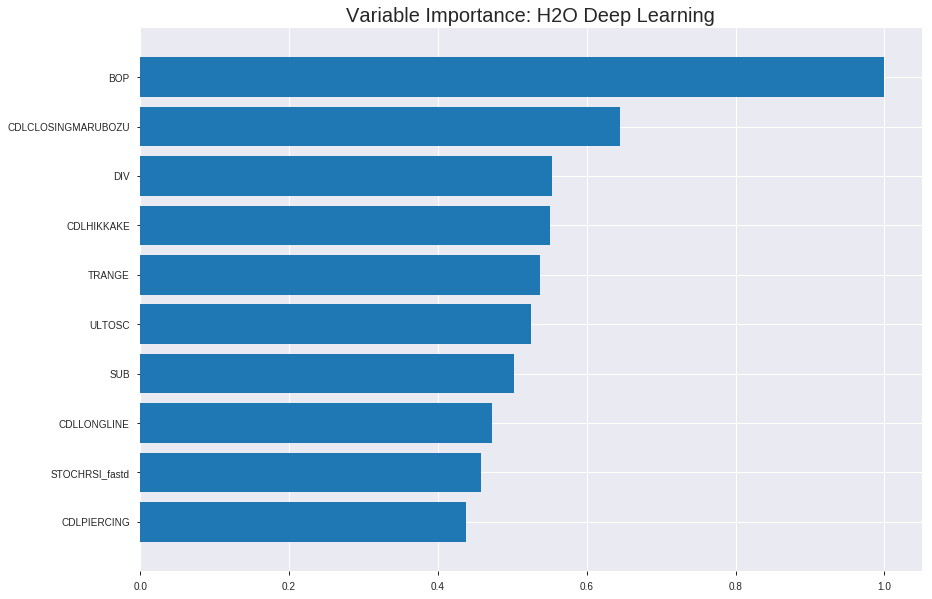

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_1_AutoML_20190725_034119


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.20382390408714077
RMSE: 0.4514686080860338
LogLoss: 0.5924806434738553
Mean Per-Class Error: 0.3171828529781672
AUC: 0.748716940050682
pr_auc: 0.6776050653644166
Gini: 0.497433880101364
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.29905191726325897: 


,0,1,Error,Rate
0,1658.0,1714.0,0.5083,(1714.0/3372.0)
1,406.0,2317.0,0.1491,(406.0/2723.0)
Total,2064.0,4031.0,0.3478,(2120.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2990519,0.6861119,261.0
max f2,0.1472114,0.8215156,334.0
max f0point5,0.4722462,0.6498653,175.0
max accuracy,0.4722462,0.6861362,175.0
max precision,0.9772445,1.0,0.0
max recall,0.0161537,1.0,396.0
max specificity,0.9772445,1.0,0.0
max absolute_mcc,0.4453163,0.3646275,188.0
max min_per_class_accuracy,0.4337784,0.6801322,194.0
max mean_per_class_accuracy,0.4453163,0.6828171,188.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 40.71 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.9135386,1.8347050,1.8347050,0.8196721,0.9428430,0.8196721,0.9428430,0.0183621,0.0183621,83.4704972,83.4704972
,2,0.0200164,0.8777180,1.7613168,1.7980109,0.7868852,0.8943868,0.8032787,0.9186149,0.0176276,0.0359897,76.1316773,79.8010873
,3,0.0300246,0.8466890,1.8347050,1.8102422,0.8196721,0.8635437,0.8087432,0.9002578,0.0183621,0.0543518,83.4704972,81.0242239
,4,0.0400328,0.8210423,1.7613168,1.7980109,0.7868852,0.8322681,0.8032787,0.8832604,0.0176276,0.0719794,76.1316773,79.8010873
,5,0.0500410,0.7967257,1.6145404,1.7613168,0.7213115,0.8096192,0.7868852,0.8685321,0.0161586,0.0881381,61.4540376,76.1316773
,6,0.1000820,0.6975851,1.7172839,1.7393003,0.7672131,0.7437465,0.7770492,0.8061393,0.0859346,0.1740727,71.7283854,73.9300314
,7,0.1501231,0.6324941,1.6292180,1.7026062,0.7278689,0.6613146,0.7606557,0.7578644,0.0815277,0.2556004,62.9218015,70.2606214
,8,0.2,0.5857988,1.5020440,1.6525891,0.6710526,0.6099369,0.7383101,0.7209735,0.0749174,0.3305178,50.2043992,65.2589056
,9,0.3335521,0.5356784,1.3336547,1.5248898,0.5958231,0.5475827,0.6812592,0.6515490,0.1781124,0.5086302,33.3654708,52.4889814
,10,0.4,0.4856358,1.2379955,1.4772310,0.5530864,0.5105750,0.6599672,0.6281304,0.0822622,0.5908924,23.7995493,47.7230995




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.21492340817180472
RMSE: 0.4635983263254999
LogLoss: 0.633093197929598
Mean Per-Class Error: 0.32900565811343374
AUC: 0.723078277063478
pr_auc: 0.6632265929818001
Gini: 0.4461565541269561
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.31084498992866966: 


,0,1,Error,Rate
0,565.0,426.0,0.4299,(426.0/991.0)
1,179.0,572.0,0.2383,(179.0/751.0)
Total,744.0,998.0,0.3473,(605.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3108450,0.6540881,252.0
max f2,0.0859443,0.7974376,360.0
max f0point5,0.5046127,0.6251879,171.0
max accuracy,0.5046127,0.6768083,171.0
max precision,0.9604629,1.0,0.0
max recall,0.0030453,1.0,399.0
max specificity,0.9604629,1.0,0.0
max absolute_mcc,0.4150279,0.3398585,208.0
max min_per_class_accuracy,0.4017992,0.6631158,214.0
max mean_per_class_accuracy,0.4150279,0.6709943,208.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 39.98 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.9277606,2.3195739,2.3195739,1.0,0.9425440,1.0,0.9425440,0.0239680,0.0239680,131.9573901,131.9573901
,2,0.0200918,0.9189108,2.1831284,2.2533004,0.9411765,0.9230025,0.9714286,0.9330524,0.0213049,0.0452730,118.3128378,125.3300361
,3,0.0304248,0.9040252,1.8041130,2.1007462,0.7777778,0.9120165,0.9056604,0.9259082,0.0186418,0.0639148,80.4113034,110.0746175
,4,0.0401837,0.8902255,1.6373463,1.9882062,0.7058824,0.8964655,0.8571429,0.9187578,0.0159787,0.0798935,63.7346283,98.8206201
,5,0.0505166,0.8761793,1.6752478,1.9241920,0.7222222,0.8823703,0.8295455,0.9113149,0.0173103,0.0972037,67.5247818,92.4191986
,6,0.1004592,0.7860806,1.5730444,1.7496215,0.6781609,0.8326374,0.7542857,0.8722009,0.0785619,0.1757656,57.3044370,74.9621457
,7,0.1504018,0.6953205,1.6530297,1.7175471,0.7126437,0.7364129,0.7404580,0.8271110,0.0825566,0.2583222,65.3029677,71.7547087
,8,0.2003444,0.6477059,1.4663973,1.6549395,0.6321839,0.6704688,0.7134670,0.7880627,0.0732357,0.3315579,46.6397294,65.4939546
,9,0.3002296,0.5643148,1.3064267,1.5389907,0.5632184,0.6036410,0.6634799,0.7267063,0.1304927,0.4620506,30.6426680,53.8990715
,10,0.4001148,0.4754389,1.2397723,1.4642934,0.5344828,0.5208260,0.6312769,0.6753101,0.1238349,0.5858855,23.9772258,46.4293424



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 03:41:21,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-07-25 03:41:22,2.660 sec,2755 obs/sec,0.5642330,1,3439.0,0.5380276,0.8860322,-0.1711736,0.5960478,0.5241546,1.6145404,0.5059885,0.5288869,0.7796026,-0.1405344,0.6357430,0.5280974,1.4175174,0.4552239
,2019-07-25 03:41:31,10.697 sec,7048 obs/sec,10.1186218,18,61673.0,0.4514686,0.5924806,0.1753544,0.7487169,0.6776051,1.8347050,0.3478261,0.4635983,0.6330932,0.1236725,0.7230783,0.6632266,2.3195739,0.3473020


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0058425
CDLCLOSINGMARUBOZU,0.6444399,0.6444399,0.0037651
DIV,0.5527725,0.5527725,0.0032295
CDLHIKKAKE,0.5504030,0.5504030,0.0032157
TRANGE,0.5373141,0.5373141,0.0031392
---,---,---,---
MA_8_2,0.0764197,0.0764197,0.0004465
MA_8_4,0.0739295,0.0739295,0.0004319
BBANDS_upperband_12_5_3,0.0705931,0.0705931,0.0004124
BBANDS_lowerband_12_2_5,0.0698306,0.0698306,0.0004080



See the whole table with table.as_data_frame()


('accuracy', 0.6509758897818599)

('F1', 0.6881091617933724)

('auc', 0.7133500483389463)

('logloss', 0.6704316610591755)

('mean_per_class_error', 0.33655327376841937)

('rmse', 0.48360735172985164)

('mse', 0.23387607064716046)

deeplearning prediction progress: |███████████████████████████████████████| 100%


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


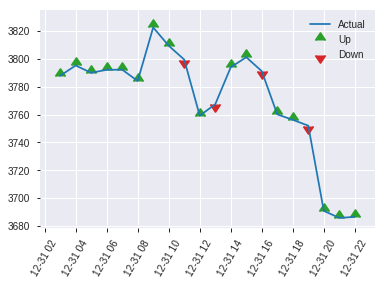


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.23387607064716046
RMSE: 0.48360735172985164
LogLoss: 0.6704316610591755
Mean Per-Class Error: 0.33655327376841937
AUC: 0.7133500483389463
pr_auc: 0.6532432610000399
Gini: 0.42670009667789266
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.160419127260479: 


,0,1,Error,Rate
0,198.0,275.0,0.5814,(275.0/473.0)
1,45.0,353.0,0.1131,(45.0/398.0)
Total,243.0,628.0,0.3674,(320.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1604191,0.6881092,298.0
max f2,0.0548753,0.8204593,369.0
max f0point5,0.1975082,0.6188494,274.0
max accuracy,0.4084318,0.6509759,162.0
max precision,0.8843744,1.0,0.0
max recall,0.0316047,1.0,383.0
max specificity,0.8843744,1.0,0.0
max absolute_mcc,0.1975082,0.3401074,274.0
max min_per_class_accuracy,0.2987128,0.6342495,215.0
max mean_per_class_accuracy,0.1975082,0.6634467,274.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 33.01 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.7644830,1.9452820,1.9452820,0.8888889,0.8167754,0.8888889,0.8167754,0.0201005,0.0201005,94.5281965,94.5281965
,2,0.0206659,0.7583165,1.4589615,1.7021217,0.6666667,0.7610558,0.7777778,0.7889156,0.0150754,0.0351759,45.8961474,70.2121720
,3,0.0309989,0.7482097,1.4589615,1.6210683,0.6666667,0.7545509,0.7407407,0.7774607,0.0150754,0.0502513,45.8961474,62.1068304
,4,0.0401837,0.7457389,1.9148869,1.6882268,0.875,0.7473271,0.7714286,0.7705730,0.0175879,0.0678392,91.4886935,68.8226849
,5,0.0505166,0.7372945,1.7021217,1.6910690,0.7777778,0.7423532,0.7727273,0.7648008,0.0175879,0.0854271,70.2121720,69.1068981
,6,0.1010333,0.6694318,1.6413317,1.6662003,0.75,0.7059821,0.7613636,0.7353915,0.0829146,0.1683417,64.1331658,66.6200320
,7,0.1504018,0.6017348,1.5268201,1.6204496,0.6976744,0.6339467,0.7404580,0.7020928,0.0753769,0.2437186,52.6820147,62.0449576
,8,0.2009185,0.5439985,1.4423824,1.5756784,0.6590909,0.5708786,0.72,0.6691018,0.0728643,0.3165829,44.2382366,57.5678392
,9,0.3008037,0.4580258,1.1571074,1.4366873,0.5287356,0.4972487,0.6564885,0.6120361,0.1155779,0.4321608,15.7107376,43.6687253
,10,0.4006889,0.3779282,1.0313348,1.3356395,0.4712644,0.4150121,0.6103152,0.5629212,0.1030151,0.5351759,3.1334835,33.5639516


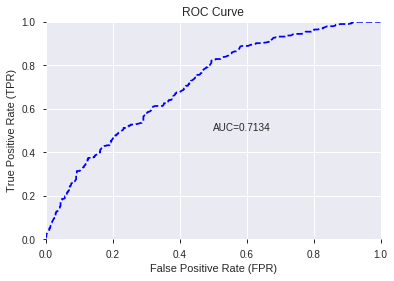

This function is available for GLM models only


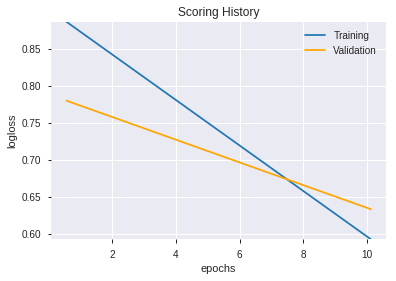

--2019-07-25 04:41:33--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.171.115
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.171.115|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


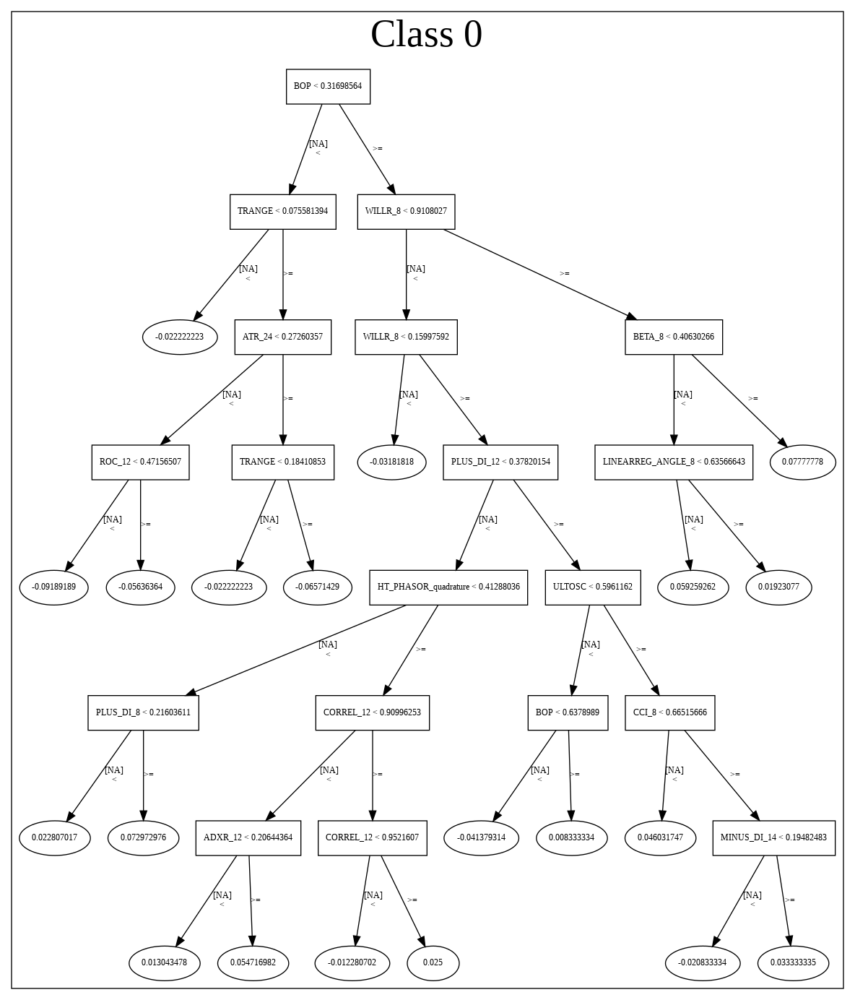

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_1_AutoML_20190725_034119',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_1_AutoML_20190725_034119',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_2_sid_8dc6',


In [0]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190725_044231_model_3,0.721172,0.706489,0.344994,0.472286,0.223054
1,DeepLearning_grid_1_AutoML_20190725_044231_model_1,0.713209,0.809932,0.342880,0.496786,0.246796
2,DeepLearning_grid_1_AutoML_20190725_044231_model_2,0.712790,1.010898,0.342221,0.539109,0.290638
3,DeepLearning_grid_1_AutoML_20190725_044231_model_5,0.704182,0.731333,0.386587,0.504991,0.255016
4,DeepLearning_grid_1_AutoML_20190725_044231_model_7,0.700912,0.814413,0.369950,0.511593,0.261728
5,DeepLearning_grid_1_AutoML_20190725_044231_model_6,0.700391,0.685390,0.349653,0.488846,0.238970
6,DeepLearning_grid_1_AutoML_20190725_044231_model_8,0.699613,0.642967,0.370165,0.474979,0.225605
7,DeepLearning_grid_1_AutoML_20190725_044231_model_4,0.697241,0.790810,0.407928,0.510714,0.260828
8,DeepLearning_1_AutoML_20190725_044231,0.694798,0.792818,0.388180,0.519641,0.270026
9,DeepLearning_grid_1_AutoML_20190725_044231_model_9,0.693682,0.671467,0.357711,0.485222,0.235441


,variable,relative_importance,scaled_importance,percentage
0,is_quarter_start,1.000000,1.000000,0.043973
1,CDL2CROWS,0.755232,0.755232,0.033210
2,CDLUNIQUE3RIVER,0.748231,0.748231,0.032902
3,CDLSHOOTINGSTAR,0.734921,0.734921,0.032316
4,CDLTHRUSTING,0.729702,0.729702,0.032087
5,CDLPIERCING,0.703074,0.703074,0.030916
6,CDLTAKURI,0.675329,0.675329,0.029696
7,CDLGRAVESTONEDOJI,0.662684,0.662684,0.029140
8,CDLDRAGONFLYDOJI,0.656408,0.656408,0.028864
9,CDLLADDERBOTTOM,0.643398,0.643398,0.028292


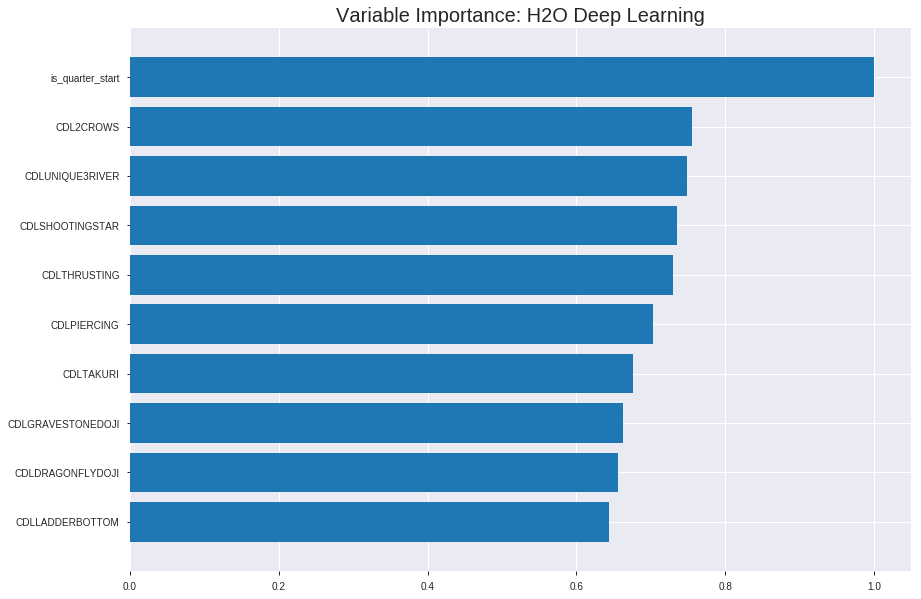

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190725_044231_model_3


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.20792214606821793
RMSE: 0.4559848090322943
LogLoss: 0.6331487043485378
Mean Per-Class Error: 0.3161103690760444
AUC: 0.7472574471060415
pr_auc: 0.6485785080329908
Gini: 0.49451489421208294
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3976445775925014: 


,0,1,Error,Rate
0,1550.0,1822.0,0.5403,(1822.0/3372.0)
1,355.0,2368.0,0.1304,(355.0/2723.0)
Total,1905.0,4190.0,0.3572,(2177.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3976446,0.6850861,252.0
max f2,0.2285889,0.8149738,312.0
max f0point5,0.5942359,0.6468275,157.0
max accuracy,0.5676845,0.6840033,172.0
max precision,0.9761073,0.8443709,10.0
max recall,0.0081236,1.0,397.0
max specificity,0.9993935,0.9928826,0.0
max absolute_mcc,0.4912175,0.3687247,210.0
max min_per_class_accuracy,0.5635001,0.6819684,174.0
max mean_per_class_accuracy,0.5353956,0.6838896,189.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 50.61 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.9994967,1.8713991,1.8713991,0.8360656,0.9996559,0.8360656,0.9996559,0.0187293,0.0187293,87.1399072,87.1399072
,2,0.0200164,0.9990998,2.0181755,1.9447873,0.9016393,0.9993351,0.8688525,0.9994955,0.0201983,0.0389277,101.8175469,94.4787271
,3,0.0300246,0.9971615,1.7246227,1.8713991,0.7704918,0.9983818,0.8360656,0.9991242,0.0172604,0.0561880,72.4622674,87.1399072
,4,0.0400328,0.9890072,1.9080932,1.8805726,0.8524590,0.9945607,0.8401639,0.9979833,0.0190966,0.0752846,90.8093171,88.0572597
,5,0.0500410,0.9737432,1.9447873,1.8934155,0.8688525,0.9802841,0.8459016,0.9944435,0.0194638,0.0947484,94.4787271,89.3415531
,6,0.1000820,0.8181481,1.7246227,1.8090191,0.7704918,0.8979053,0.8081967,0.9461744,0.0863019,0.1810503,72.4622674,80.9019103
,7,0.1501231,0.7498740,1.5631686,1.7270689,0.6983607,0.7778432,0.7715847,0.8900640,0.0782225,0.2592729,56.3168636,72.7068947
,8,0.2,0.7127007,1.4578662,1.6599339,0.6513158,0.7305577,0.7415915,0.8502856,0.0727139,0.3319868,45.7866227,65.9933896
,9,0.3000820,0.6539244,1.2732853,1.5309805,0.5688525,0.6817224,0.6839803,0.7940671,0.1274330,0.4594198,27.3285251,53.0980548
,10,0.4,0.6050663,1.3158058,1.4772310,0.5878489,0.6299128,0.6599672,0.7530622,0.1314726,0.5908924,31.5805819,47.7230995




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.22414165644435438
RMSE: 0.4734360109289896
LogLoss: 0.7029279523359594
Mean Per-Class Error: 0.3180931983053876
AUC: 0.7216775211255494
pr_auc: 0.6068091909403172
Gini: 0.4433550422510988
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5095643030427796: 


,0,1,Error,Rate
0,601.0,390.0,0.3935,(390.0/991.0)
1,191.0,560.0,0.2543,(191.0/751.0)
Total,792.0,950.0,0.3335,(581.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5095643,0.6584362,197.0
max f2,0.0306402,0.7961103,385.0
max f0point5,0.5979011,0.6298579,158.0
max accuracy,0.5979011,0.6808266,158.0
max precision,0.9995718,0.8695652,0.0
max recall,0.0008722,1.0,399.0
max specificity,0.9995718,0.9939455,0.0
max absolute_mcc,0.5541386,0.3605582,176.0
max min_per_class_accuracy,0.5627606,0.6790945,173.0
max mean_per_class_accuracy,0.5541386,0.6819068,176.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 50.67 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.9996533,2.0618435,2.0618435,0.8888889,0.9998039,0.8888889,0.9998039,0.0213049,0.0213049,106.1843468,106.1843468
,2,0.0200918,0.9993633,1.9102373,1.9882062,0.8235294,0.9995298,0.8571429,0.9996708,0.0186418,0.0399467,91.0237331,98.8206201
,3,0.0304248,0.9988642,1.8041130,1.9256840,0.7777778,0.9991471,0.8301887,0.9994929,0.0186418,0.0585885,80.4113034,92.5683994
,4,0.0401837,0.9972121,1.5009008,1.8225224,0.6470588,0.9981842,0.7857143,0.9991751,0.0146471,0.0732357,50.0900760,82.2522351
,5,0.0505166,0.9938976,1.9329783,1.8451156,0.8333333,0.9959713,0.7954545,0.9985198,0.0199734,0.0932091,93.2978251,84.5115603
,6,0.1004592,0.8764743,1.8130003,1.8291497,0.7816092,0.9585581,0.7885714,0.9786531,0.0905459,0.1837550,81.3000291,82.9149705
,7,0.1504018,0.7801238,1.4130738,1.6909871,0.6091954,0.8195526,0.7290076,0.9258220,0.0705726,0.2543276,41.3073756,69.0987081
,8,0.2003444,0.7329389,1.1731178,1.5618907,0.5057471,0.7537512,0.6733524,0.8829276,0.0585885,0.3129161,17.3117835,56.1890736
,9,0.3002296,0.6666545,1.4130738,1.5123799,0.6091954,0.6985369,0.6520076,0.8215815,0.1411451,0.4540613,41.3073756,51.2379924
,10,0.4001148,0.6098490,1.3730811,1.4776052,0.5919540,0.6396455,0.6370158,0.7761628,0.1371505,0.5912117,37.3081103,47.7605183



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 04:44:47,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-07-25 04:44:49,2 min 17.133 sec,6505 obs/sec,2.6447908,1,16120.0,0.5054079,0.8338855,-0.0334660,0.7082378,0.6100623,1.9814814,0.3880230,0.5169020,0.8858129,-0.0894294,0.7019460,0.5914230,2.1907087,0.3518944
,2019-07-25 04:44:55,2 min 23.037 sec,7961 obs/sec,10.5899918,4,64546.0,0.4559848,0.6331487,0.1587735,0.7472574,0.6485785,1.8713991,0.3571780,0.4734360,0.7029280,0.0860861,0.7216775,0.6068092,2.0618435,0.3335247
,2019-07-25 04:45:01,2 min 29.247 sec,9189 obs/sec,21.1747334,8,129060.0,0.4506285,0.6337646,0.1784206,0.7541534,0.6541342,1.9080932,0.3363413,0.4701709,0.7324317,0.0986486,0.7263514,0.6127304,1.9329783,0.3214696
,2019-07-25 04:45:07,2 min 34.812 sec,10016 obs/sec,31.7647252,12,193606.0,0.4552940,0.6712653,0.1613206,0.7510072,0.6255506,1.7246227,0.3473339,0.4728427,0.7803432,0.0883754,0.7222681,0.5847589,1.8041130,0.3524684
,2019-07-25 04:45:12,2 min 39.918 sec,10677 obs/sec,42.3253486,16,257973.0,0.4493449,0.6329728,0.1830945,0.7575550,0.6480895,1.9080932,0.3519278,0.4686466,0.7265790,0.1044833,0.7241398,0.6128561,1.8041130,0.3369690
,2019-07-25 04:45:18,2 min 45.902 sec,11336 obs/sec,55.5381460,21,338505.0,0.4494150,0.6455685,0.1828396,0.7590046,0.6475727,1.7980109,0.3430681,0.4712209,0.7483934,0.0946182,0.7224159,0.5876951,1.8041130,0.3358209
,2019-07-25 04:45:24,2 min 51.752 sec,11838 obs/sec,68.7347006,26,418938.0,0.4503810,0.6901505,0.1793229,0.7598929,0.6220353,1.7613168,0.3363413,0.4715300,0.8077854,0.0934301,0.7250561,0.5559260,1.8041130,0.3340987
,2019-07-25 04:45:24,2 min 52.115 sec,11835 obs/sec,68.7347006,26,418938.0,0.4559848,0.6331487,0.1587735,0.7472574,0.6485785,1.8713991,0.3571780,0.4734360,0.7029280,0.0860861,0.7216775,0.6068092,2.0618435,0.3335247


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
is_quarter_start,1.0,1.0,0.0439727
CDL2CROWS,0.7552317,0.7552317,0.0332096
CDLUNIQUE3RIVER,0.7482306,0.7482306,0.0329017
CDLSHOOTINGSTAR,0.7349215,0.7349215,0.0323165
CDLTHRUSTING,0.7297016,0.7297016,0.0320869
---,---,---,---
CDLHARAMICROSS,0.3093186,0.3093186,0.0136016
STOCHF_fastd,0.3073249,0.3073249,0.0135139
WILLR_8,0.3040588,0.3040588,0.0133703
CDLDOJI,0.2975816,0.2975816,0.0130855



See the whole table with table.as_data_frame()


('accuracy', 0.6681974741676234)

('F1', 0.684630738522954)

('auc', 0.7211719272897256)

('logloss', 0.7064889971325755)

('mean_per_class_error', 0.3248802150286315)

('rmse', 0.47228553329011763)

('mse', 0.22305362495513079)

deeplearning prediction progress: |███████████████████████████████████████| 100%


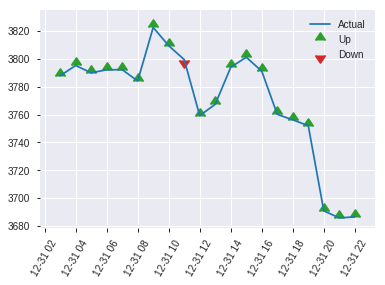


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.22305362495513079
RMSE: 0.47228553329011763
LogLoss: 0.7064889971325755
Mean Per-Class Error: 0.3248802150286315
AUC: 0.7211719272897256
pr_auc: 0.6291735387921223
Gini: 0.44234385457945113
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.21508983529621564: 


,0,1,Error,Rate
0,212.0,261.0,0.5518,(261.0/473.0)
1,55.0,343.0,0.1382,(55.0/398.0)
Total,267.0,604.0,0.3628,(316.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2150898,0.6846307,290.0
max f2,0.0367815,0.8165407,372.0
max f0point5,0.4417683,0.6368159,192.0
max accuracy,0.4417683,0.6681975,192.0
max precision,0.8182160,0.7974684,39.0
max recall,0.0024870,1.0,397.0
max specificity,0.9996380,0.9852008,0.0
max absolute_mcc,0.3247051,0.3533369,242.0
max min_per_class_accuracy,0.4151124,0.6596195,203.0
max mean_per_class_accuracy,0.3247051,0.6751198,242.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 40.51 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.9996634,1.4589615,1.4589615,0.6666667,0.9997633,0.6666667,0.9997633,0.0150754,0.0150754,45.8961474,45.8961474
,2,0.0206659,0.9994123,1.4589615,1.4589615,0.6666667,0.9995717,0.6666667,0.9996675,0.0150754,0.0301508,45.8961474,45.8961474
,3,0.0309989,0.9972558,1.9452820,1.6210683,0.8888889,0.9988123,0.7407407,0.9993825,0.0201005,0.0502513,94.5281965,62.1068304
,4,0.0401837,0.9907890,1.9148869,1.6882268,0.875,0.9946931,0.7714286,0.9983106,0.0175879,0.0678392,91.4886935,68.8226849
,5,0.0505166,0.9730561,1.7021217,1.6910690,0.7777778,0.9820506,0.7727273,0.9949847,0.0175879,0.0854271,70.2121720,69.1068981
,6,0.1010333,0.7918622,1.6413317,1.6662003,0.75,0.8633371,0.7613636,0.9291609,0.0829146,0.1683417,64.1331658,66.6200320
,7,0.1504018,0.6895061,1.4759261,1.6037439,0.6744186,0.7382833,0.7328244,0.8665064,0.0728643,0.2412060,47.5926142,60.3743910
,8,0.2009185,0.6367505,1.3429077,1.5381622,0.6136364,0.6604408,0.7028571,0.8146956,0.0678392,0.3090452,34.2907720,53.8162240
,9,0.3008037,0.5366238,1.2828799,1.4533929,0.5862069,0.5825094,0.6641221,0.7375956,0.1281407,0.4371859,28.2879917,45.3392919
,10,0.4006889,0.4837950,1.2074164,1.3920750,0.5517241,0.5129327,0.6361032,0.6815908,0.1206030,0.5577889,20.7416392,39.2074988


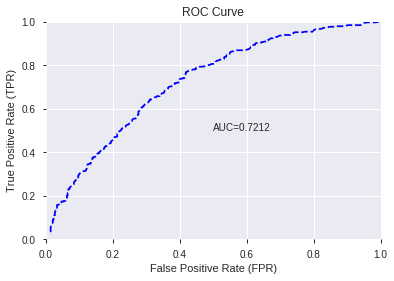

This function is available for GLM models only


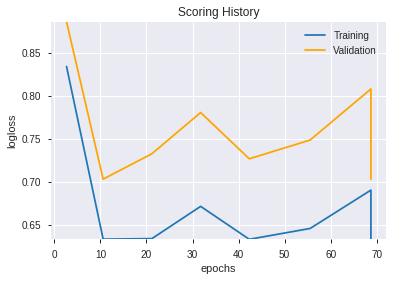

--2019-07-25 05:07:55--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.145.235
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.145.235|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


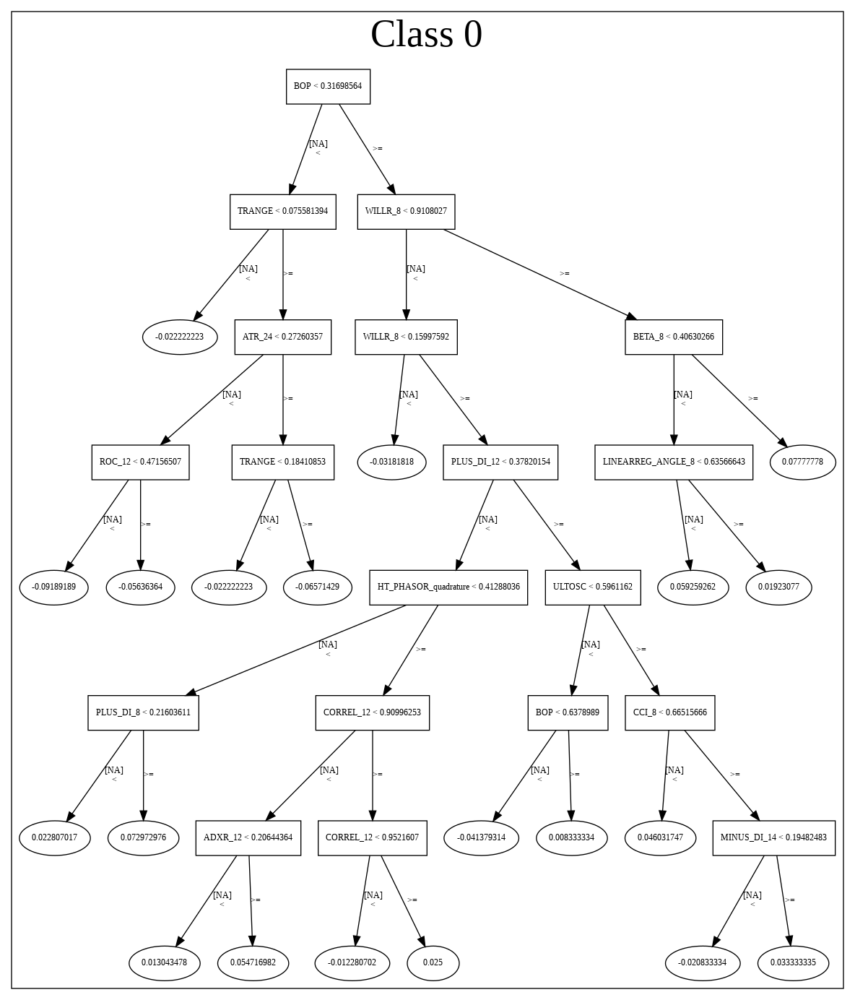

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190725_044231_model_3',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190725_044231_model_3',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_10_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['is_quarter_start',
 'CDL2CROWS',
 'CDLUNIQUE3RIVER',
 'CDLSHOOTINGSTAR',
 'CDLTHRUSTING',
 'CDLPIERCING',
 'CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLLADDERBOTTOM',
 'CDLBREAKAWAY',
 'CDL3WHITESOLDIERS',
 'CDLCLOSINGMARUBOZU',
 'CDLMARUBOZU',
 'BOP',
 'SUB',
 'week',
 'DIV',
 'TRANGE',
 'SAREXT',
 'BBANDS_upperband_20_0_4',
 'Volume',
 'CDLHAMMER',
 'aroonup_8',
 'BBANDS_middleband_24_2_2',
 'CDLHIKKAKE',
 'STOCHRSI_fastk',
 'Volume_(Currency)',
 'CDLLONGLINE',
 'CCI_8',
 'STOCHF_fastk',
 'PLUS_DI_8',
 'STOCHRSI_fastd',
 'MFI_12',
 'CDLENGULFING',
 'WILLR_30',
 'ULTOSC',
 'WILLR_24',
 'aroondown_8',
 'STOCH_slowk',
 'PLUS_DI_12',
 'CDLRICKSHAWMAN',
 'STOCH_slowd',
 'PLUS_DI_24',
 'PPO',
 'CDLHARAMICROSS',
 'STOCHF_fastd',
 'WILLR_8',
 'CDLDOJI',
 'ADOSC']

In [0]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190725_050852_model_1,0.719021,0.646237,0.348027,0.478144,0.228622


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.407164,1.000000,0.104497
1,ULTOSC,0.248015,0.609127,0.063652
2,CDLCLOSINGMARUBOZU,0.186812,0.458812,0.047945
3,WILLR_24,0.157389,0.386549,0.040393
4,STOCHF_fastk,0.156000,0.383137,0.040037
5,WILLR_8,0.149939,0.368251,0.038481
6,week,0.143266,0.351862,0.036769
7,DIV,0.134529,0.330404,0.034526
8,CDLHIKKAKE,0.133636,0.328210,0.034297
9,CCI_8,0.133343,0.327493,0.034222


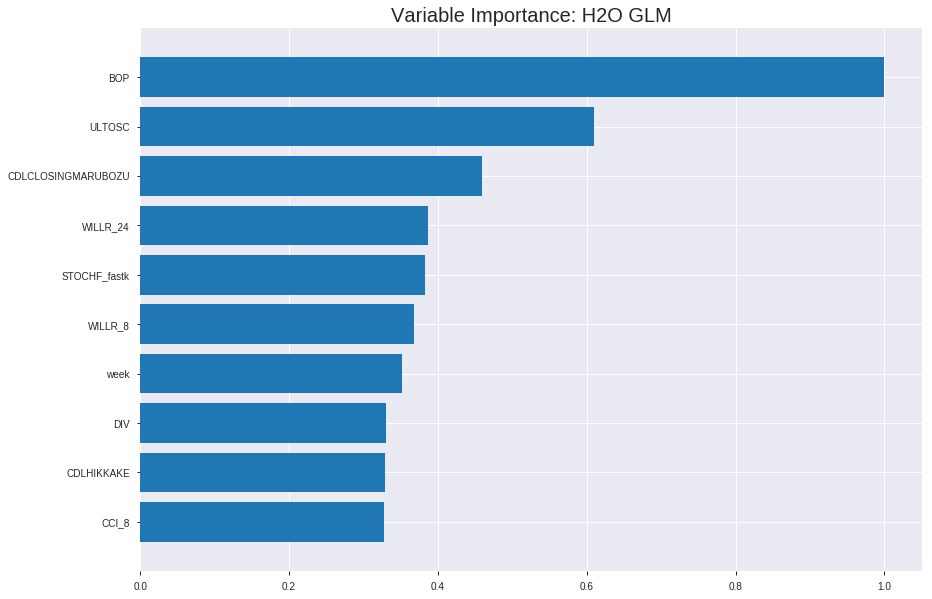

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190725_050852_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.20175019563551452
RMSE: 0.4491661114059191
LogLoss: 0.5876624151973678
Null degrees of freedom: 6094
Residual degrees of freedom: 6044
Null deviance: 8380.226957690009
Residual deviance: 7163.604841255914
AIC: 7265.604841255914
AUC: 0.7497428652457058
pr_auc: 0.6887452778108654
Gini: 0.49948573049141154
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3638415181898787: 


,0,1,Error,Rate
0,1717.0,1655.0,0.4908,(1655.0/3372.0)
1,420.0,2303.0,0.1542,(420.0/2723.0)
Total,2137.0,3958.0,0.3404,(2075.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3638415,0.6894178,251.0
max f2,0.2592198,0.8161144,306.0
max f0point5,0.4840720,0.6444976,186.0
max accuracy,0.4500619,0.6840033,205.0
max precision,0.9785611,1.0,0.0
max recall,0.0549209,1.0,391.0
max specificity,0.9785611,1.0,0.0
max absolute_mcc,0.3896136,0.3759550,237.0
max min_per_class_accuracy,0.4632956,0.6804994,197.0
max mean_per_class_accuracy,0.4344762,0.6870335,214.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 44.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.8717408,1.9447873,1.9447873,0.8688525,0.8954456,0.8688525,0.8954456,0.0194638,0.0194638,94.4787271,94.4787271
,2,0.0200164,0.8457083,1.8713991,1.9080932,0.8360656,0.8598100,0.8524590,0.8776278,0.0187293,0.0381932,87.1399072,90.8093171
,3,0.0300246,0.8262483,1.7613168,1.8591677,0.7868852,0.8354855,0.8306011,0.8635804,0.0176276,0.0558208,76.1316773,85.9167705
,4,0.0400328,0.8017660,1.9447873,1.8805726,0.8688525,0.8148194,0.8401639,0.8513901,0.0194638,0.0752846,94.4787271,88.0572597
,5,0.0500410,0.7767442,1.7980109,1.8640603,0.8032787,0.7891612,0.8327869,0.8389443,0.0179949,0.0932795,79.8010873,86.4060252
,6,0.1000820,0.7010851,1.7246227,1.7943415,0.7704918,0.7374730,0.8016393,0.7882087,0.0863019,0.1795813,72.4622674,79.4341463
,7,0.1501231,0.6480686,1.6072016,1.7319615,0.7180328,0.6725161,0.7737705,0.7496445,0.0804260,0.2600073,60.7201556,73.1961494
,8,0.2,0.6102279,1.4652292,1.6654425,0.6546053,0.6282131,0.7440525,0.7193613,0.0730812,0.3330885,46.5229188,66.5442527
,9,0.3000820,0.5526974,1.3026405,1.5444424,0.5819672,0.5802594,0.6899945,0.6729687,0.1303709,0.4634594,30.2640530,54.4442408
,10,0.4,0.5044015,1.2128936,1.4616232,0.5418719,0.5286752,0.6529943,0.6369249,0.1211899,0.5846493,21.2893632,46.1623210




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.20627657822570783
RMSE: 0.4541768138354355
LogLoss: 0.6018073309415343
Null degrees of freedom: 1741
Residual degrees of freedom: 1691
Null deviance: 2383.4834095378615
Residual deviance: 2096.6967410003053
AIC: 2198.6967410003053
AUC: 0.7313927880888046
pr_auc: 0.6714899543422668
Gini: 0.4627855761776092
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.37082954376651117: 


,0,1,Error,Rate
0,578.0,413.0,0.4168,(413.0/991.0)
1,175.0,576.0,0.233,(175.0/751.0)
Total,753.0,989.0,0.3375,(588.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3708295,0.6620690,236.0
max f2,0.1499506,0.7947883,356.0
max f0point5,0.5126617,0.6413302,155.0
max accuracy,0.5126617,0.6877153,155.0
max precision,0.9782931,1.0,0.0
max recall,0.0174550,1.0,399.0
max specificity,0.9782931,1.0,0.0
max absolute_mcc,0.5126617,0.3526016,155.0
max min_per_class_accuracy,0.4281008,0.6740666,204.0
max mean_per_class_accuracy,0.4410308,0.6763622,197.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 42.05 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8617216,2.0618435,2.0618435,0.8888889,0.8869996,0.8888889,0.8869996,0.0213049,0.0213049,106.1843468,106.1843468
,2,0.0200918,0.8424695,2.0466829,2.0544797,0.8823529,0.8539742,0.8857143,0.8709587,0.0199734,0.0412783,104.6682854,105.4479741
,3,0.0304248,0.8257598,1.8041130,1.9694495,0.7777778,0.8353937,0.8490566,0.8588800,0.0186418,0.0599201,80.4113034,96.9449539
,4,0.0401837,0.8141506,1.7737918,1.9219327,0.7647059,0.8197234,0.8285714,0.8493706,0.0173103,0.0772304,77.3791807,92.1932661
,5,0.0505166,0.8003533,1.6752478,1.8714744,0.7222222,0.8063884,0.8068182,0.8405787,0.0173103,0.0945406,67.5247818,87.1474398
,6,0.1004592,0.7070830,1.8396621,1.8556591,0.7931034,0.7515805,0.8,0.7963339,0.0918775,0.1864181,83.9662060,85.5659121
,7,0.1504018,0.6299444,1.6263679,1.7795204,0.7011494,0.6639874,0.7671756,0.7523868,0.0812250,0.2676431,62.6367908,77.9520436
,8,0.2003444,0.5862443,1.4930591,1.7081103,0.6436782,0.6058449,0.7363897,0.7158563,0.0745672,0.3422104,49.3059063,70.8110294
,9,0.3002296,0.5208673,1.3864120,1.6010826,0.5977011,0.5505520,0.6902486,0.6608602,0.1384820,0.4806924,38.6411987,60.1082559
,10,0.4001148,0.4636536,1.1197943,1.4809331,0.4827586,0.4908213,0.6384505,0.6184115,0.1118509,0.5925433,11.9794297,48.0933122



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-07-25 05:08:53,0.000 sec,2,.16E2,51,1.3611915,1.3559627
,2019-07-25 05:08:53,0.077 sec,4,.1E2,51,1.3540199,1.3494668
,2019-07-25 05:08:54,0.125 sec,6,.63E1,51,1.3438708,1.3401896
,2019-07-25 05:08:54,0.177 sec,8,.39E1,51,1.3302263,1.3276202
,2019-07-25 05:08:54,0.230 sec,10,.24E1,51,1.3129071,1.3115979
,2019-07-25 05:08:54,0.275 sec,12,.15E1,51,1.2924150,1.2927167
,2019-07-25 05:08:54,0.321 sec,14,.94E0,51,1.2700766,1.2724370
,2019-07-25 05:08:54,0.374 sec,16,.58E0,51,1.2477967,1.2527946
,2019-07-25 05:08:54,0.431 sec,18,.36E0,51,1.2274883,1.2357308
,2019-07-25 05:08:54,0.489 sec,20,.22E0,51,1.2104618,1.2224383


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6624569460390356)

('F1', 0.6856581532416502)

('auc', 0.7190205785800036)

('logloss', 0.6462372735770615)

('mean_per_class_error', 0.33247899115025437)

('rmse', 0.4781441017292679)

('mse', 0.22862178201848848)

glm prediction progress: |████████████████████████████████████████████████| 100%


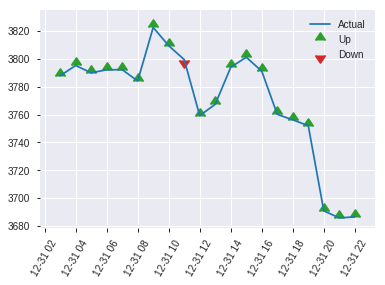


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.22862178201848848
RMSE: 0.4781441017292679
LogLoss: 0.6462372735770615
Null degrees of freedom: 870
Residual degrees of freedom: 820
Null deviance: 1201.3614369590905
Residual deviance: 1125.745330571241
AIC: 1227.745330571241
AUC: 0.7190205785800036
pr_auc: 0.6523730270313871
Gini: 0.43804115716000713
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.22507868632354783: 


,0,1,Error,Rate
0,202.0,271.0,0.5729,(271.0/473.0)
1,49.0,349.0,0.1231,(49.0/398.0)
Total,251.0,620.0,0.3674,(320.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2250787,0.6856582,282.0
max f2,0.1264639,0.8217446,346.0
max f0point5,0.3318968,0.6304559,206.0
max accuracy,0.3318968,0.6624569,206.0
max precision,0.9000780,1.0,0.0
max recall,0.0610851,1.0,383.0
max specificity,0.9000780,1.0,0.0
max absolute_mcc,0.2833578,0.3386556,243.0
max min_per_class_accuracy,0.3296530,0.6608040,208.0
max mean_per_class_accuracy,0.2833578,0.6675210,243.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 33.73 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8036003,1.9452820,1.9452820,0.8888889,0.8670697,0.8888889,0.8670697,0.0201005,0.0201005,94.5281965,94.5281965
,2,0.0206659,0.7759574,1.9452820,1.9452820,0.8888889,0.7872822,0.8888889,0.8271760,0.0201005,0.0402010,94.5281965,94.5281965
,3,0.0309989,0.7477422,1.2158012,1.7021217,0.5555556,0.7636321,0.7777778,0.8059947,0.0125628,0.0527638,21.5801228,70.2121720
,4,0.0401837,0.7178869,2.1884422,1.8132807,1.0,0.7351515,0.8285714,0.7898020,0.0201005,0.0728643,118.8442211,81.3280689
,5,0.0505166,0.6960292,1.7021217,1.7905436,0.7777778,0.7065265,0.8181818,0.7727684,0.0175879,0.0904523,70.2121720,79.0543627
,6,0.1010333,0.5654697,1.4423824,1.6164630,0.6590909,0.6296952,0.7386364,0.7012318,0.0728643,0.1633166,44.2382366,61.6462997
,7,0.1504018,0.5044002,1.4759261,1.5703326,0.6744186,0.5306364,0.7175573,0.6452348,0.0728643,0.2361809,47.5926142,57.0332579
,8,0.2009185,0.4592306,1.4921197,1.5506676,0.6818182,0.4773999,0.7085714,0.6030363,0.0753769,0.3115578,49.2119689,55.0667624
,9,0.3008037,0.4103048,1.2828799,1.4617458,0.5862069,0.4317697,0.6679389,0.5461653,0.1281407,0.4396985,28.2879917,46.1745752
,10,0.4006889,0.3704014,1.1571074,1.3858044,0.5287356,0.3912764,0.6332378,0.5075541,0.1155779,0.5552764,15.7107376,38.5804380


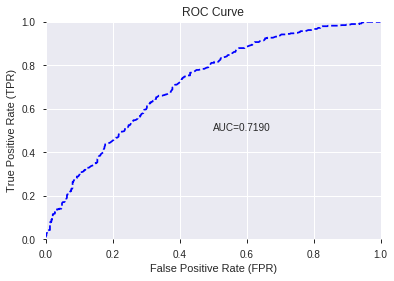

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


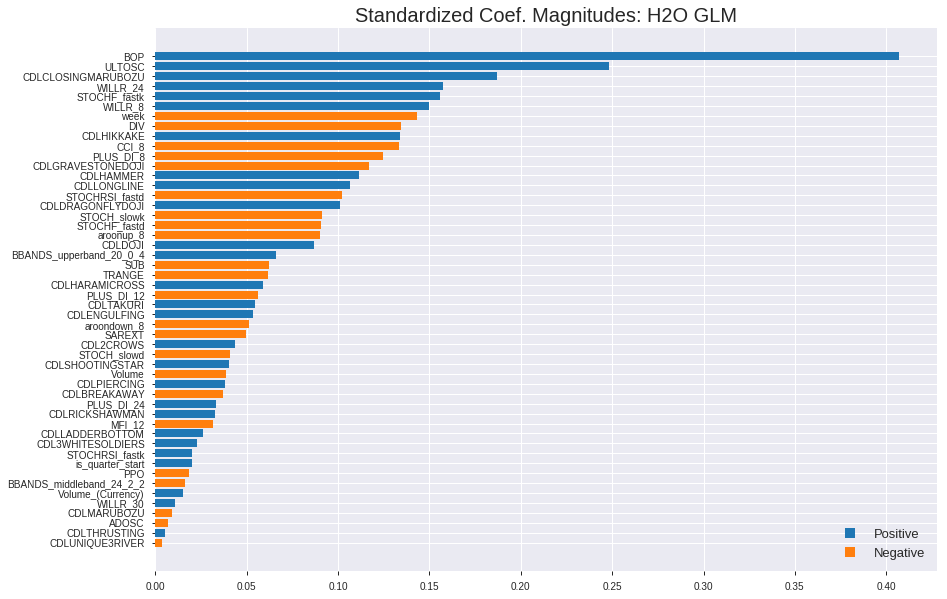

'log_likelihood'
--2019-07-25 05:09:05--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.128.123
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.128.123|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


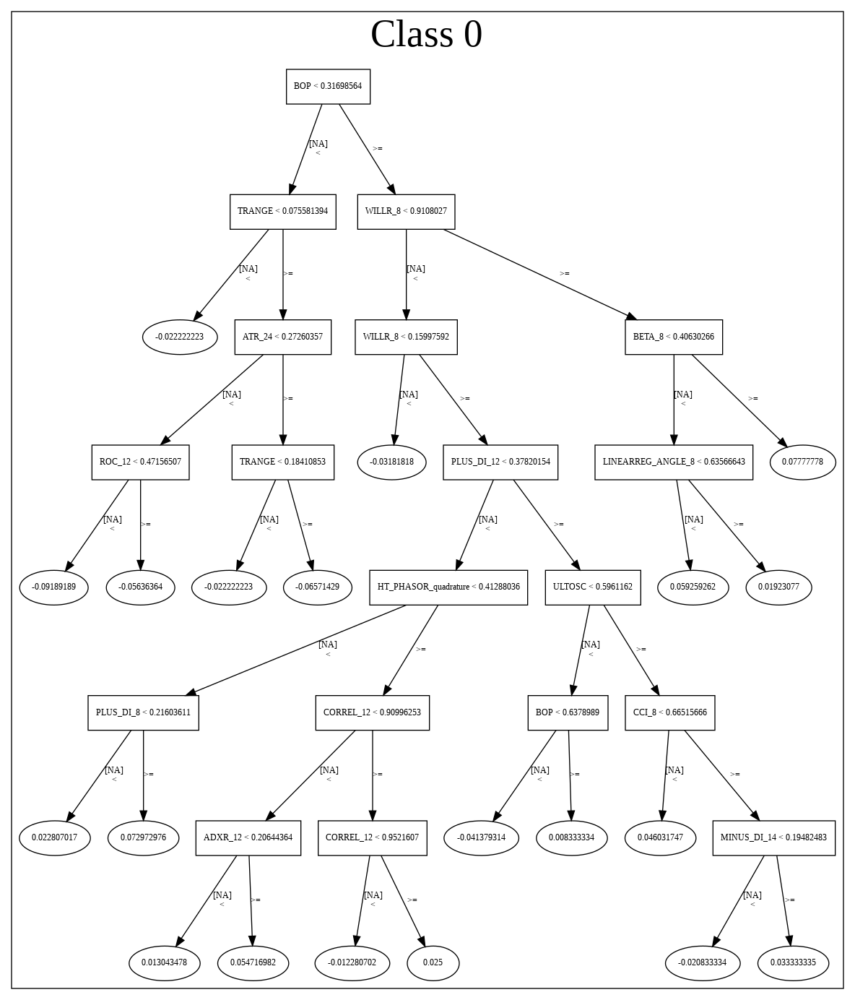

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190725_050852_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190725_050852_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_18_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_18_s

['BOP',
 'ULTOSC',
 'CDLCLOSINGMARUBOZU',
 'WILLR_24',
 'STOCHF_fastk',
 'WILLR_8',
 'week',
 'DIV',
 'CDLHIKKAKE',
 'CCI_8',
 'PLUS_DI_8',
 'CDLGRAVESTONEDOJI',
 'CDLHAMMER',
 'CDLLONGLINE',
 'STOCHRSI_fastd',
 'CDLDRAGONFLYDOJI',
 'STOCH_slowk',
 'STOCHF_fastd',
 'aroonup_8',
 'CDLDOJI',
 'BBANDS_upperband_20_0_4',
 'SUB',
 'TRANGE',
 'CDLHARAMICROSS',
 'PLUS_DI_12',
 'CDLTAKURI',
 'CDLENGULFING',
 'aroondown_8',
 'SAREXT',
 'CDL2CROWS',
 'STOCH_slowd',
 'CDLSHOOTINGSTAR',
 'Volume',
 'CDLPIERCING',
 'CDLBREAKAWAY',
 'PLUS_DI_24',
 'CDLRICKSHAWMAN',
 'MFI_12',
 'CDLLADDERBOTTOM',
 'CDL3WHITESOLDIERS',
 'STOCHRSI_fastk',
 'is_quarter_start',
 'PPO',
 'BBANDS_middleband_24_2_2',
 'Volume_(Currency)',
 'WILLR_30',
 'CDLMARUBOZU',
 'ADOSC',
 'CDLTHRUSTING',
 'CDLUNIQUE3RIVER']

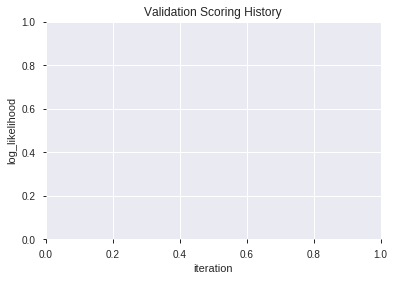

In [0]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20190725_051003,0.743503,0.599541,0.310464,0.455216,0.207222
1,XGBoost_grid_1_AutoML_20190725_051003_model_4,0.739716,0.601179,0.321218,0.456188,0.208107
2,XGBoost_3_AutoML_20190725_051003,0.739466,0.603534,0.326686,0.457485,0.209292
3,XGBoost_grid_1_AutoML_20190725_051003_model_2,0.737480,0.606218,0.329581,0.458521,0.210241
4,XGBoost_grid_1_AutoML_20190725_051003_model_1,0.736115,0.603031,0.351841,0.457751,0.209536
5,XGBoost_1_AutoML_20190725_051003,0.735655,0.603988,0.316392,0.457622,0.209418
6,XGBoost_grid_1_AutoML_20190725_051003_model_5,0.735073,0.607059,0.335557,0.457946,0.209715
7,XGBoost_grid_1_AutoML_20190725_051003_model_7,0.733865,0.604465,0.325048,0.458204,0.209951
8,XGBoost_grid_1_AutoML_20190725_051003_model_3,0.733190,0.605654,0.333090,0.458518,0.210239
9,XGBoost_grid_1_AutoML_20190725_051003_model_6,0.731275,0.608050,0.331374,0.460113,0.211704


,variable,relative_importance,scaled_importance,percentage
0,BOP,3711.000977,1.000000,0.147424
1,STOCHRSI_fastk,1282.067017,0.345477,0.050932
2,STOCHF_fastk,1177.863525,0.317398,0.046792
3,ULTOSC,1166.364014,0.314299,0.046335
4,CCI_8,1148.838257,0.309576,0.045639
5,DIV,984.158813,0.265200,0.039097
6,STOCHRSI_fastd,858.921143,0.231453,0.034122
7,ADOSC,858.000977,0.231205,0.034085
8,WILLR_8,840.877563,0.226590,0.033405
9,PPO,817.005005,0.220158,0.032457


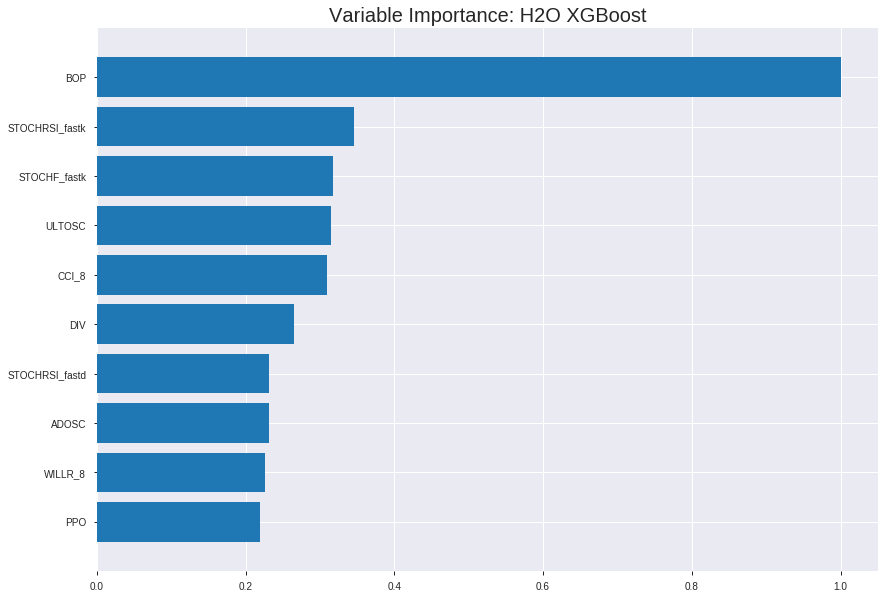

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20190725_051003


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.14175752258231195
RMSE: 0.376507002036233
LogLoss: 0.45138099122020864
Mean Per-Class Error: 0.17534896703926695
AUC: 0.9072225460457446
pr_auc: 0.8868749806681772
Gini: 0.8144450920914892
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47185409494808744: 


,0,1,Error,Rate
0,2775.0,597.0,0.177,(597.0/3372.0)
1,477.0,2246.0,0.1752,(477.0/2723.0)
Total,3252.0,2843.0,0.1762,(1074.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4718541,0.8070428,194.0
max f2,0.3452764,0.8715254,257.0
max f0point5,0.5603923,0.8277704,151.0
max accuracy,0.5143235,0.8270714,174.0
max precision,0.9148190,1.0,0.0
max recall,0.1380472,1.0,356.0
max specificity,0.9148190,1.0,0.0
max absolute_mcc,0.5143235,0.6492441,174.0
max min_per_class_accuracy,0.4732670,0.8233566,193.0
max mean_per_class_accuracy,0.4809246,0.8246510,190.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 44.85 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.8728820,2.2383401,2.2383401,1.0,0.8911704,1.0,0.8911704,0.0224018,0.0224018,123.8340066,123.8340066
,2,0.0200164,0.8495822,2.2016460,2.2199930,0.9836066,0.8610309,0.9918033,0.8761006,0.0220345,0.0444363,120.1645967,121.9993016
,3,0.0300246,0.8331980,2.2383401,2.2261087,1.0,0.8407736,0.9945355,0.8643249,0.0224018,0.0668380,123.8340066,122.6108700
,4,0.0400328,0.8175852,2.2016460,2.2199930,0.9836066,0.8245547,0.9918033,0.8543824,0.0220345,0.0888726,120.1645967,121.9993016
,5,0.0500410,0.8062389,2.1282578,2.2016460,0.9508197,0.8118172,0.9836066,0.8458694,0.0213000,0.1101726,112.8257768,120.1645967
,6,0.1000820,0.7550262,2.1355966,2.1686213,0.9540984,0.7795918,0.9688525,0.8127306,0.1068674,0.2170400,113.5596588,116.8621277
,7,0.1501231,0.7146738,2.0989025,2.1453817,0.9377049,0.7336765,0.9584699,0.7863792,0.1050312,0.3220712,109.8902488,114.5381681
,8,0.2,0.6712569,2.0321772,2.1171502,0.9078947,0.6921783,0.9458573,0.7628870,0.1013588,0.4234300,103.2177165,111.7150202
,9,0.3000820,0.5976620,1.7980109,2.0107123,0.8032787,0.6352102,0.8983051,0.7203048,0.1799486,0.6033786,79.8010873,101.0712263
,10,0.4,0.5197309,1.4775250,1.8775248,0.6600985,0.5573031,0.8388023,0.6795878,0.1476313,0.7510099,47.7524970,87.7524789




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.21211608077354985
RMSE: 0.4605606157429767
LogLoss: 0.6118260489180747
Mean Per-Class Error: 0.31360943565323596
AUC: 0.7377220550869947
pr_auc: 0.6798863804520254
Gini: 0.47544411017398946
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42498915394147235: 


,0,1,Error,Rate
0,487.0,504.0,0.5086,(504.0/991.0)
1,135.0,616.0,0.1798,(135.0/751.0)
Total,622.0,1120.0,0.3668,(639.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4249892,0.6584714,237.0
max f2,0.1293310,0.7974414,375.0
max f0point5,0.6461492,0.6468823,124.0
max accuracy,0.6461492,0.6917336,124.0
max precision,0.9255542,1.0,0.0
max recall,0.0517969,1.0,399.0
max specificity,0.9255542,1.0,0.0
max absolute_mcc,0.5585702,0.3706399,170.0
max min_per_class_accuracy,0.5465940,0.6777630,177.0
max mean_per_class_accuracy,0.5585702,0.6863906,170.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 51.35 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8754792,1.9329783,1.9329783,0.8333333,0.8923015,0.8333333,0.8923015,0.0199734,0.0199734,93.2978251,93.2978251
,2,0.0200918,0.8610529,2.3195739,2.1207533,1.0,0.8686752,0.9142857,0.8808258,0.0226365,0.0426099,131.9573901,112.0753281
,3,0.0304248,0.8474605,1.9329783,2.0569806,0.8333333,0.8543474,0.8867925,0.8718332,0.0199734,0.0625832,93.2978251,105.6980630
,4,0.0401837,0.8347039,2.0466829,2.0544797,0.8823529,0.8420258,0.8857143,0.8645942,0.0199734,0.0825566,104.6682854,105.4479741
,5,0.0505166,0.8252728,1.9329783,2.0296272,0.8333333,0.8308259,0.875,0.8576871,0.0199734,0.1025300,93.2978251,102.9627164
,6,0.1004592,0.7797495,1.7063532,1.8689138,0.7356322,0.7978847,0.8057143,0.8279567,0.0852197,0.1877497,70.6353215,86.8913829
,7,0.1504018,0.7426942,1.6796914,1.8060804,0.7241379,0.7599351,0.7786260,0.8053694,0.0838881,0.2716378,67.9691446,80.6080442
,8,0.2003444,0.7143856,1.4663973,1.7214030,0.6321839,0.7276414,0.7421203,0.7859931,0.0732357,0.3448735,46.6397294,72.1402981
,9,0.3002296,0.6578697,1.3997429,1.6143880,0.6034483,0.6854788,0.6959847,0.7525524,0.1398136,0.4846871,39.9742872,61.4387954
,10,0.4006889,0.5973830,1.1266502,1.4921041,0.4857143,0.6268054,0.6432665,0.7210256,0.1131824,0.5978695,12.6650181,49.2104129



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 05:10:08,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5532404,0.5,0.6931472,0.5,0.0,1.0,0.5688863
,2019-07-25 05:10:08,0.215 sec,5.0,0.4768386,0.6476306,0.8151143,0.7762378,2.2016460,0.2885972,0.4871107,0.6675817,0.7104500,0.6356804,1.8041130,0.3639495
,2019-07-25 05:10:08,0.383 sec,10.0,0.4587730,0.6127130,0.8327894,0.7950202,2.2383401,0.2600492,0.4780390,0.6496167,0.7226362,0.6557545,1.9329783,0.3490241
,2019-07-25 05:10:08,0.552 sec,15.0,0.4441091,0.5842590,0.8429081,0.8077140,2.2016460,0.2495488,0.4701672,0.6338214,0.7314902,0.6668236,1.9329783,0.3605052
,2019-07-25 05:10:08,0.779 sec,20.0,0.4324754,0.5614889,0.8524856,0.8217659,2.2016460,0.2510254,0.4670732,0.6271509,0.7330616,0.6669700,1.9329783,0.3461538
,2019-07-25 05:10:09,0.971 sec,25.0,0.4231751,0.5430099,0.8591085,0.8298749,2.2383401,0.2344545,0.4640438,0.6207313,0.7354069,0.6708565,1.9329783,0.3513203
,2019-07-25 05:10:09,1.166 sec,30.0,0.4152122,0.5270097,0.8648790,0.8361881,2.2383401,0.2241181,0.4618422,0.6158409,0.7369602,0.6731837,1.9329783,0.3467279
,2019-07-25 05:10:09,1.366 sec,35.0,0.4081032,0.5129348,0.8724725,0.8446223,2.2383401,0.2198523,0.4611881,0.6141319,0.7362071,0.6730428,2.0618435,0.3478760
,2019-07-25 05:10:09,1.582 sec,40.0,0.4020755,0.5007175,0.8778374,0.8512728,2.2016460,0.2157506,0.4605996,0.6125486,0.7370402,0.6745354,2.0618435,0.3582090
,2019-07-25 05:10:09,1.810 sec,45.0,0.3962421,0.4892675,0.8845108,0.8589766,2.2383401,0.2036095,0.4604847,0.6121334,0.7360129,0.6752655,2.0618435,0.3541906


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,3711.0009766,1.0,0.1474243
STOCHRSI_fastk,1282.0670166,0.3454774,0.0509318
STOCHF_fastk,1177.8635254,0.3173978,0.0467921
ULTOSC,1166.3640137,0.3142990,0.0463353
CCI_8,1148.8382568,0.3095764,0.0456391
---,---,---,---
CDLHAMMER,107.6605835,0.0290112,0.0042770
CDLDOJI,79.2643433,0.0213593,0.0031489
CDLTAKURI,39.4267082,0.0106243,0.0015663
CDLENGULFING,13.9053230,0.0037471,0.0005524



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6900114810562572)

('F1', 0.6964091403699673)

('auc', 0.7435034580938519)

('logloss', 0.5995414231701103)

('mean_per_class_error', 0.3057916432054564)

('rmse', 0.45521609111324696)

('mse', 0.20722168960842394)

xgboost prediction progress: |████████████████████████████████████████████| 100%


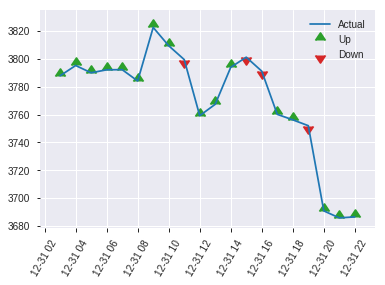


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.20722168960842394
RMSE: 0.45521609111324696
LogLoss: 0.5995414231701103
Mean Per-Class Error: 0.3057916432054564
AUC: 0.7435034580938519
pr_auc: 0.6762558337584172
Gini: 0.48700691618770375
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33224694927533466: 


,0,1,Error,Rate
0,272.0,201.0,0.4249,(201.0/473.0)
1,78.0,320.0,0.196,(78.0/398.0)
Total,350.0,521.0,0.3203,(279.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3322469,0.6964091,243.0
max f2,0.1062630,0.8236030,368.0
max f0point5,0.3988274,0.6578947,208.0
max accuracy,0.3988274,0.6900115,208.0
max precision,0.8830329,1.0,0.0
max recall,0.0906907,1.0,379.0
max specificity,0.8830329,1.0,0.0
max absolute_mcc,0.3718189,0.3885757,222.0
max min_per_class_accuracy,0.4171400,0.6783920,197.0
max mean_per_class_accuracy,0.3718189,0.6942084,222.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 40.84 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8452469,1.7021217,1.7021217,0.7777778,0.8593708,0.7777778,0.8593708,0.0175879,0.0175879,70.2121720,70.2121720
,2,0.0206659,0.8056712,1.7021217,1.7021217,0.7777778,0.8254664,0.7777778,0.8424186,0.0175879,0.0351759,70.2121720,70.2121720
,3,0.0309989,0.7790756,1.4589615,1.6210683,0.6666667,0.7915554,0.7407407,0.8254642,0.0150754,0.0502513,45.8961474,62.1068304
,4,0.0401837,0.7613962,1.6413317,1.6256999,0.75,0.7726612,0.7428571,0.8133950,0.0150754,0.0653266,64.1331658,62.5699928
,5,0.0505166,0.7314820,1.7021217,1.6413317,0.7777778,0.7507064,0.75,0.8005723,0.0175879,0.0829146,70.2121720,64.1331658
,6,0.1010333,0.6828995,1.7408063,1.6910690,0.7954545,0.7023788,0.7727273,0.7514756,0.0879397,0.1708543,74.0806304,69.1068981
,7,0.1504018,0.6432779,1.5268201,1.6371552,0.6976744,0.6618101,0.7480916,0.7220434,0.0753769,0.2462312,52.6820147,63.7155242
,8,0.2009185,0.6082684,1.5418570,1.6131945,0.7045455,0.6265383,0.7371429,0.6980307,0.0778894,0.3241206,54.1857012,61.3194544
,9,0.3008037,0.5438907,1.2325709,1.4868043,0.5632184,0.5777485,0.6793893,0.6580897,0.1231156,0.4472362,23.2570900,48.6804250
,10,0.4006889,0.4762738,1.3331889,1.4485105,0.6091954,0.5100394,0.6618911,0.6211832,0.1331658,0.5804020,33.3188933,44.8510461


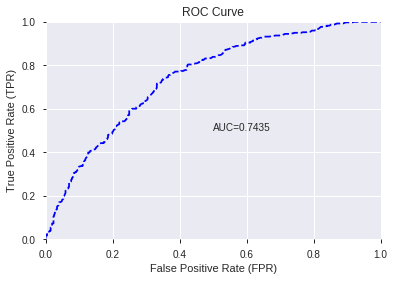

This function is available for GLM models only


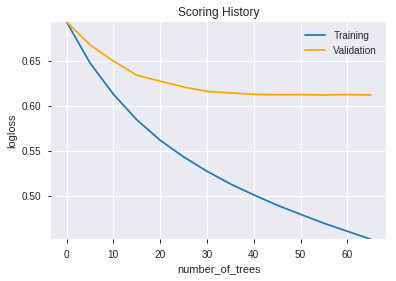

--2019-07-25 05:10:46--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.109.11
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.109.11|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


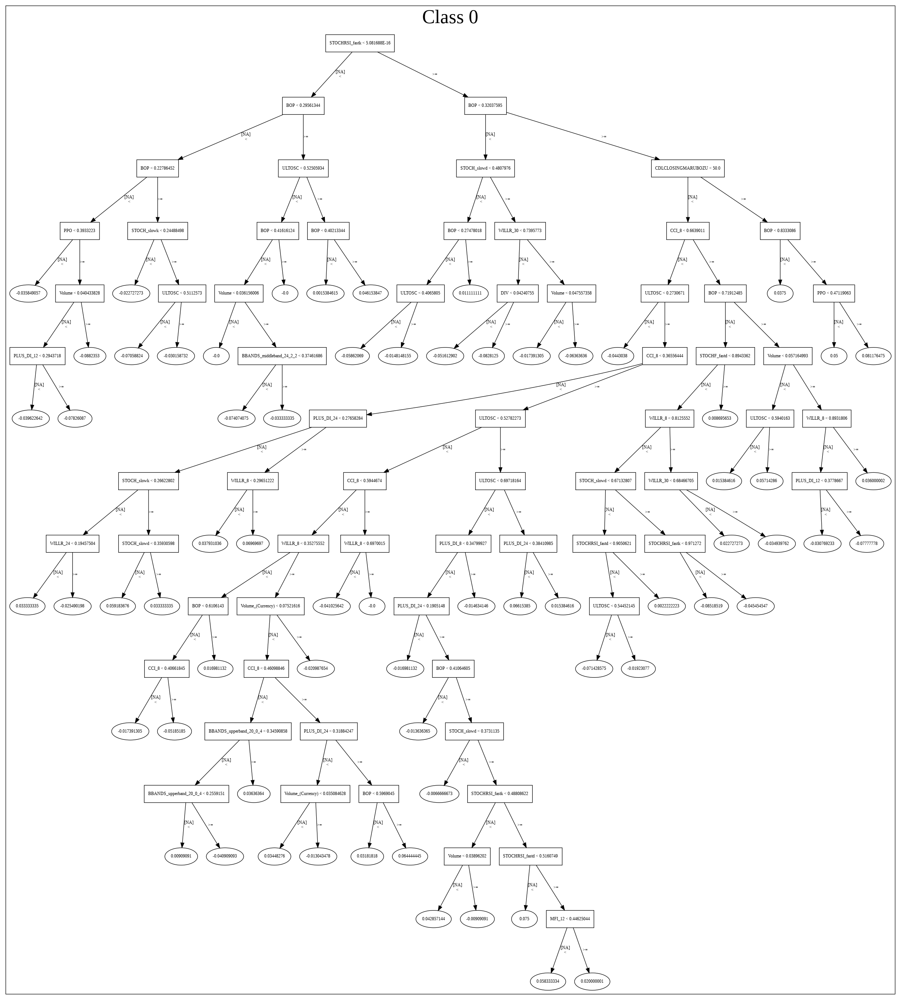

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20190725_051003',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20190725_051003',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_26_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_26_sid_8dc6',
   'type

['BOP',
 'STOCHRSI_fastk',
 'STOCHF_fastk',
 'ULTOSC',
 'CCI_8',
 'DIV',
 'STOCHRSI_fastd',
 'ADOSC',
 'WILLR_8',
 'PPO',
 'TRANGE',
 'STOCH_slowd',
 'Volume',
 'CDLCLOSINGMARUBOZU',
 'MFI_12',
 'week',
 'WILLR_24',
 'PLUS_DI_24',
 'STOCH_slowk',
 'SAREXT',
 'WILLR_30',
 'BBANDS_middleband_24_2_2',
 'Volume_(Currency)',
 'aroonup_8',
 'PLUS_DI_12',
 'PLUS_DI_8',
 'BBANDS_upperband_20_0_4',
 'SUB',
 'aroondown_8',
 'CDLLONGLINE',
 'STOCHF_fastd',
 'CDLHIKKAKE',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLHAMMER',
 'CDLDOJI',
 'CDLTAKURI',
 'CDLENGULFING',
 'CDLRICKSHAWMAN']

In [0]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190725_051144_model_1,0.726229,0.61329,0.352837,0.462676,0.214069


,variable,relative_importance,scaled_importance,percentage
0,BOP,4.356195e-01,1.000000,3.090070e-02
1,DIV,3.054036e-01,0.701079,2.166383e-02
2,ULTOSC,3.053993e-01,0.701069,2.166352e-02
3,CCI_8,2.538291e-01,0.582685,1.800539e-02
4,STOCHF_fastk,2.074086e-01,0.476123,1.471255e-02
5,CDLCLOSINGMARUBOZU,1.921339e-01,0.441059,1.362904e-02
6,LINEARREG_ANGLE_8,1.757514e-01,0.403452,1.246694e-02
7,SUB,1.752063e-01,0.402200,1.242827e-02
8,TRANGE,1.732418e-01,0.397691,1.228892e-02
9,CDLHIKKAKE,1.505752e-01,0.345658,1.068106e-02


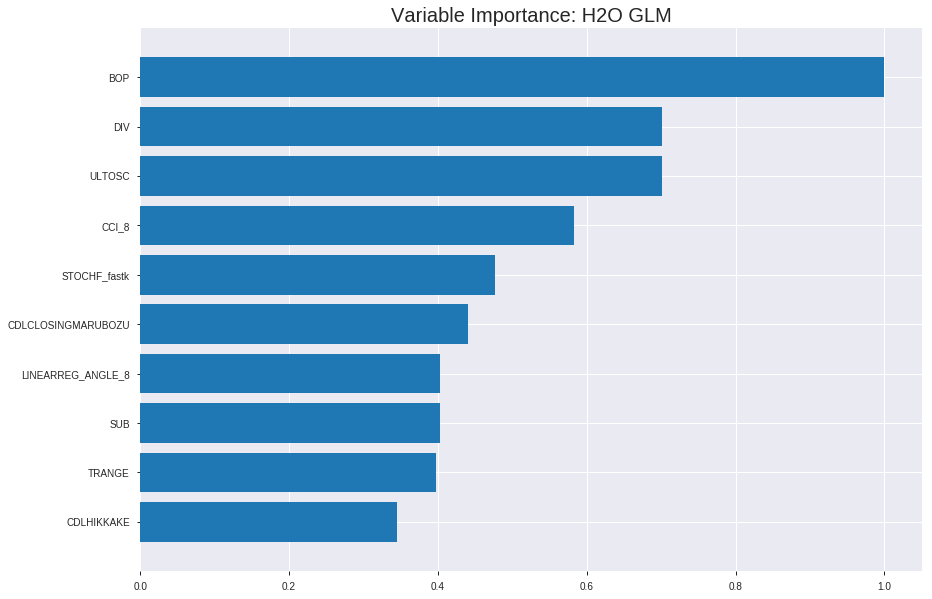

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190725_051144_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19269459870752617
RMSE: 0.4389699291609007
LogLoss: 0.5654500466968523
Null degrees of freedom: 6094
Residual degrees of freedom: 5054
Null deviance: 8380.226957690009
Residual deviance: 6892.83606923463
AIC: 8974.836069234629
AUC: 0.7735814678266809
pr_auc: 0.7121782416875323
Gini: 0.5471629356533618
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36114609046100954: 


,0,1,Error,Rate
0,1821.0,1551.0,0.46,(1551.0/3372.0)
1,385.0,2338.0,0.1414,(385.0/2723.0)
Total,2206.0,3889.0,0.3176,(1936.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3611461,0.7071990,250.0
max f2,0.2310650,0.8239783,312.0
max f0point5,0.5424504,0.6653603,158.0
max accuracy,0.4752850,0.7000820,192.0
max precision,0.9908275,1.0,0.0
max recall,0.0357000,1.0,389.0
max specificity,0.9908275,1.0,0.0
max absolute_mcc,0.3611461,0.4124154,250.0
max min_per_class_accuracy,0.4639982,0.6962909,198.0
max mean_per_class_accuracy,0.3932235,0.7012045,234.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 44.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.9008995,2.1282578,2.1282578,0.9508197,0.9254848,0.9508197,0.9254848,0.0213000,0.0213000,112.8257768,112.8257768
,2,0.0200164,0.8696386,1.7246227,1.9264402,0.7704918,0.8835963,0.8606557,0.9045405,0.0172604,0.0385604,72.4622674,92.6440221
,3,0.0300246,0.8514254,1.7246227,1.8591677,0.7704918,0.8601078,0.8306011,0.8897296,0.0172604,0.0558208,72.4622674,85.9167705
,4,0.0400328,0.8334286,1.9814814,1.8897461,0.8852459,0.8434569,0.8442623,0.8781615,0.0198311,0.0756519,98.1481370,88.9746121
,5,0.0500410,0.8083093,1.7613168,1.8640603,0.7868852,0.8204638,0.8327869,0.8666219,0.0176276,0.0932795,76.1316773,86.4060252
,6,0.1000820,0.7356441,1.8200273,1.8420438,0.8131148,0.7691326,0.8229508,0.8178772,0.0910760,0.1843555,82.0027332,84.2043792
,7,0.1501231,0.6865723,1.7246227,1.8029034,0.7704918,0.7105210,0.8054645,0.7820918,0.0863019,0.2706574,72.4622674,80.2903419
,8,0.2,0.6433299,1.5314958,1.7352185,0.6842105,0.6649798,0.7752256,0.7528859,0.0763863,0.3470437,53.1495835,73.5218509
,9,0.3000820,0.5733513,1.3833675,1.6178707,0.6180328,0.6064289,0.7227993,0.7040402,0.1384502,0.4854939,38.3367549,61.7870731
,10,0.4,0.5122422,1.2386217,1.5231362,0.5533662,0.5415179,0.6804758,0.6634430,0.1237606,0.6092545,23.8621679,52.3136247




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.20491441219530307
RMSE: 0.452674731120816
LogLoss: 0.5989021329261253
Null degrees of freedom: 1741
Residual degrees of freedom: 701
Null deviance: 2383.4834095378615
Residual deviance: 2086.5750311146203
AIC: 4168.57503111462
AUC: 0.7373888296936073
pr_auc: 0.6796565294314624
Gini: 0.4747776593872146
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3889652866006593: 


,0,1,Error,Rate
0,562.0,429.0,0.4329,(429.0/991.0)
1,169.0,582.0,0.225,(169.0/751.0)
Total,731.0,1011.0,0.3433,(598.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3889653,0.6606129,237.0
max f2,0.1489358,0.7969124,354.0
max f0point5,0.5500613,0.6430191,153.0
max accuracy,0.5211784,0.6900115,169.0
max precision,0.9873972,1.0,0.0
max recall,0.0088930,1.0,397.0
max specificity,0.9873972,1.0,0.0
max absolute_mcc,0.4620310,0.3707300,201.0
max min_per_class_accuracy,0.4620310,0.6841574,201.0
max mean_per_class_accuracy,0.4620310,0.6869522,201.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 44.81 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.9017872,2.3195739,2.3195739,1.0,0.9237362,1.0,0.9237362,0.0239680,0.0239680,131.9573901,131.9573901
,2,0.0200918,0.8828666,2.0466829,2.1870268,0.8823529,0.8888227,0.9428571,0.9067782,0.0199734,0.0439414,104.6682854,118.7026821
,3,0.0304248,0.8664895,1.9329783,2.1007462,0.8333333,0.8762719,0.9056604,0.8964176,0.0199734,0.0639148,93.2978251,110.0746175
,4,0.0401837,0.8513809,1.5009008,1.9550694,0.6470588,0.8592868,0.8428571,0.8874001,0.0146471,0.0785619,50.0900760,95.5069431
,5,0.0505166,0.8383893,1.8041130,1.9241920,0.7777778,0.8460016,0.8295455,0.8789322,0.0186418,0.0972037,80.4113034,92.4191986
,6,0.1004592,0.7461766,1.8929856,1.9086780,0.8160920,0.7885806,0.8228571,0.8340145,0.0945406,0.1917443,89.2985598,90.8677953
,7,0.1504018,0.6893301,1.4130738,1.7441071,0.6091954,0.7185397,0.7519084,0.7956698,0.0705726,0.2623169,41.3073756,74.4107094
,8,0.2003444,0.6445612,1.5463826,1.6948176,0.6666667,0.6672340,0.7306590,0.7636529,0.0772304,0.3395473,54.6382601,69.4817607
,9,0.3002296,0.5678408,1.3597502,1.5833420,0.5862069,0.6032965,0.6826004,0.7103030,0.1358189,0.4753662,35.9750218,58.3342032
,10,0.4001148,0.5078476,1.2531031,1.5009008,0.5402299,0.5385088,0.6470588,0.6674160,0.1251664,0.6005326,25.3103142,50.0900760



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-07-25 05:11:55,0.000 sec,2,.16E2,1032,1.3542460,1.3510263
,2019-07-25 05:12:02,6.707 sec,4,.12E2,1041,1.3486205,1.3461611
,2019-07-25 05:12:09,13.539 sec,6,.87E1,1041,1.3416235,1.3399945
,2019-07-25 05:12:15,20.060 sec,8,.63E1,1041,1.3330185,1.3323354
,2019-07-25 05:12:21,26.503 sec,10,.46E1,1041,1.3226473,1.3230866
---,---,---,---,---,---,---,---
,2019-07-25 05:14:25,2 min 30.501 sec,48,.11E-1,1041,1.1278399,1.1981851
,2019-07-25 05:14:32,2 min 36.963 sec,50,.8E-2,1041,1.1251586,1.1989071
,2019-07-25 05:14:38,2 min 43.401 sec,52,.58E-2,1041,1.1227978,1.1999318
,2019-07-25 05:14:45,2 min 50.005 sec,54,.42E-2,1041,1.1206491,1.2012733



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6647531572904707)

('F1', 0.6888677450047573)

('auc', 0.726228924750603)

('logloss', 0.6132900234319653)

('mean_per_class_error', 0.33257195066240297)

('rmse', 0.4626761164218497)

('mse', 0.214069188707205)

glm prediction progress: |████████████████████████████████████████████████| 100%


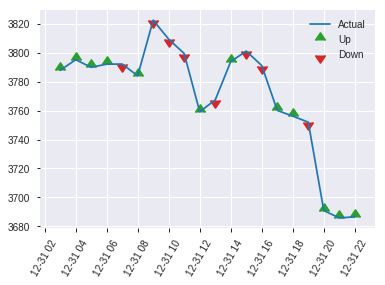


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.214069188707205
RMSE: 0.4626761164218497
LogLoss: 0.6132900234319653
Null degrees of freedom: 870
Residual degrees of freedom: -170
Null deviance: 1201.3614369590905
Residual deviance: 1068.3512208184834
AIC: 3150.3512208184834
AUC: 0.726228924750603
pr_auc: 0.6674829664698207
Gini: 0.45245784950120593
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.24108880304415675: 


,0,1,Error,Rate
0,182.0,291.0,0.6152,(291.0/473.0)
1,36.0,362.0,0.0905,(36.0/398.0)
Total,218.0,653.0,0.3754,(327.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2410888,0.6888677,290.0
max f2,0.1789316,0.8261432,322.0
max f0point5,0.4551989,0.6344587,166.0
max accuracy,0.4551989,0.6647532,166.0
max precision,0.9473750,1.0,0.0
max recall,0.0678164,1.0,378.0
max specificity,0.9473750,1.0,0.0
max absolute_mcc,0.2410888,0.3384664,290.0
max min_per_class_accuracy,0.3983361,0.6608040,203.0
max mean_per_class_accuracy,0.3797484,0.6674280,212.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 39.35 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8531329,1.9452820,1.9452820,0.8888889,0.8913984,0.8888889,0.8913984,0.0201005,0.0201005,94.5281965,94.5281965
,2,0.0206659,0.8349390,1.9452820,1.9452820,0.8888889,0.8439490,0.8888889,0.8676737,0.0201005,0.0402010,94.5281965,94.5281965
,3,0.0309989,0.8158464,1.7021217,1.8642286,0.7777778,0.8253614,0.8518519,0.8535696,0.0175879,0.0577889,70.2121720,86.4228550
,4,0.0401837,0.7925558,1.0942211,1.6882268,0.5,0.8043562,0.7714286,0.8423208,0.0100503,0.0678392,9.4221106,68.8226849
,5,0.0505166,0.7697231,1.9452820,1.7408063,0.8888889,0.7825710,0.7954545,0.8300993,0.0201005,0.0879397,94.5281965,74.0806304
,6,0.1010333,0.6679595,1.6910690,1.7159376,0.7727273,0.7124588,0.7840909,0.7712791,0.0854271,0.1733668,69.1068981,71.5937643
,7,0.1504018,0.6035732,1.3741381,1.6037439,0.6279070,0.6375838,0.7328244,0.7273944,0.0678392,0.2412060,37.4138133,60.3743910
,8,0.2009185,0.5637088,1.2931704,1.5256569,0.5909091,0.5810547,0.6971429,0.6906004,0.0653266,0.3065327,29.3170397,52.5656856
,9,0.3008037,0.4931025,1.3583434,1.4700986,0.6206897,0.5251904,0.6717557,0.6356742,0.1356784,0.4422111,35.8343441,47.0098585
,10,0.4006889,0.4462207,1.2074164,1.4046162,0.5517241,0.4694783,0.6418338,0.5942443,0.1206030,0.5628141,20.7416392,40.4616204


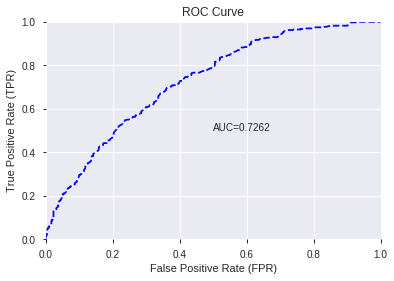

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


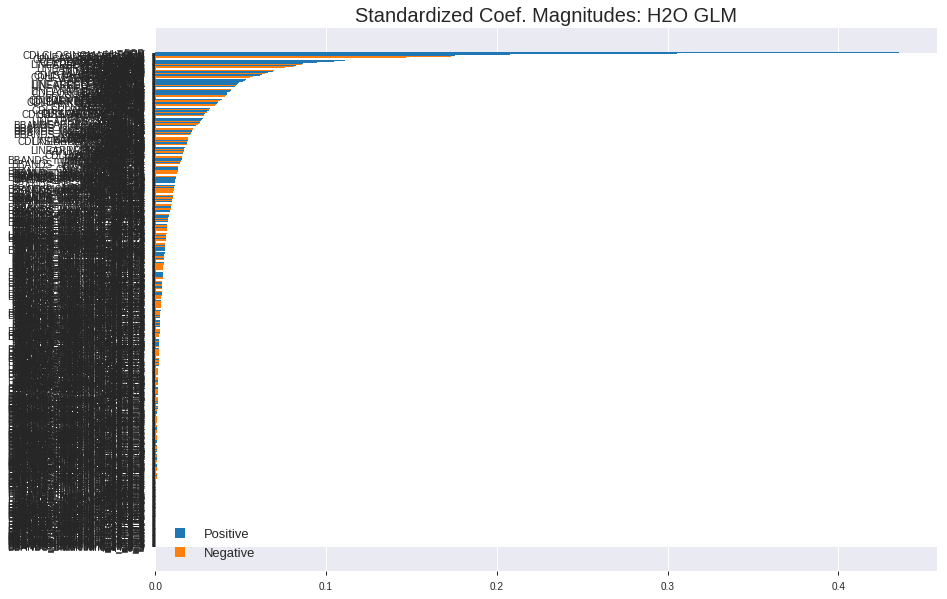

'log_likelihood'
--2019-07-25 05:15:18--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.184.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.184.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


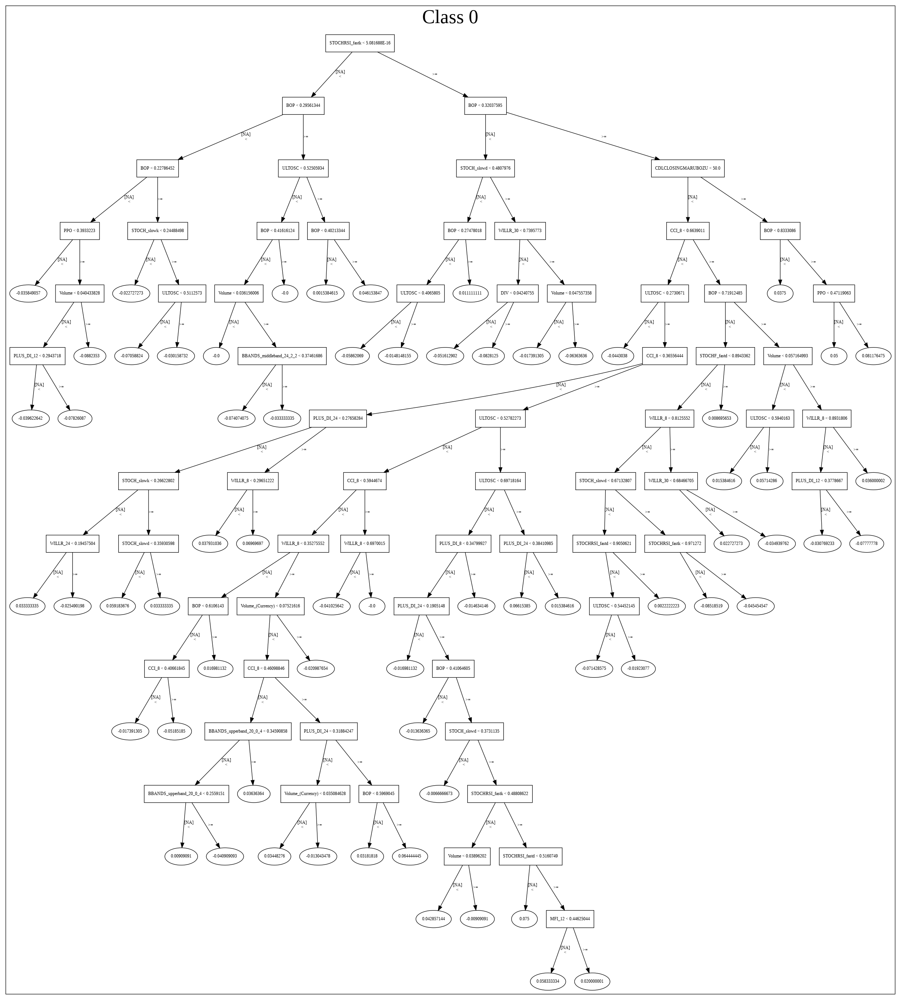

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190725_051144_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190725_051144_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_34_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_34_s

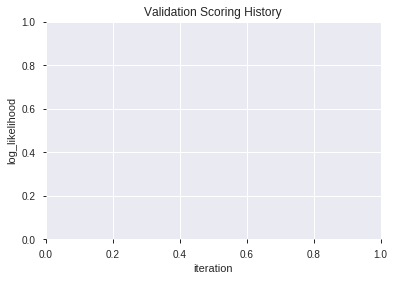

In [0]:
# GLM
glm_features = model_train(feature_name='All',model_algo="GLM")

In [0]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [0]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [0]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20190725_051617,0.747283,0.595196,0.315396,0.453175,0.205368
1,XGBoost_grid_1_AutoML_20190725_051617_model_7,0.746340,0.593073,0.334806,0.451745,0.204074
2,XGBoost_1_AutoML_20190725_051617,0.745416,0.594742,0.313420,0.452613,0.204858
3,XGBoost_grid_1_AutoML_20190725_051617_model_1,0.744319,0.594292,0.330256,0.453157,0.205351
4,XGBoost_grid_1_AutoML_20190725_051617_model_4,0.743602,0.599961,0.327943,0.455496,0.207477
5,XGBoost_grid_1_AutoML_20190725_051617_model_3,0.742627,0.604032,0.326625,0.456899,0.208757
6,XGBoost_3_AutoML_20190725_051617,0.742515,0.597092,0.324036,0.454735,0.206784
7,XGBoost_grid_1_AutoML_20190725_051617_model_2,0.739437,0.602145,0.314737,0.456274,0.208186
8,XGBoost_grid_1_AutoML_20190725_051617_model_6,0.737700,0.605516,0.336582,0.458062,0.209820
9,XGBoost_grid_1_AutoML_20190725_051617_model_5,0.719037,0.615140,0.348364,0.461648,0.213119


,variable,relative_importance,scaled_importance,percentage
0,BOP,4882.004883,1.000000,0.153954
1,DIV,999.527527,0.204737,0.031520
2,ULTOSC,755.127563,0.154676,0.023813
3,CCI_8,720.100830,0.147501,0.022708
4,STOCHF_fastk,670.795349,0.137402,0.021154
5,CDLCLOSINGMARUBOZU,564.909729,0.115713,0.017814
6,WILLR_8,558.731445,0.114447,0.017620
7,Volume,403.838715,0.082720,0.012735
8,TRANGE,358.842560,0.073503,0.011316
9,aroonup_8,342.132935,0.070080,0.010789


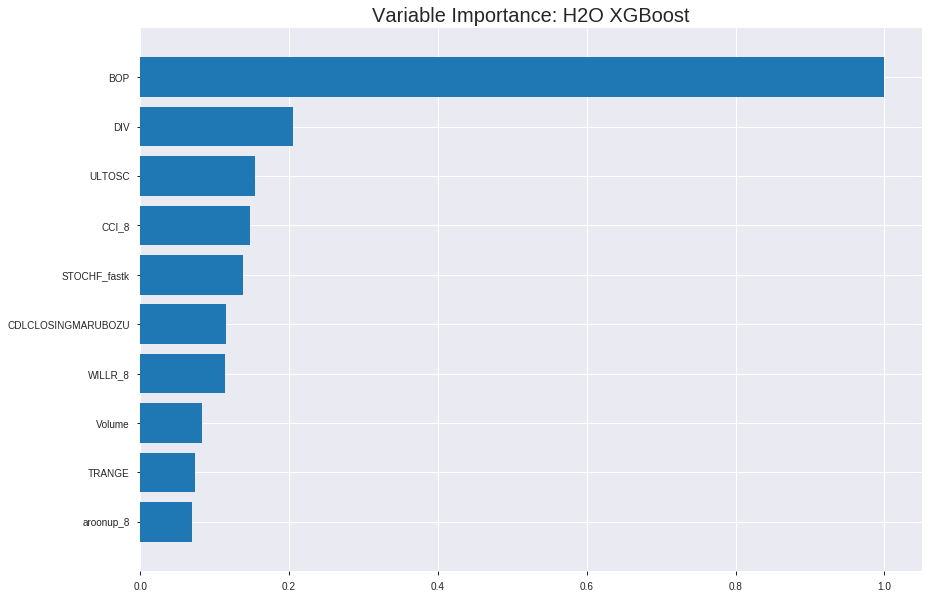

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20190725_051617


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.11979446614273095
RMSE: 0.3461133718057292
LogLoss: 0.4019747540239661
Mean Per-Class Error: 0.1148169845292224
AUC: 0.9520800905602249
pr_auc: 0.944491352127515
Gini: 0.9041601811204498
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4887880568320935: 


,0,1,Error,Rate
0,3041.0,331.0,0.0982,(331.0/3372.0)
1,358.0,2365.0,0.1315,(358.0/2723.0)
Total,3399.0,2696.0,0.113,(689.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4887881,0.8728548,183.0
max f2,0.3869265,0.9005648,231.0
max f0point5,0.5754704,0.8972536,145.0
max accuracy,0.4978368,0.8876128,180.0
max precision,0.9392086,1.0,0.0
max recall,0.1441149,1.0,350.0
max specificity,0.9392086,1.0,0.0
max absolute_mcc,0.4978368,0.7722707,180.0
max min_per_class_accuracy,0.4747179,0.8813808,190.0
max mean_per_class_accuracy,0.4887881,0.8851830,183.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 44.84 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.8837441,2.2383401,2.2383401,1.0,0.8986090,1.0,0.8986090,0.0224018,0.0224018,123.8340066,123.8340066
,2,0.0200164,0.8613315,2.2383401,2.2383401,1.0,0.8724022,1.0,0.8855056,0.0224018,0.0448035,123.8340066,123.8340066
,3,0.0300246,0.8446349,2.2383401,2.2383401,1.0,0.8539156,1.0,0.8749756,0.0224018,0.0672053,123.8340066,123.8340066
,4,0.0400328,0.8277434,2.2383401,2.2383401,1.0,0.8362776,1.0,0.8653011,0.0224018,0.0896071,123.8340066,123.8340066
,5,0.0500410,0.8159974,2.1649519,2.2236624,0.9672131,0.8216741,0.9934426,0.8565757,0.0216673,0.1112743,116.4951867,122.3662426
,6,0.1000820,0.7674601,2.2236624,2.2236624,0.9934426,0.7900033,0.9934426,0.8232895,0.1112743,0.2225487,122.3662426,122.3662426
,7,0.1501231,0.7260831,2.2016460,2.2163236,0.9836066,0.7457216,0.9901639,0.7974336,0.1101726,0.3327213,120.1645967,121.6323606
,8,0.2,0.6917815,2.1720734,2.2052883,0.9703947,0.7093402,0.9852338,0.7754644,0.1083364,0.4410577,117.2073419,120.5288285
,9,0.3000820,0.6168286,2.0805554,2.1636879,0.9295082,0.6542588,0.9666484,0.7350404,0.2082262,0.6492839,108.0555438,116.3687937
,10,0.4,0.5287876,1.6943756,2.0464561,0.7569787,0.5741951,0.9142740,0.6948621,0.1692986,0.8185824,69.4375649,104.6456115




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.20574209918318315
RMSE: 0.45358802804216863
LogLoss: 0.5974139223064167
Mean Per-Class Error: 0.3142288586627181
AUC: 0.7454037065950411
pr_auc: 0.6871589164813598
Gini: 0.49080741319008214
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45219320910317556: 


,0,1,Error,Rate
0,571.0,420.0,0.4238,(420.0/991.0)
1,158.0,593.0,0.2104,(158.0/751.0)
Total,729.0,1013.0,0.3318,(578.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4521932,0.6723356,220.0
max f2,0.1789145,0.8015598,354.0
max f0point5,0.5884149,0.6483977,144.0
max accuracy,0.5884149,0.6946039,144.0
max precision,0.9167699,1.0,0.0
max recall,0.0442594,1.0,399.0
max specificity,0.9167699,1.0,0.0
max absolute_mcc,0.4685501,0.3698967,211.0
max min_per_class_accuracy,0.5229266,0.6811302,182.0
max mean_per_class_accuracy,0.4742613,0.6857711,208.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 49.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8791580,2.1907087,2.1907087,0.9444444,0.8937356,0.9444444,0.8937356,0.0226365,0.0226365,119.0708685,119.0708685
,2,0.0200918,0.8646268,2.1831284,2.1870268,0.9411765,0.8733795,0.9428571,0.8838484,0.0213049,0.0439414,118.3128378,118.7026821
,3,0.0304248,0.8442236,1.8041130,2.0569806,0.7777778,0.8555719,0.8867925,0.8742450,0.0186418,0.0625832,80.4113034,105.6980630
,4,0.0401837,0.8259813,1.7737918,1.9882062,0.7647059,0.8333863,0.8571429,0.8643222,0.0173103,0.0798935,77.3791807,98.8206201
,5,0.0505166,0.8009949,1.6752478,1.9241920,0.7222222,0.8154592,0.8295455,0.8543275,0.0173103,0.0972037,67.5247818,92.4191986
,6,0.1004592,0.7474652,1.9196474,1.9219327,0.8275862,0.7706154,0.8285714,0.8127106,0.0958722,0.1930759,91.9647367,92.1932661
,7,0.1504018,0.7127825,1.5463826,1.7972271,0.6666667,0.7301320,0.7748092,0.7852895,0.0772304,0.2703063,54.6382601,79.7227107
,8,0.2003444,0.6818649,1.5197208,1.7280493,0.6551724,0.6973434,0.7449857,0.7633660,0.0758988,0.3462051,51.9720832,72.8049325
,9,0.3002296,0.6297587,1.3864120,1.6143880,0.5977011,0.6579767,0.6959847,0.7283034,0.1384820,0.4846871,38.6411987,61.4387954
,10,0.4001148,0.5694703,1.1197943,1.4909169,0.4827586,0.5995433,0.6427547,0.6961595,0.1118509,0.5965379,11.9794297,49.0916941



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 05:16:29,0.009 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5532404,0.5,0.6931472,0.5,0.0,1.0,0.5688863
,2019-07-25 05:16:33,3.225 sec,5.0,0.4738908,0.6419643,0.8329951,0.7963194,2.1661355,0.2667760,0.4835040,0.6604963,0.7204823,0.6495854,1.9329783,0.3484501
,2019-07-25 05:16:35,5.889 sec,10.0,0.4538372,0.6034368,0.8547901,0.8263005,2.2016460,0.2313372,0.4736506,0.6410026,0.7342823,0.6749637,2.1907087,0.3467279
,2019-07-25 05:16:38,8.393 sec,15.0,0.4381414,0.5733022,0.8676486,0.8400750,2.2016460,0.2201805,0.4668274,0.6272265,0.7383025,0.6799042,2.3195739,0.3432836
,2019-07-25 05:16:40,11.099 sec,20.0,0.4245586,0.5472849,0.8798100,0.8555788,2.2383401,0.2116489,0.4623743,0.6180506,0.7399303,0.6790856,2.0618435,0.3375431
,2019-07-25 05:16:43,13.747 sec,25.0,0.4127959,0.5245403,0.8886772,0.8675703,2.2383401,0.1885152,0.4576396,0.6081414,0.7459895,0.6859199,2.3195739,0.3369690
,2019-07-25 05:16:46,16.547 sec,30.0,0.4030460,0.5057338,0.8967090,0.8773569,2.2383401,0.1855619,0.4556490,0.6037468,0.7455361,0.6852375,2.0618435,0.3295063
,2019-07-25 05:16:48,19.135 sec,35.0,0.3941242,0.4886080,0.9052346,0.8877235,2.2383401,0.1745693,0.4546172,0.6011829,0.7457054,0.6867604,2.1907087,0.3392652
,2019-07-25 05:16:51,21.978 sec,40.0,0.3862081,0.4736495,0.9134267,0.8963128,2.2383401,0.1634126,0.4541814,0.5999280,0.7464800,0.6882438,2.1907087,0.3243398
,2019-07-25 05:16:54,24.674 sec,45.0,0.3786800,0.4596048,0.9212002,0.9080051,2.2383401,0.1494668,0.4538030,0.5988940,0.7450349,0.6856324,2.1907087,0.3329506


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,4882.0048828,1.0,0.1539541
DIV,999.5275269,0.2047371,0.0315201
ULTOSC,755.1275635,0.1546757,0.0238130
CCI_8,720.1008301,0.1475010,0.0227084
STOCHF_fastk,670.7953491,0.1374016,0.0211535
---,---,---,---
BBANDS_upperband_12_4_2,1.3362732,0.0002737,0.0000421
weekday_name,1.3238106,0.0002712,0.0000417
BBANDS_upperband_24_6_5,0.8230438,0.0001686,0.0000260
BBANDS_upperband_8_1_4,0.6379089,0.0001307,0.0000201



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6923076923076923)

('F1', 0.7043121149897331)

('auc', 0.747282926259203)

('logloss', 0.5951956341552509)

('mean_per_class_error', 0.2998316104837082)

('rmse', 0.4531754619200578)

('mse', 0.20536799928645777)

xgboost prediction progress: |████████████████████████████████████████████| 100%


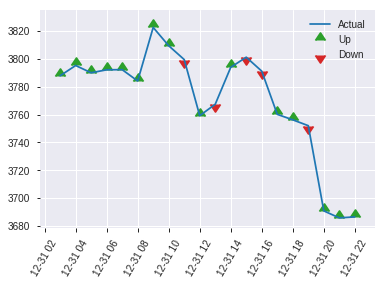


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.20536799928645777
RMSE: 0.4531754619200578
LogLoss: 0.5951956341552509
Mean Per-Class Error: 0.2998316104837082
AUC: 0.747282926259203
pr_auc: 0.6815528502924503
Gini: 0.494565852518406
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3027060478925705: 


,0,1,Error,Rate
0,240.0,233.0,0.4926,(233.0/473.0)
1,55.0,343.0,0.1382,(55.0/398.0)
Total,295.0,576.0,0.3307,(288.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3027060,0.7043121,266.0
max f2,0.1615680,0.8223544,345.0
max f0point5,0.3758358,0.6572274,226.0
max accuracy,0.3758358,0.6923077,226.0
max precision,0.8961827,1.0,0.0
max recall,0.0946254,1.0,381.0
max specificity,0.8961827,1.0,0.0
max absolute_mcc,0.3657055,0.4032976,231.0
max min_per_class_accuracy,0.4236854,0.6828753,199.0
max mean_per_class_accuracy,0.3657055,0.7001684,231.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 41.17 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8370870,1.7021217,1.7021217,0.7777778,0.8693038,0.7777778,0.8693038,0.0175879,0.0175879,70.2121720,70.2121720
,2,0.0206659,0.8065113,1.7021217,1.7021217,0.7777778,0.8218765,0.7777778,0.8455902,0.0175879,0.0351759,70.2121720,70.2121720
,3,0.0309989,0.7669860,1.7021217,1.7021217,0.7777778,0.7851150,0.7777778,0.8254318,0.0175879,0.0527638,70.2121720,70.2121720
,4,0.0401837,0.7488476,2.1884422,1.8132807,1.0,0.7553452,0.8285714,0.8094120,0.0201005,0.0728643,118.8442211,81.3280689
,5,0.0505166,0.7286995,1.7021217,1.7905436,0.7777778,0.7396848,0.8181818,0.7951496,0.0175879,0.0904523,70.2121720,79.0543627
,6,0.1010333,0.6679627,1.6413317,1.7159376,0.75,0.6969497,0.7840909,0.7460497,0.0829146,0.1733668,64.1331658,71.5937643
,7,0.1504018,0.6302036,1.4759261,1.6371552,0.6744186,0.6509568,0.7480916,0.7148360,0.0728643,0.2462312,47.5926142,63.7155242
,8,0.2009185,0.5984312,1.5915943,1.6256999,0.7272727,0.6152525,0.7428571,0.6897979,0.0804020,0.3266332,59.1594335,62.5699928
,9,0.3008037,0.5406560,1.2577254,1.5035099,0.5747126,0.5695220,0.6870229,0.6498589,0.1256281,0.4522613,25.7725409,50.3509916
,10,0.4006889,0.4759162,1.1822619,1.4234280,0.5402299,0.5094571,0.6504298,0.6148590,0.1180905,0.5703518,18.2261884,42.3428028


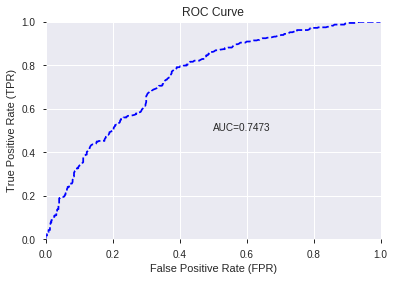

This function is available for GLM models only


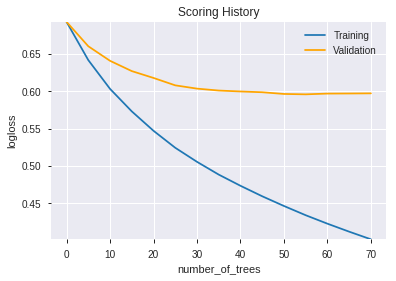

--2019-07-25 05:19:10--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.171.83
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.171.83|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


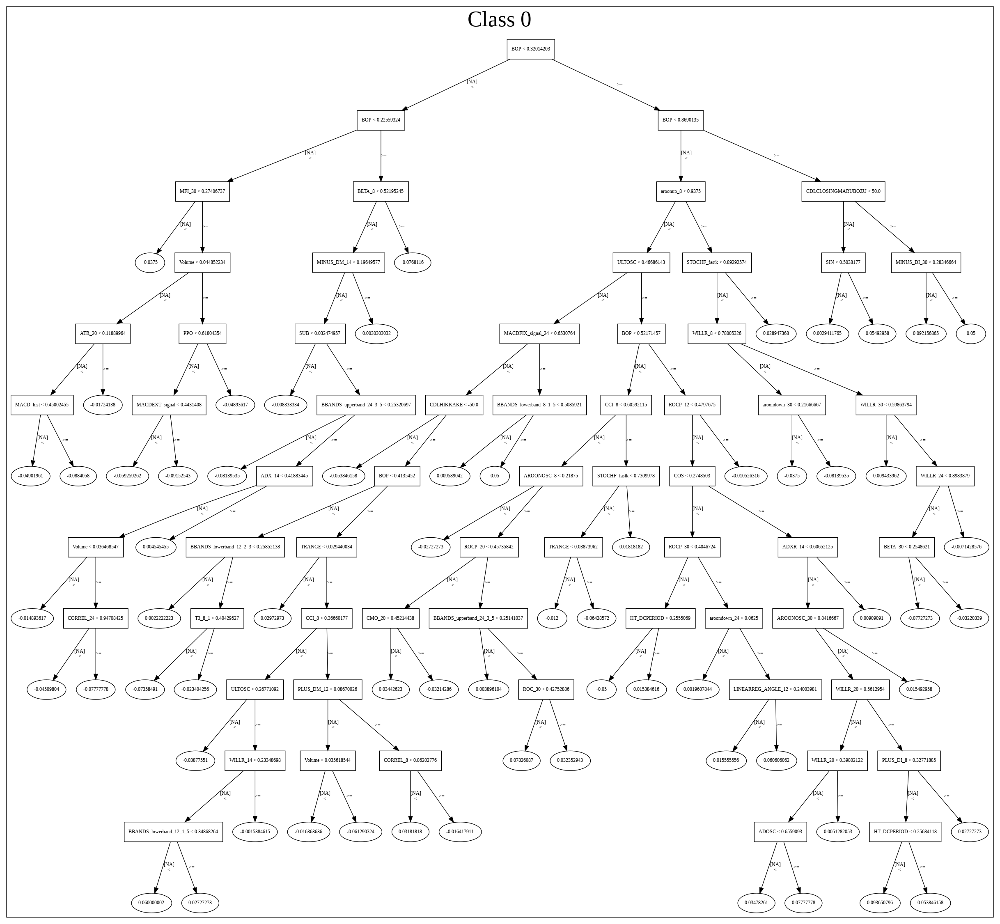

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20190725_051617',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20190725_051617',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_42_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_42_sid_8dc6',
   'type

In [0]:
# XGBoost
xgb_features = model_train(feature_name='All',model_algo="XGBoost")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190725_052008_model_9,0.712774,0.666326,0.373841,0.485215,0.235434
1,DeepLearning_grid_1_AutoML_20190725_052008_model_3,0.712667,0.867342,0.357204,0.512481,0.262637
2,DeepLearning_grid_1_AutoML_20190725_052008_model_6,0.708596,0.682445,0.360850,0.486356,0.236543
3,DeepLearning_grid_1_AutoML_20190725_052008_model_2,0.707772,1.107076,0.359119,0.555400,0.308469
4,DeepLearning_grid_1_AutoML_20190725_052008_model_8,0.706904,0.693355,0.374178,0.492570,0.242625
5,DeepLearning_grid_1_AutoML_20190725_052008_model_5,0.706051,0.669393,0.342620,0.481191,0.231545
6,DeepLearning_grid_1_AutoML_20190725_052008_model_4,0.696360,0.851995,0.367469,0.517548,0.267856
7,DeepLearning_grid_1_AutoML_20190725_052008_model_7,0.695863,0.836884,0.343831,0.514692,0.264908
8,DeepLearning_grid_1_AutoML_20190725_052008_model_1,0.673234,0.964553,0.422328,0.517537,0.267845
9,DeepLearning_1_AutoML_20190725_052008,0.651675,0.758588,0.430081,0.514116,0.264315


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.046275
1,CDLCLOSINGMARUBOZU,0.905333,0.905333,0.041894
2,CDLLONGLINE,0.800620,0.800620,0.037049
3,CDLGRAVESTONEDOJI,0.629089,0.629089,0.029111
4,week,0.552422,0.552422,0.025563
5,CDLDRAGONFLYDOJI,0.549033,0.549033,0.025406
6,CDLTAKURI,0.543372,0.543372,0.025144
7,DIV,0.518391,0.518391,0.023988
8,CDLMARUBOZU,0.512053,0.512053,0.023695
9,CDL2CROWS,0.505215,0.505215,0.023379


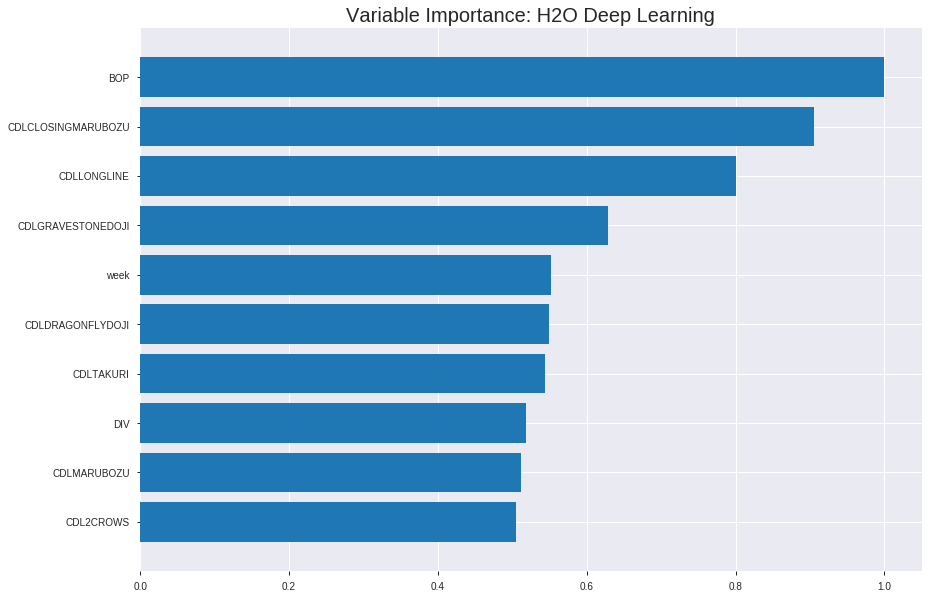

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190725_052008_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19867237945404514
RMSE: 0.44572679912031893
LogLoss: 0.5818154038286769
Mean Per-Class Error: 0.3073196495387257
AUC: 0.7579652418286474
pr_auc: 0.6983360796171773
Gini: 0.5159304836572949
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3530550569242344: 


,0,1,Error,Rate
0,1760.0,1612.0,0.4781,(1612.0/3372.0)
1,413.0,2310.0,0.1517,(413.0/2723.0)
Total,2173.0,3922.0,0.3322,(2025.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3530551,0.6952596,261.0
max f2,0.1876289,0.8151872,341.0
max f0point5,0.4764630,0.6564359,198.0
max accuracy,0.4764630,0.6930271,198.0
max precision,0.9595744,1.0,0.0
max recall,0.0567722,1.0,395.0
max specificity,0.9595744,1.0,0.0
max absolute_mcc,0.4021115,0.3887058,237.0
max min_per_class_accuracy,0.4639189,0.6882115,205.0
max mean_per_class_accuracy,0.4021115,0.6926804,237.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 44.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.9388536,2.0548696,2.0548696,0.9180328,0.9466644,0.9180328,0.9466644,0.0205656,0.0205656,105.4869569,105.4869569
,2,0.0200164,0.9094390,1.8347050,1.9447873,0.8196721,0.9266726,0.8688525,0.9366685,0.0183621,0.0389277,83.4704972,94.4787271
,3,0.0300246,0.8884410,1.6512345,1.8469363,0.7377049,0.8979048,0.8251366,0.9237473,0.0165259,0.0554535,65.1234475,84.6936339
,4,0.0400328,0.8738760,1.8347050,1.8438785,0.8196721,0.8809722,0.8237705,0.9130535,0.0183621,0.0738156,83.4704972,84.3878497
,5,0.0500410,0.8544369,1.9080932,1.8567214,0.8524590,0.8648780,0.8295082,0.9034184,0.0190966,0.0929122,90.8093171,85.6721432
,6,0.1000820,0.7434600,1.8200273,1.8383744,0.8131148,0.7914014,0.8213115,0.8474099,0.0910760,0.1839882,82.0027332,83.8374382
,7,0.1501231,0.6757358,1.6365568,1.7711019,0.7311475,0.7077165,0.7912568,0.8008455,0.0818950,0.2658832,63.6556835,77.1101867
,8,0.2,0.6293394,1.3621477,1.6691149,0.6085526,0.6521309,0.7456932,0.7637583,0.0679398,0.3338230,36.2147738,66.9114947
,9,0.3000820,0.5527683,1.3356652,1.5579043,0.5967213,0.5895423,0.6960087,0.7056546,0.1336761,0.4674991,33.5665220,55.7904267
,10,0.4,0.4949899,1.2937532,1.4919207,0.5779967,0.5208316,0.6665299,0.6594867,0.1292692,0.5967683,29.3753207,49.1920676




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.20915009905643758
RMSE: 0.45732931138998467
LogLoss: 0.6092473725418645
Mean Per-Class Error: 0.3180616225120626
AUC: 0.7249338587903649
pr_auc: 0.666102323649477
Gini: 0.44986771758072974
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.28612205209497277: 


,0,1,Error,Rate
0,414.0,577.0,0.5822,(577.0/991.0)
1,116.0,635.0,0.1545,(116.0/751.0)
Total,530.0,1212.0,0.3978,(693.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2861221,0.6469689,282.0
max f2,0.0899589,0.7923729,385.0
max f0point5,0.4822841,0.6468046,173.0
max accuracy,0.4822841,0.6928817,173.0
max precision,0.9554946,1.0,0.0
max recall,0.0188172,1.0,399.0
max specificity,0.9554946,1.0,0.0
max absolute_mcc,0.4558676,0.3660993,189.0
max min_per_class_accuracy,0.4171398,0.6724368,209.0
max mean_per_class_accuracy,0.4558676,0.6819384,189.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 42.81 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.9381831,2.1907087,2.1907087,0.9444444,0.9443423,0.9444444,0.9443423,0.0226365,0.0226365,119.0708685,119.0708685
,2,0.0200918,0.9188255,1.9102373,2.0544797,0.8235294,0.9316172,0.8857143,0.9381615,0.0186418,0.0412783,91.0237331,105.4479741
,3,0.0304248,0.8884401,1.9329783,2.0132151,0.8333333,0.9011704,0.8679245,0.9255985,0.0199734,0.0612517,93.2978251,101.3215084
,4,0.0401837,0.8786774,1.6373463,1.9219327,0.7058824,0.8837109,0.8285714,0.9154258,0.0159787,0.0772304,63.7346283,92.1932661
,5,0.0505166,0.8682554,1.8041130,1.8978332,0.7777778,0.8739912,0.8181818,0.9069506,0.0186418,0.0958722,80.4113034,89.7833192
,6,0.1004592,0.7605216,1.7863385,1.8424044,0.7701149,0.8232291,0.7942857,0.8653290,0.0892144,0.1850866,78.6338522,84.2404413
,7,0.1504018,0.6608836,1.4130738,1.6998404,0.6091954,0.7077989,0.7328244,0.8130194,0.0705726,0.2556591,41.3073756,69.9840416
,8,0.2003444,0.6123245,1.6263679,1.6815249,0.7011494,0.6347715,0.7249284,0.7685851,0.0812250,0.3368842,62.6367908,68.1524920
,9,0.3002296,0.5132282,1.4130738,1.5922123,0.6091954,0.5579705,0.6864245,0.6985145,0.1411451,0.4780293,41.3073756,59.2212296
,10,0.4001148,0.4605567,1.2397723,1.5042287,0.5344828,0.4858666,0.6484935,0.6454288,0.1238349,0.6018642,23.9772258,50.4228699



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 05:40:39,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-07-25 05:40:43,10 min 2.326 sec,304 obs/sec,0.2149303,1,1310.0,0.5385193,0.8558236,-0.1733154,0.7310244,0.6672313,1.9447873,0.3542248,0.5238408,0.8065932,-0.1188744,0.7156768,0.6414322,1.8041130,0.3455798
,2019-07-25 05:41:50,11 min 8.827 sec,661 obs/sec,6.9816243,32,42553.0,0.4528070,0.5959031,0.1704580,0.7496731,0.6904113,1.9080932,0.3489746,0.4603135,0.6132874,0.1360469,0.7237770,0.6513742,1.6752478,0.3530425
,2019-07-25 05:42:54,12 min 13.773 sec,800 obs/sec,16.1274815,74,98297.0,0.4457268,0.5818154,0.1961968,0.7579652,0.6983361,2.0548696,0.3322395,0.4573293,0.6092474,0.1472126,0.7249339,0.6661023,2.1907087,0.3978186
,2019-07-25 05:44:00,13 min 19.675 sec,888 obs/sec,26.5712879,122,161952.0,0.4492355,0.5932894,0.1834921,0.7597655,0.7020917,2.0181755,0.3392945,0.4601210,0.6283939,0.1367693,0.7268291,0.6645922,2.1907087,0.3605052
,2019-07-25 05:45:04,14 min 23.745 sec,942 obs/sec,37.0887613,170,226056.0,0.4448750,0.5865503,0.1992660,0.7652715,0.7059955,1.9447873,0.3197703,0.4596548,0.6296099,0.1385179,0.7309595,0.6689849,2.1907087,0.3346728
,2019-07-25 05:46:10,15 min 31.012 sec,977 obs/sec,48.0183757,220,292672.0,0.4417334,0.5801196,0.2105352,0.7698367,0.7112362,2.0181755,0.3092699,0.4594584,0.6284628,0.1392537,0.7316172,0.6711250,2.1907087,0.3306544
,2019-07-25 05:47:28,16 min 47.160 sec,1005 obs/sec,60.8867925,279,371105.0,0.4380963,0.5649063,0.2234823,0.7745980,0.7139740,2.0181755,0.3114028,0.4571268,0.6097235,0.1479676,0.7325255,0.6647492,2.0618435,0.3237658
,2019-07-25 05:47:34,16 min 53.778 sec,1004 obs/sec,60.8867925,279,371105.0,0.4457268,0.5818154,0.1961968,0.7579652,0.6983361,2.0548696,0.3322395,0.4573293,0.6092474,0.1472126,0.7249339,0.6661023,2.1907087,0.3978186


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0462749
CDLCLOSINGMARUBOZU,0.9053328,0.9053328,0.0418941
CDLLONGLINE,0.8006200,0.8006200,0.0370486
CDLGRAVESTONEDOJI,0.6290892,0.6290892,0.0291110
week,0.5524222,0.5524222,0.0255633
---,---,---,---
WILLR_30,0.2973857,0.2973857,0.0137615
PLUS_DI_24,0.2955504,0.2955504,0.0136766
STOCHF_fastd,0.2951899,0.2951899,0.0136599
CDLHARAMICROSS,0.2950451,0.2950451,0.0136532



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6601607347876005)

('F1', 0.6789667896678967)

('auc', 0.7127736993636257)

('logloss', 0.666326018142811)

('mean_per_class_error', 0.3340725827870856)

('rmse', 0.4852154363874281)

('mse', 0.23543401970864228)

deeplearning prediction progress: |███████████████████████████████████████| 100%


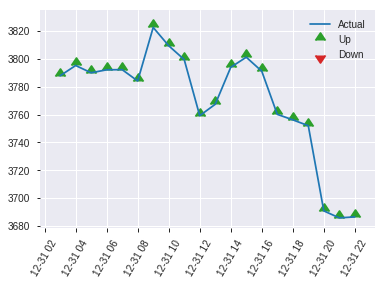


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.23543401970864228
RMSE: 0.4852154363874281
LogLoss: 0.666326018142811
Mean Per-Class Error: 0.3340725827870856
AUC: 0.7127736993636257
pr_auc: 0.6385062165422215
Gini: 0.42554739872725134
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.20008419894696908: 


,0,1,Error,Rate
0,155.0,318.0,0.6723,(318.0/473.0)
1,30.0,368.0,0.0754,(30.0/398.0)
Total,185.0,686.0,0.3995,(348.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2000842,0.6789668,314.0
max f2,0.1384575,0.8176101,357.0
max f0point5,0.3003761,0.6281033,229.0
max accuracy,0.3003761,0.6601607,229.0
max precision,0.9467798,1.0,0.0
max recall,0.0825359,1.0,389.0
max specificity,0.9467798,1.0,0.0
max absolute_mcc,0.2524821,0.3339621,269.0
max min_per_class_accuracy,0.2924430,0.6553911,236.0
max mean_per_class_accuracy,0.2616243,0.6659274,259.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 34.12 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.9270280,1.2158012,1.2158012,0.5555556,0.9351224,0.5555556,0.9351224,0.0125628,0.0125628,21.5801228,21.5801228
,2,0.0206659,0.9160327,1.7021217,1.4589615,0.7777778,0.9217926,0.6666667,0.9284575,0.0175879,0.0301508,70.2121720,45.8961474
,3,0.0309989,0.8688201,1.7021217,1.5400149,0.7777778,0.8913286,0.7037037,0.9160812,0.0175879,0.0477387,70.2121720,54.0014889
,4,0.0401837,0.8378034,2.1884422,1.6882268,1.0,0.8509649,0.7714286,0.9011975,0.0201005,0.0678392,118.8442211,68.8226849
,5,0.0505166,0.8090301,1.4589615,1.6413317,0.6666667,0.8271877,0.75,0.8860591,0.0150754,0.0829146,45.8961474,64.1331658
,6,0.1010333,0.6477768,1.6413317,1.6413317,0.75,0.7201801,0.75,0.8031196,0.0829146,0.1658291,64.1331658,64.1331658
,7,0.1504018,0.5072942,1.4250321,1.5703326,0.6511628,0.5790799,0.7175573,0.7295798,0.0703518,0.2361809,42.5032137,57.0332579
,8,0.2009185,0.4559646,1.4921197,1.5506676,0.6818182,0.4755030,0.7085714,0.6656977,0.0753769,0.3115578,49.2119689,55.0667624
,9,0.3008037,0.3817253,1.1319529,1.4116288,0.5172414,0.4124231,0.6450382,0.5815950,0.1130653,0.4246231,13.1952868,41.1628754
,10,0.4006889,0.3283013,1.3331889,1.3920750,0.6091954,0.3571884,0.6361032,0.5256541,0.1331658,0.5577889,33.3188933,39.2074988


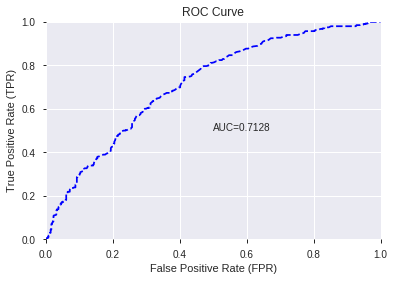

This function is available for GLM models only


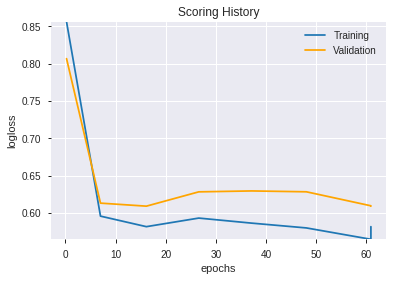

--2019-07-25 05:47:53--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.80.160
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.80.160|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


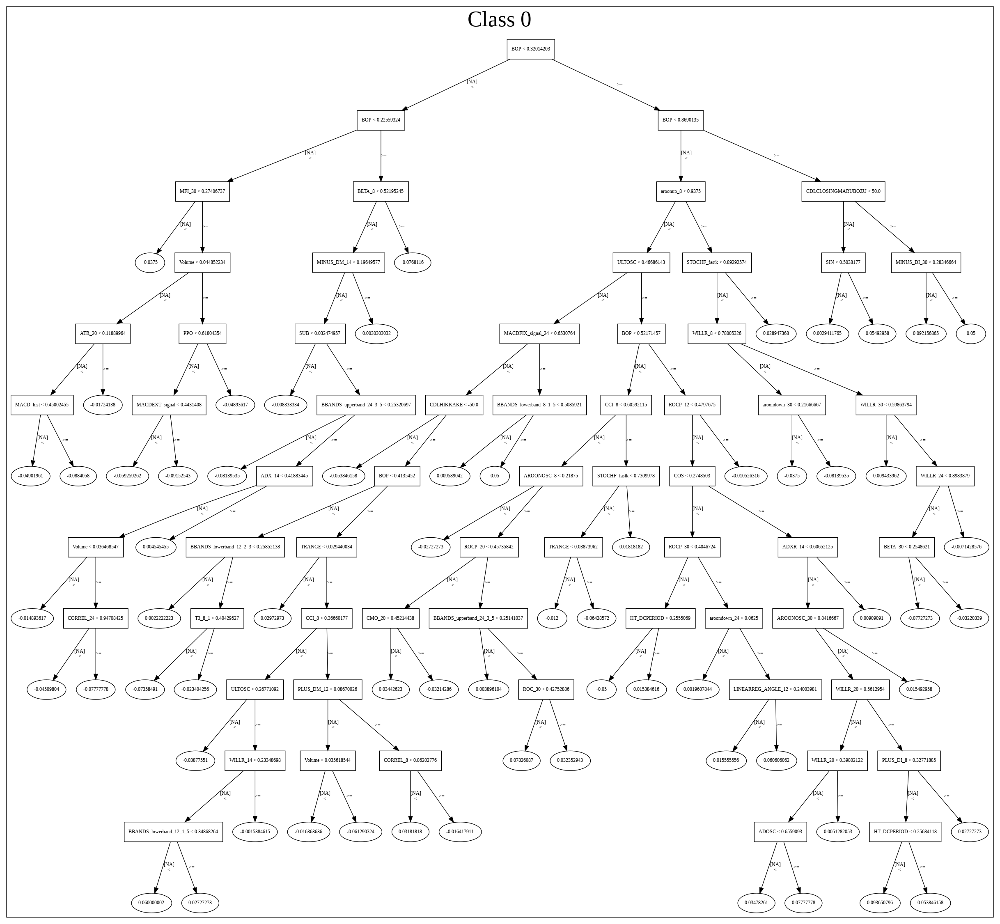

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190725_052008_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190725_052008_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'CDLLONGLINE',
 'CDLGRAVESTONEDOJI',
 'week',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'DIV',
 'CDLMARUBOZU',
 'CDL2CROWS',
 'CDLUNIQUE3RIVER',
 'CDLHIKKAKE',
 'CDLTHRUSTING',
 'CDLSHOOTINGSTAR',
 'ULTOSC',
 'is_quarter_start',
 'CDLPIERCING',
 'STOCHF_fastk',
 'CDLLADDERBOTTOM',
 'CDL3WHITESOLDIERS',
 'STOCHRSI_fastk',
 'CDLBREAKAWAY',
 'TRANGE',
 'CCI_8',
 'Volume',
 'STOCHRSI_fastd',
 'CDLHAMMER',
 'STOCH_slowd',
 'CDLENGULFING',
 'SAREXT',
 'PPO',
 'CDLDOJI',
 'BBANDS_upperband_20_0_4',
 'WILLR_8',
 'aroonup_8',
 'SUB',
 'Volume_(Currency)',
 'BBANDS_middleband_24_2_2',
 'ADOSC',
 'aroondown_8',
 'CDLRICKSHAWMAN',
 'PLUS_DI_8',
 'WILLR_24',
 'MFI_12',
 'STOCH_slowk',
 'WILLR_30',
 'PLUS_DI_24',
 'STOCHF_fastd',
 'CDLHARAMICROSS',
 'PLUS_DI_12']

In [0]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190725_054851_model_1,0.719021,0.646237,0.348027,0.478144,0.228622


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.407164,1.000000,0.104497
1,ULTOSC,0.248015,0.609127,0.063652
2,CDLCLOSINGMARUBOZU,0.186812,0.458812,0.047945
3,WILLR_24,0.157389,0.386549,0.040393
4,STOCHF_fastk,0.156000,0.383137,0.040037
5,WILLR_8,0.149939,0.368251,0.038481
6,week,0.143266,0.351862,0.036769
7,DIV,0.134529,0.330404,0.034526
8,CDLHIKKAKE,0.133636,0.328210,0.034297
9,CCI_8,0.133343,0.327493,0.034222


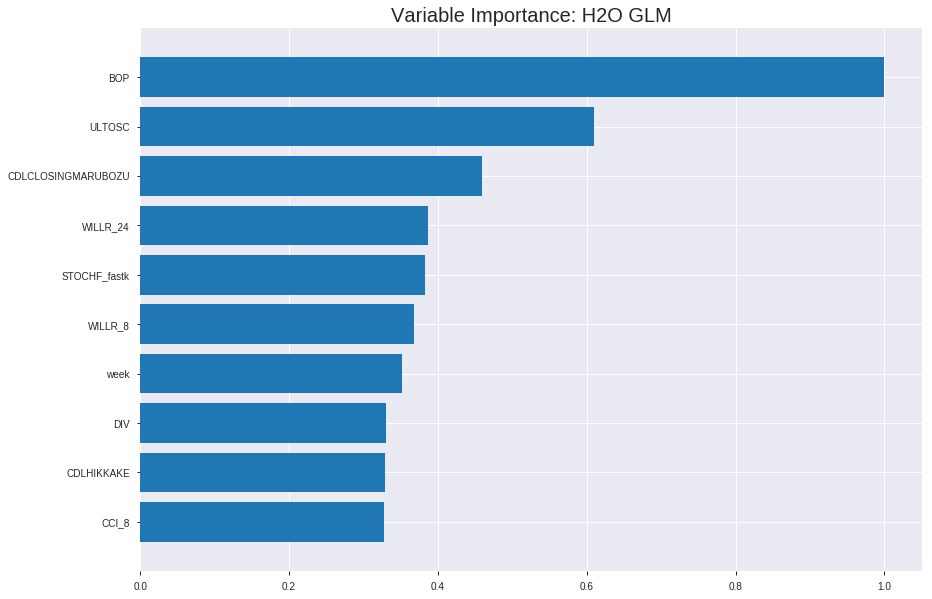

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190725_054851_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.20175019563551452
RMSE: 0.4491661114059191
LogLoss: 0.5876624151973678
Null degrees of freedom: 6094
Residual degrees of freedom: 6044
Null deviance: 8380.226957690009
Residual deviance: 7163.604841255914
AIC: 7265.604841255914
AUC: 0.7497428652457058
pr_auc: 0.6887452778108654
Gini: 0.49948573049141154
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3638415181898787: 


,0,1,Error,Rate
0,1717.0,1655.0,0.4908,(1655.0/3372.0)
1,420.0,2303.0,0.1542,(420.0/2723.0)
Total,2137.0,3958.0,0.3404,(2075.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3638415,0.6894178,251.0
max f2,0.2592198,0.8161144,306.0
max f0point5,0.4840720,0.6444976,186.0
max accuracy,0.4500619,0.6840033,205.0
max precision,0.9785611,1.0,0.0
max recall,0.0549209,1.0,391.0
max specificity,0.9785611,1.0,0.0
max absolute_mcc,0.3896136,0.3759550,237.0
max min_per_class_accuracy,0.4632956,0.6804994,197.0
max mean_per_class_accuracy,0.4344762,0.6870335,214.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 44.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.8717408,1.9447873,1.9447873,0.8688525,0.8954456,0.8688525,0.8954456,0.0194638,0.0194638,94.4787271,94.4787271
,2,0.0200164,0.8457083,1.8713991,1.9080932,0.8360656,0.8598100,0.8524590,0.8776278,0.0187293,0.0381932,87.1399072,90.8093171
,3,0.0300246,0.8262483,1.7613168,1.8591677,0.7868852,0.8354855,0.8306011,0.8635804,0.0176276,0.0558208,76.1316773,85.9167705
,4,0.0400328,0.8017660,1.9447873,1.8805726,0.8688525,0.8148194,0.8401639,0.8513901,0.0194638,0.0752846,94.4787271,88.0572597
,5,0.0500410,0.7767442,1.7980109,1.8640603,0.8032787,0.7891612,0.8327869,0.8389443,0.0179949,0.0932795,79.8010873,86.4060252
,6,0.1000820,0.7010851,1.7246227,1.7943415,0.7704918,0.7374730,0.8016393,0.7882087,0.0863019,0.1795813,72.4622674,79.4341463
,7,0.1501231,0.6480686,1.6072016,1.7319615,0.7180328,0.6725161,0.7737705,0.7496445,0.0804260,0.2600073,60.7201556,73.1961494
,8,0.2,0.6102279,1.4652292,1.6654425,0.6546053,0.6282131,0.7440525,0.7193613,0.0730812,0.3330885,46.5229188,66.5442527
,9,0.3000820,0.5526974,1.3026405,1.5444424,0.5819672,0.5802594,0.6899945,0.6729687,0.1303709,0.4634594,30.2640530,54.4442408
,10,0.4,0.5044015,1.2128936,1.4616232,0.5418719,0.5286752,0.6529943,0.6369249,0.1211899,0.5846493,21.2893632,46.1623210




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.20627657822570783
RMSE: 0.4541768138354355
LogLoss: 0.6018073309415343
Null degrees of freedom: 1741
Residual degrees of freedom: 1691
Null deviance: 2383.4834095378615
Residual deviance: 2096.6967410003053
AIC: 2198.6967410003053
AUC: 0.7313927880888046
pr_auc: 0.6714899543422668
Gini: 0.4627855761776092
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.37082954376651117: 


,0,1,Error,Rate
0,578.0,413.0,0.4168,(413.0/991.0)
1,175.0,576.0,0.233,(175.0/751.0)
Total,753.0,989.0,0.3375,(588.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3708295,0.6620690,236.0
max f2,0.1499506,0.7947883,356.0
max f0point5,0.5126617,0.6413302,155.0
max accuracy,0.5126617,0.6877153,155.0
max precision,0.9782931,1.0,0.0
max recall,0.0174550,1.0,399.0
max specificity,0.9782931,1.0,0.0
max absolute_mcc,0.5126617,0.3526016,155.0
max min_per_class_accuracy,0.4281008,0.6740666,204.0
max mean_per_class_accuracy,0.4410308,0.6763622,197.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 42.05 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8617216,2.0618435,2.0618435,0.8888889,0.8869996,0.8888889,0.8869996,0.0213049,0.0213049,106.1843468,106.1843468
,2,0.0200918,0.8424695,2.0466829,2.0544797,0.8823529,0.8539742,0.8857143,0.8709587,0.0199734,0.0412783,104.6682854,105.4479741
,3,0.0304248,0.8257598,1.8041130,1.9694495,0.7777778,0.8353937,0.8490566,0.8588800,0.0186418,0.0599201,80.4113034,96.9449539
,4,0.0401837,0.8141506,1.7737918,1.9219327,0.7647059,0.8197234,0.8285714,0.8493706,0.0173103,0.0772304,77.3791807,92.1932661
,5,0.0505166,0.8003533,1.6752478,1.8714744,0.7222222,0.8063884,0.8068182,0.8405787,0.0173103,0.0945406,67.5247818,87.1474398
,6,0.1004592,0.7070830,1.8396621,1.8556591,0.7931034,0.7515805,0.8,0.7963339,0.0918775,0.1864181,83.9662060,85.5659121
,7,0.1504018,0.6299444,1.6263679,1.7795204,0.7011494,0.6639874,0.7671756,0.7523868,0.0812250,0.2676431,62.6367908,77.9520436
,8,0.2003444,0.5862443,1.4930591,1.7081103,0.6436782,0.6058449,0.7363897,0.7158563,0.0745672,0.3422104,49.3059063,70.8110294
,9,0.3002296,0.5208673,1.3864120,1.6010826,0.5977011,0.5505520,0.6902486,0.6608602,0.1384820,0.4806924,38.6411987,60.1082559
,10,0.4001148,0.4636536,1.1197943,1.4809331,0.4827586,0.4908213,0.6384505,0.6184115,0.1118509,0.5925433,11.9794297,48.0933122



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-07-25 05:48:51,0.000 sec,2,.16E2,51,1.3611915,1.3559627
,2019-07-25 05:48:51,0.041 sec,4,.1E2,51,1.3540199,1.3494668
,2019-07-25 05:48:51,0.080 sec,6,.63E1,51,1.3438708,1.3401896
,2019-07-25 05:48:51,0.120 sec,8,.39E1,51,1.3302263,1.3276202
,2019-07-25 05:48:51,0.157 sec,10,.24E1,51,1.3129071,1.3115979
,2019-07-25 05:48:51,0.189 sec,12,.15E1,51,1.2924150,1.2927167
,2019-07-25 05:48:52,0.219 sec,14,.94E0,51,1.2700766,1.2724370
,2019-07-25 05:48:52,0.252 sec,16,.58E0,51,1.2477967,1.2527946
,2019-07-25 05:48:52,0.283 sec,18,.36E0,51,1.2274883,1.2357308
,2019-07-25 05:48:52,0.317 sec,20,.22E0,51,1.2104618,1.2224383


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6624569460390356)

('F1', 0.6856581532416502)

('auc', 0.7190205785800036)

('logloss', 0.6462372735770615)

('mean_per_class_error', 0.33247899115025437)

('rmse', 0.4781441017292679)

('mse', 0.22862178201848848)

glm prediction progress: |████████████████████████████████████████████████| 100%


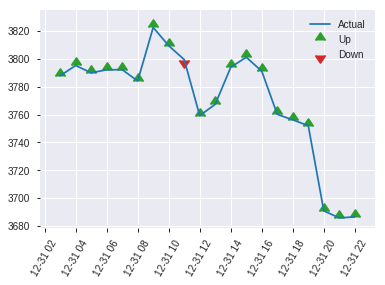


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.22862178201848848
RMSE: 0.4781441017292679
LogLoss: 0.6462372735770615
Null degrees of freedom: 870
Residual degrees of freedom: 820
Null deviance: 1201.3614369590905
Residual deviance: 1125.745330571241
AIC: 1227.745330571241
AUC: 0.7190205785800036
pr_auc: 0.6523730270313871
Gini: 0.43804115716000713
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.22507868632354783: 


,0,1,Error,Rate
0,202.0,271.0,0.5729,(271.0/473.0)
1,49.0,349.0,0.1231,(49.0/398.0)
Total,251.0,620.0,0.3674,(320.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2250787,0.6856582,282.0
max f2,0.1264639,0.8217446,346.0
max f0point5,0.3318968,0.6304559,206.0
max accuracy,0.3318968,0.6624569,206.0
max precision,0.9000780,1.0,0.0
max recall,0.0610851,1.0,383.0
max specificity,0.9000780,1.0,0.0
max absolute_mcc,0.2833578,0.3386556,243.0
max min_per_class_accuracy,0.3296530,0.6608040,208.0
max mean_per_class_accuracy,0.2833578,0.6675210,243.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 33.73 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8036003,1.9452820,1.9452820,0.8888889,0.8670697,0.8888889,0.8670697,0.0201005,0.0201005,94.5281965,94.5281965
,2,0.0206659,0.7759574,1.9452820,1.9452820,0.8888889,0.7872822,0.8888889,0.8271760,0.0201005,0.0402010,94.5281965,94.5281965
,3,0.0309989,0.7477422,1.2158012,1.7021217,0.5555556,0.7636321,0.7777778,0.8059947,0.0125628,0.0527638,21.5801228,70.2121720
,4,0.0401837,0.7178869,2.1884422,1.8132807,1.0,0.7351515,0.8285714,0.7898020,0.0201005,0.0728643,118.8442211,81.3280689
,5,0.0505166,0.6960292,1.7021217,1.7905436,0.7777778,0.7065265,0.8181818,0.7727684,0.0175879,0.0904523,70.2121720,79.0543627
,6,0.1010333,0.5654697,1.4423824,1.6164630,0.6590909,0.6296952,0.7386364,0.7012318,0.0728643,0.1633166,44.2382366,61.6462997
,7,0.1504018,0.5044002,1.4759261,1.5703326,0.6744186,0.5306364,0.7175573,0.6452348,0.0728643,0.2361809,47.5926142,57.0332579
,8,0.2009185,0.4592306,1.4921197,1.5506676,0.6818182,0.4773999,0.7085714,0.6030363,0.0753769,0.3115578,49.2119689,55.0667624
,9,0.3008037,0.4103048,1.2828799,1.4617458,0.5862069,0.4317697,0.6679389,0.5461653,0.1281407,0.4396985,28.2879917,46.1745752
,10,0.4006889,0.3704014,1.1571074,1.3858044,0.5287356,0.3912764,0.6332378,0.5075541,0.1155779,0.5552764,15.7107376,38.5804380


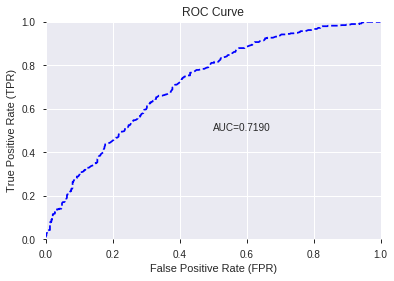

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


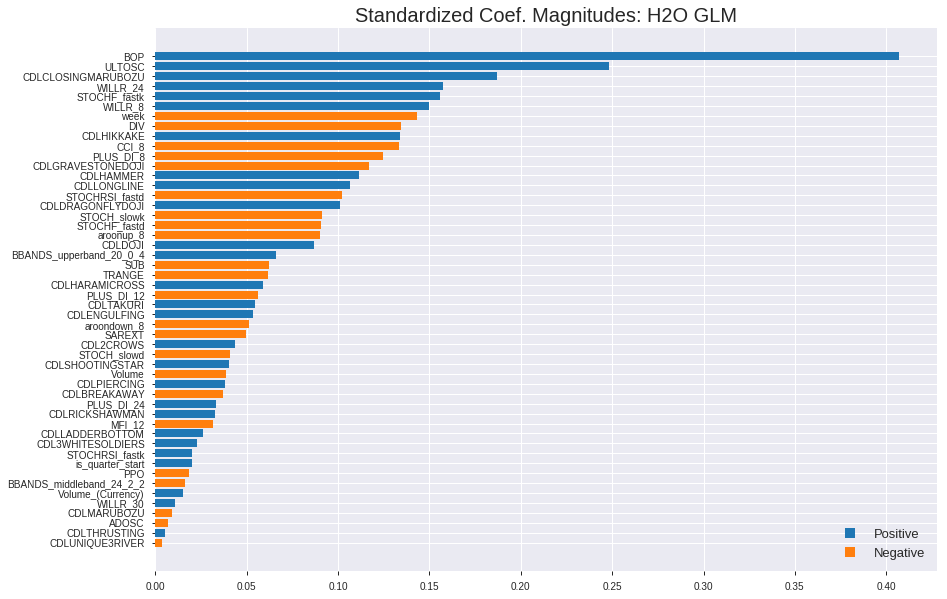

'log_likelihood'
--2019-07-25 05:49:01--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.165.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.165.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


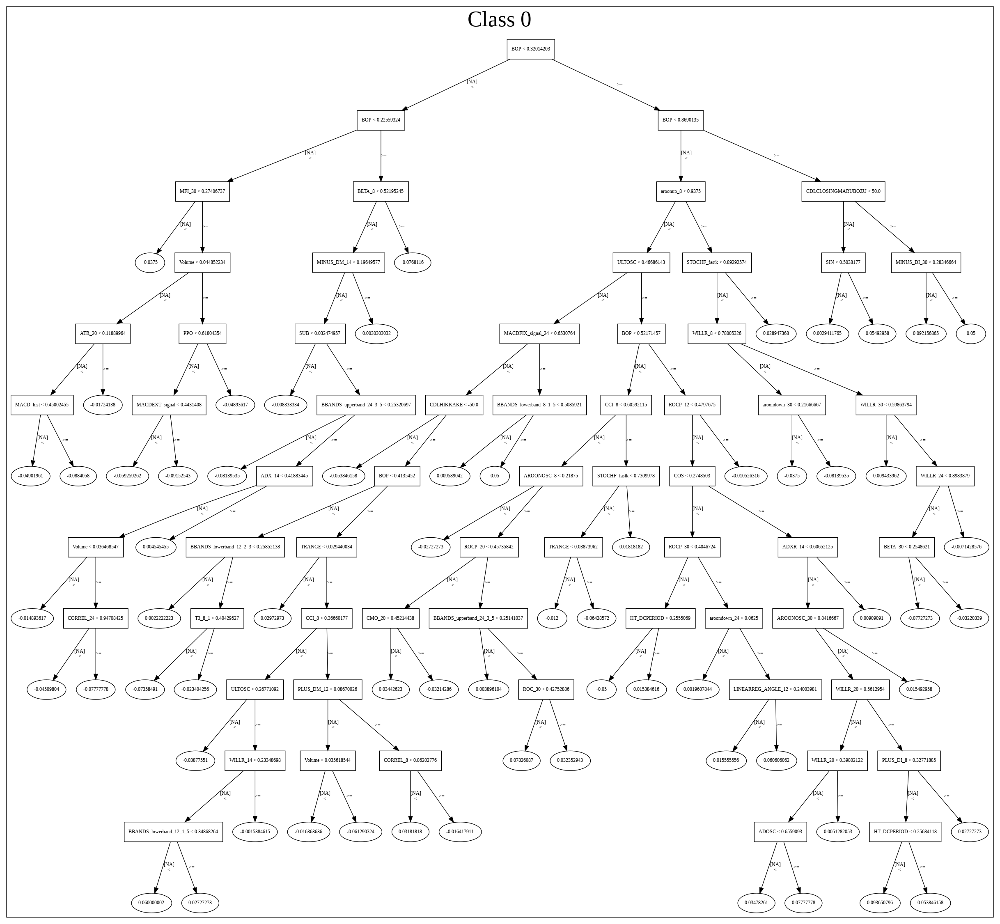

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190725_054851_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190725_054851_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_58_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_58_s

['BOP',
 'ULTOSC',
 'CDLCLOSINGMARUBOZU',
 'WILLR_24',
 'STOCHF_fastk',
 'WILLR_8',
 'week',
 'DIV',
 'CDLHIKKAKE',
 'CCI_8',
 'PLUS_DI_8',
 'CDLGRAVESTONEDOJI',
 'CDLHAMMER',
 'CDLLONGLINE',
 'STOCHRSI_fastd',
 'CDLDRAGONFLYDOJI',
 'STOCH_slowk',
 'STOCHF_fastd',
 'aroonup_8',
 'CDLDOJI',
 'BBANDS_upperband_20_0_4',
 'SUB',
 'TRANGE',
 'CDLHARAMICROSS',
 'PLUS_DI_12',
 'CDLTAKURI',
 'CDLENGULFING',
 'aroondown_8',
 'SAREXT',
 'CDL2CROWS',
 'STOCH_slowd',
 'CDLSHOOTINGSTAR',
 'Volume',
 'CDLPIERCING',
 'CDLBREAKAWAY',
 'PLUS_DI_24',
 'CDLRICKSHAWMAN',
 'MFI_12',
 'CDLLADDERBOTTOM',
 'CDL3WHITESOLDIERS',
 'STOCHRSI_fastk',
 'is_quarter_start',
 'PPO',
 'BBANDS_middleband_24_2_2',
 'Volume_(Currency)',
 'WILLR_30',
 'CDLMARUBOZU',
 'ADOSC',
 'CDLTHRUSTING',
 'CDLUNIQUE3RIVER']

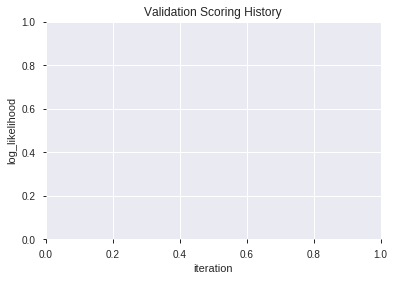

In [0]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20190725_054959,0.743503,0.599541,0.310464,0.455216,0.207222
1,XGBoost_grid_1_AutoML_20190725_054959_model_4,0.739716,0.601179,0.321218,0.456188,0.208107
2,XGBoost_3_AutoML_20190725_054959,0.739466,0.603534,0.326686,0.457485,0.209292
3,XGBoost_grid_1_AutoML_20190725_054959_model_2,0.737480,0.606218,0.329581,0.458521,0.210241
4,XGBoost_grid_1_AutoML_20190725_054959_model_1,0.736115,0.603031,0.351841,0.457751,0.209536
5,XGBoost_1_AutoML_20190725_054959,0.735655,0.603988,0.316392,0.457622,0.209418
6,XGBoost_grid_1_AutoML_20190725_054959_model_5,0.735073,0.607059,0.335557,0.457946,0.209715
7,XGBoost_grid_1_AutoML_20190725_054959_model_7,0.733865,0.604465,0.325048,0.458204,0.209951
8,XGBoost_grid_1_AutoML_20190725_054959_model_3,0.733190,0.605654,0.333090,0.458518,0.210239
9,XGBoost_grid_1_AutoML_20190725_054959_model_6,0.731275,0.608050,0.331374,0.460113,0.211704


,variable,relative_importance,scaled_importance,percentage
0,BOP,3711.000977,1.000000,0.147424
1,STOCHRSI_fastk,1282.067017,0.345477,0.050932
2,STOCHF_fastk,1177.863525,0.317398,0.046792
3,ULTOSC,1166.364014,0.314299,0.046335
4,CCI_8,1148.838257,0.309576,0.045639
5,DIV,984.158813,0.265200,0.039097
6,STOCHRSI_fastd,858.921143,0.231453,0.034122
7,ADOSC,858.000977,0.231205,0.034085
8,WILLR_8,840.877563,0.226590,0.033405
9,PPO,817.005005,0.220158,0.032457


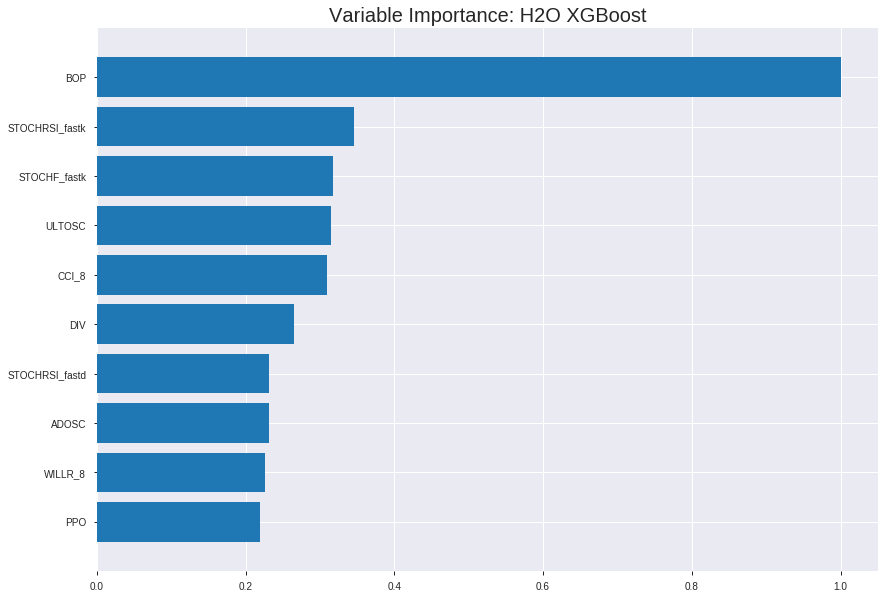

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20190725_054959


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.14175752258231195
RMSE: 0.376507002036233
LogLoss: 0.45138099122020864
Mean Per-Class Error: 0.17534896703926695
AUC: 0.9072225460457446
pr_auc: 0.8868749806681772
Gini: 0.8144450920914892
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47185409494808744: 


,0,1,Error,Rate
0,2775.0,597.0,0.177,(597.0/3372.0)
1,477.0,2246.0,0.1752,(477.0/2723.0)
Total,3252.0,2843.0,0.1762,(1074.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4718541,0.8070428,194.0
max f2,0.3452764,0.8715254,257.0
max f0point5,0.5603923,0.8277704,151.0
max accuracy,0.5143235,0.8270714,174.0
max precision,0.9148190,1.0,0.0
max recall,0.1380472,1.0,356.0
max specificity,0.9148190,1.0,0.0
max absolute_mcc,0.5143235,0.6492441,174.0
max min_per_class_accuracy,0.4732670,0.8233566,193.0
max mean_per_class_accuracy,0.4809246,0.8246510,190.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 44.85 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.8728820,2.2383401,2.2383401,1.0,0.8911704,1.0,0.8911704,0.0224018,0.0224018,123.8340066,123.8340066
,2,0.0200164,0.8495822,2.2016460,2.2199930,0.9836066,0.8610309,0.9918033,0.8761006,0.0220345,0.0444363,120.1645967,121.9993016
,3,0.0300246,0.8331980,2.2383401,2.2261087,1.0,0.8407736,0.9945355,0.8643249,0.0224018,0.0668380,123.8340066,122.6108700
,4,0.0400328,0.8175852,2.2016460,2.2199930,0.9836066,0.8245547,0.9918033,0.8543824,0.0220345,0.0888726,120.1645967,121.9993016
,5,0.0500410,0.8062389,2.1282578,2.2016460,0.9508197,0.8118172,0.9836066,0.8458694,0.0213000,0.1101726,112.8257768,120.1645967
,6,0.1000820,0.7550262,2.1355966,2.1686213,0.9540984,0.7795918,0.9688525,0.8127306,0.1068674,0.2170400,113.5596588,116.8621277
,7,0.1501231,0.7146738,2.0989025,2.1453817,0.9377049,0.7336765,0.9584699,0.7863792,0.1050312,0.3220712,109.8902488,114.5381681
,8,0.2,0.6712569,2.0321772,2.1171502,0.9078947,0.6921783,0.9458573,0.7628870,0.1013588,0.4234300,103.2177165,111.7150202
,9,0.3000820,0.5976620,1.7980109,2.0107123,0.8032787,0.6352102,0.8983051,0.7203048,0.1799486,0.6033786,79.8010873,101.0712263
,10,0.4,0.5197309,1.4775250,1.8775248,0.6600985,0.5573031,0.8388023,0.6795878,0.1476313,0.7510099,47.7524970,87.7524789




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.21211608077354985
RMSE: 0.4605606157429767
LogLoss: 0.6118260489180747
Mean Per-Class Error: 0.31360943565323596
AUC: 0.7377220550869947
pr_auc: 0.6798863804520254
Gini: 0.47544411017398946
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42498915394147235: 


,0,1,Error,Rate
0,487.0,504.0,0.5086,(504.0/991.0)
1,135.0,616.0,0.1798,(135.0/751.0)
Total,622.0,1120.0,0.3668,(639.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4249892,0.6584714,237.0
max f2,0.1293310,0.7974414,375.0
max f0point5,0.6461492,0.6468823,124.0
max accuracy,0.6461492,0.6917336,124.0
max precision,0.9255542,1.0,0.0
max recall,0.0517969,1.0,399.0
max specificity,0.9255542,1.0,0.0
max absolute_mcc,0.5585702,0.3706399,170.0
max min_per_class_accuracy,0.5465940,0.6777630,177.0
max mean_per_class_accuracy,0.5585702,0.6863906,170.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 51.35 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8754792,1.9329783,1.9329783,0.8333333,0.8923015,0.8333333,0.8923015,0.0199734,0.0199734,93.2978251,93.2978251
,2,0.0200918,0.8610529,2.3195739,2.1207533,1.0,0.8686752,0.9142857,0.8808258,0.0226365,0.0426099,131.9573901,112.0753281
,3,0.0304248,0.8474605,1.9329783,2.0569806,0.8333333,0.8543474,0.8867925,0.8718332,0.0199734,0.0625832,93.2978251,105.6980630
,4,0.0401837,0.8347039,2.0466829,2.0544797,0.8823529,0.8420258,0.8857143,0.8645942,0.0199734,0.0825566,104.6682854,105.4479741
,5,0.0505166,0.8252728,1.9329783,2.0296272,0.8333333,0.8308259,0.875,0.8576871,0.0199734,0.1025300,93.2978251,102.9627164
,6,0.1004592,0.7797495,1.7063532,1.8689138,0.7356322,0.7978847,0.8057143,0.8279567,0.0852197,0.1877497,70.6353215,86.8913829
,7,0.1504018,0.7426942,1.6796914,1.8060804,0.7241379,0.7599351,0.7786260,0.8053694,0.0838881,0.2716378,67.9691446,80.6080442
,8,0.2003444,0.7143856,1.4663973,1.7214030,0.6321839,0.7276414,0.7421203,0.7859931,0.0732357,0.3448735,46.6397294,72.1402981
,9,0.3002296,0.6578697,1.3997429,1.6143880,0.6034483,0.6854788,0.6959847,0.7525524,0.1398136,0.4846871,39.9742872,61.4387954
,10,0.4006889,0.5973830,1.1266502,1.4921041,0.4857143,0.6268054,0.6432665,0.7210256,0.1131824,0.5978695,12.6650181,49.2104129



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 05:50:03,0.002 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5532404,0.5,0.6931472,0.5,0.0,1.0,0.5688863
,2019-07-25 05:50:03,0.182 sec,5.0,0.4768386,0.6476306,0.8151143,0.7762378,2.2016460,0.2885972,0.4871107,0.6675817,0.7104500,0.6356804,1.8041130,0.3639495
,2019-07-25 05:50:03,0.348 sec,10.0,0.4587730,0.6127130,0.8327894,0.7950202,2.2383401,0.2600492,0.4780390,0.6496167,0.7226362,0.6557545,1.9329783,0.3490241
,2019-07-25 05:50:03,0.514 sec,15.0,0.4441091,0.5842590,0.8429081,0.8077140,2.2016460,0.2495488,0.4701672,0.6338214,0.7314902,0.6668236,1.9329783,0.3605052
,2019-07-25 05:50:03,0.692 sec,20.0,0.4324754,0.5614889,0.8524856,0.8217659,2.2016460,0.2510254,0.4670732,0.6271509,0.7330616,0.6669700,1.9329783,0.3461538
,2019-07-25 05:50:04,0.887 sec,25.0,0.4231751,0.5430099,0.8591085,0.8298749,2.2383401,0.2344545,0.4640438,0.6207313,0.7354069,0.6708565,1.9329783,0.3513203
,2019-07-25 05:50:04,1.203 sec,30.0,0.4152122,0.5270097,0.8648790,0.8361881,2.2383401,0.2241181,0.4618422,0.6158409,0.7369602,0.6731837,1.9329783,0.3467279
,2019-07-25 05:50:04,1.596 sec,35.0,0.4081032,0.5129348,0.8724725,0.8446223,2.2383401,0.2198523,0.4611881,0.6141319,0.7362071,0.6730428,2.0618435,0.3478760
,2019-07-25 05:50:05,1.804 sec,40.0,0.4020755,0.5007175,0.8778374,0.8512728,2.2016460,0.2157506,0.4605996,0.6125486,0.7370402,0.6745354,2.0618435,0.3582090
,2019-07-25 05:50:05,2.032 sec,45.0,0.3962421,0.4892675,0.8845108,0.8589766,2.2383401,0.2036095,0.4604847,0.6121334,0.7360129,0.6752655,2.0618435,0.3541906


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,3711.0009766,1.0,0.1474243
STOCHRSI_fastk,1282.0670166,0.3454774,0.0509318
STOCHF_fastk,1177.8635254,0.3173978,0.0467921
ULTOSC,1166.3640137,0.3142990,0.0463353
CCI_8,1148.8382568,0.3095764,0.0456391
---,---,---,---
CDLHAMMER,107.6605835,0.0290112,0.0042770
CDLDOJI,79.2643433,0.0213593,0.0031489
CDLTAKURI,39.4267082,0.0106243,0.0015663
CDLENGULFING,13.9053230,0.0037471,0.0005524



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6900114810562572)

('F1', 0.6964091403699673)

('auc', 0.7435034580938519)

('logloss', 0.5995414231701103)

('mean_per_class_error', 0.3057916432054564)

('rmse', 0.45521609111324696)

('mse', 0.20722168960842394)

xgboost prediction progress: |████████████████████████████████████████████| 100%


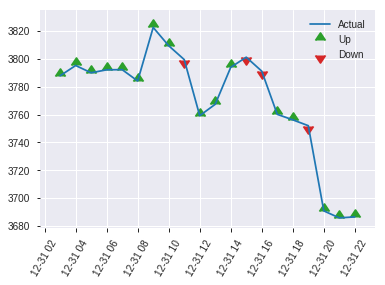


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.20722168960842394
RMSE: 0.45521609111324696
LogLoss: 0.5995414231701103
Mean Per-Class Error: 0.3057916432054564
AUC: 0.7435034580938519
pr_auc: 0.6762558337584172
Gini: 0.48700691618770375
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33224694927533466: 


,0,1,Error,Rate
0,272.0,201.0,0.4249,(201.0/473.0)
1,78.0,320.0,0.196,(78.0/398.0)
Total,350.0,521.0,0.3203,(279.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3322469,0.6964091,243.0
max f2,0.1062630,0.8236030,368.0
max f0point5,0.3988274,0.6578947,208.0
max accuracy,0.3988274,0.6900115,208.0
max precision,0.8830329,1.0,0.0
max recall,0.0906907,1.0,379.0
max specificity,0.8830329,1.0,0.0
max absolute_mcc,0.3718189,0.3885757,222.0
max min_per_class_accuracy,0.4171400,0.6783920,197.0
max mean_per_class_accuracy,0.3718189,0.6942084,222.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 40.84 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8452469,1.7021217,1.7021217,0.7777778,0.8593708,0.7777778,0.8593708,0.0175879,0.0175879,70.2121720,70.2121720
,2,0.0206659,0.8056712,1.7021217,1.7021217,0.7777778,0.8254664,0.7777778,0.8424186,0.0175879,0.0351759,70.2121720,70.2121720
,3,0.0309989,0.7790756,1.4589615,1.6210683,0.6666667,0.7915554,0.7407407,0.8254642,0.0150754,0.0502513,45.8961474,62.1068304
,4,0.0401837,0.7613962,1.6413317,1.6256999,0.75,0.7726612,0.7428571,0.8133950,0.0150754,0.0653266,64.1331658,62.5699928
,5,0.0505166,0.7314820,1.7021217,1.6413317,0.7777778,0.7507064,0.75,0.8005723,0.0175879,0.0829146,70.2121720,64.1331658
,6,0.1010333,0.6828995,1.7408063,1.6910690,0.7954545,0.7023788,0.7727273,0.7514756,0.0879397,0.1708543,74.0806304,69.1068981
,7,0.1504018,0.6432779,1.5268201,1.6371552,0.6976744,0.6618101,0.7480916,0.7220434,0.0753769,0.2462312,52.6820147,63.7155242
,8,0.2009185,0.6082684,1.5418570,1.6131945,0.7045455,0.6265383,0.7371429,0.6980307,0.0778894,0.3241206,54.1857012,61.3194544
,9,0.3008037,0.5438907,1.2325709,1.4868043,0.5632184,0.5777485,0.6793893,0.6580897,0.1231156,0.4472362,23.2570900,48.6804250
,10,0.4006889,0.4762738,1.3331889,1.4485105,0.6091954,0.5100394,0.6618911,0.6211832,0.1331658,0.5804020,33.3188933,44.8510461


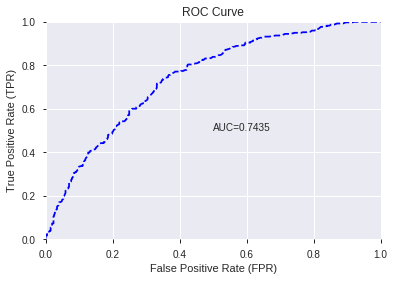

This function is available for GLM models only


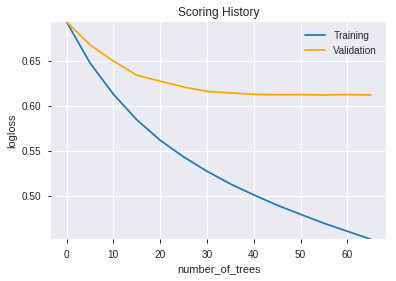

--2019-07-25 05:50:40--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.38.68
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.38.68|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


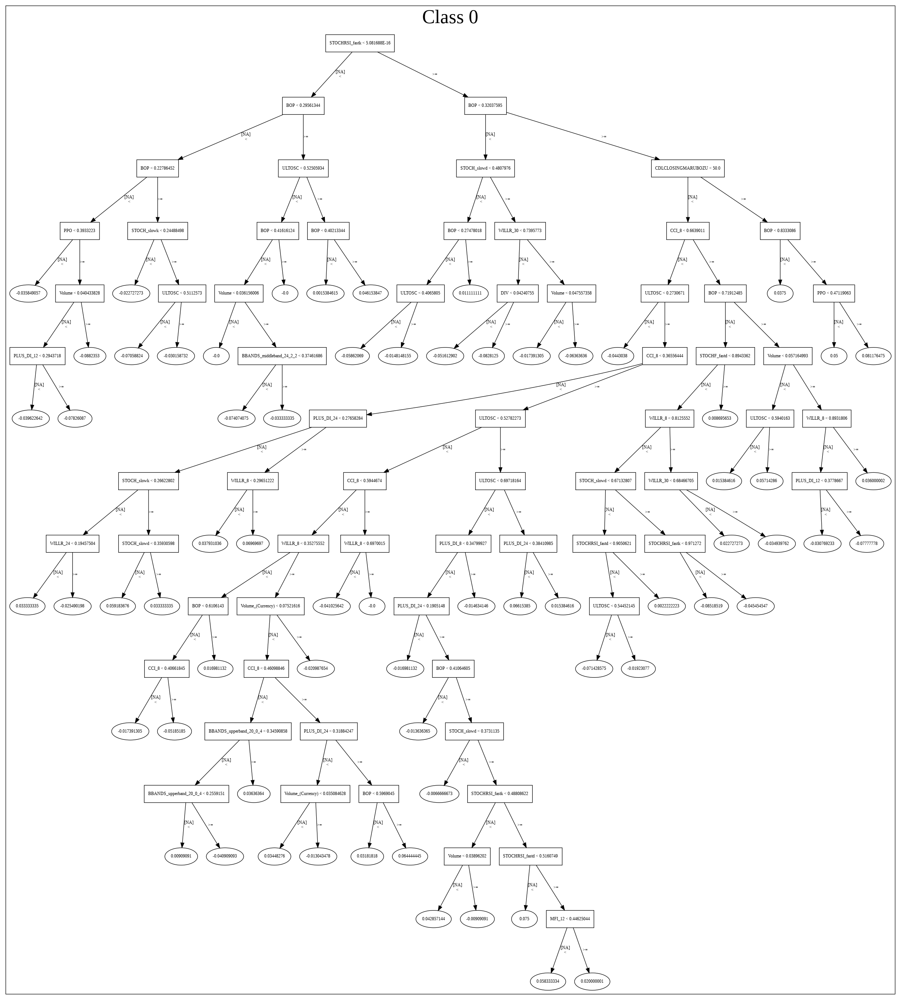

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20190725_054959',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20190725_054959',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_66_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_66_sid_8dc6',
   'type

['BOP',
 'STOCHRSI_fastk',
 'STOCHF_fastk',
 'ULTOSC',
 'CCI_8',
 'DIV',
 'STOCHRSI_fastd',
 'ADOSC',
 'WILLR_8',
 'PPO',
 'TRANGE',
 'STOCH_slowd',
 'Volume',
 'CDLCLOSINGMARUBOZU',
 'MFI_12',
 'week',
 'WILLR_24',
 'PLUS_DI_24',
 'STOCH_slowk',
 'SAREXT',
 'WILLR_30',
 'BBANDS_middleband_24_2_2',
 'Volume_(Currency)',
 'aroonup_8',
 'PLUS_DI_12',
 'PLUS_DI_8',
 'BBANDS_upperband_20_0_4',
 'SUB',
 'aroondown_8',
 'CDLLONGLINE',
 'STOCHF_fastd',
 'CDLHIKKAKE',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLHAMMER',
 'CDLDOJI',
 'CDLTAKURI',
 'CDLENGULFING',
 'CDLRICKSHAWMAN']

In [0]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del xgb_features,glm_features,dl_features
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [0]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [0]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [0]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [0]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [0]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [0]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [0]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [0]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [0]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [0]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [0]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [0]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [0]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [0]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [0]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [0]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [0]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [0]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [921 930] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


86

['Volume',
 'Volume_(Currency)',
 'BOP',
 'CCI_8',
 'CMO_8',
 'DX_8',
 'MINUS_DI_8',
 'MOM_8',
 'ROC_8',
 'ROCP_8',
 'ROCR_8',
 'ROCR100_8',
 'RSI_8',
 'WILLR_8',
 'CCI_12',
 'CMO_12',
 'MINUS_DI_12',
 'MOM_12',
 'ROC_12',
 'ROCP_12',
 'ROCR_12',
 'ROCR100_12',
 'RSI_12',
 'WILLR_12',
 'aroondown_14',
 'CCI_14',
 'CMO_14',
 'MINUS_DI_14',
 'MOM_14',
 'ROC_14',
 'ROCP_14',
 'ROCR_14',
 'ROCR100_14',
 'RSI_14',
 'WILLR_14',
 'aroondown_20',
 'CCI_20',
 'CMO_20',
 'MINUS_DI_20',
 'MOM_20',
 'ROC_20',
 'ROCP_20',
 'ROCR_20',
 'ROCR100_20',
 'RSI_20',
 'WILLR_20',
 'aroondown_24',
 'CCI_24',
 'CMO_24',
 'MINUS_DI_24',
 'MOM_24',
 'ROC_24',
 'ROCP_24',
 'ROCR_24',
 'ROCR100_24',
 'RSI_24',
 'WILLR_24',
 'CCI_30',
 'CMO_30',
 'MINUS_DI_30',
 'RSI_30',
 'WILLR_30',
 'STOCHF_fastk',
 'STOCHRSI_fastk',
 'ULTOSC',
 'ADOSC',
 'TRANGE',
 'CDL3INSIDE',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLENGULFING',
 'CDLGRAVESTONEDOJI',
 'CDLHAMMER',
 'CDLHANGINGMAN',
 'CDLH

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190725_055141_model_9,0.714277,0.635289,0.365262,0.469170,0.220121
1,DeepLearning_grid_1_AutoML_20190725_055141_model_8,0.713722,0.631944,0.375695,0.467993,0.219017
2,DeepLearning_grid_1_AutoML_20190725_055141_model_6,0.705693,0.638525,0.370165,0.468360,0.219361
3,DeepLearning_grid_1_AutoML_20190725_055141_model_5,0.703032,0.630621,0.383891,0.467811,0.218847
4,DeepLearning_grid_1_AutoML_20190725_055141_model_4,0.696607,0.700719,0.385179,0.483650,0.233917
5,DeepLearning_grid_1_AutoML_20190725_055141_model_3,0.693892,0.691123,0.414132,0.474136,0.224805
6,DeepLearning_1_AutoML_20190725_055141,0.692957,0.652637,0.407667,0.476670,0.227214
7,DeepLearning_grid_1_AutoML_20190725_055141_model_1,0.683717,0.814811,0.402520,0.494786,0.244813
8,DeepLearning_grid_1_AutoML_20190725_055141_model_7,0.683568,0.774179,0.390831,0.503192,0.253202
9,DeepLearning_grid_1_AutoML_20190725_055141_model_2,0.662831,0.725352,0.442933,0.494654,0.244682


,variable,relative_importance,scaled_importance,percentage
0,CDLCLOSINGMARUBOZU,1.000000,1.000000,0.042355
1,BOP,0.869197,0.869197,0.036815
2,CDLLONGLINE,0.785155,0.785155,0.033255
3,DIV,0.497186,0.497186,0.021058
4,CDLGRAVESTONEDOJI,0.496560,0.496560,0.021032
5,CDLHANGINGMAN,0.492108,0.492108,0.020843
6,CDLTAKURI,0.489977,0.489977,0.020753
7,CDLBELTHOLD,0.488127,0.488127,0.020675
8,CDLDRAGONFLYDOJI,0.486725,0.486725,0.020615
9,CDLMARUBOZU,0.484071,0.484071,0.020503


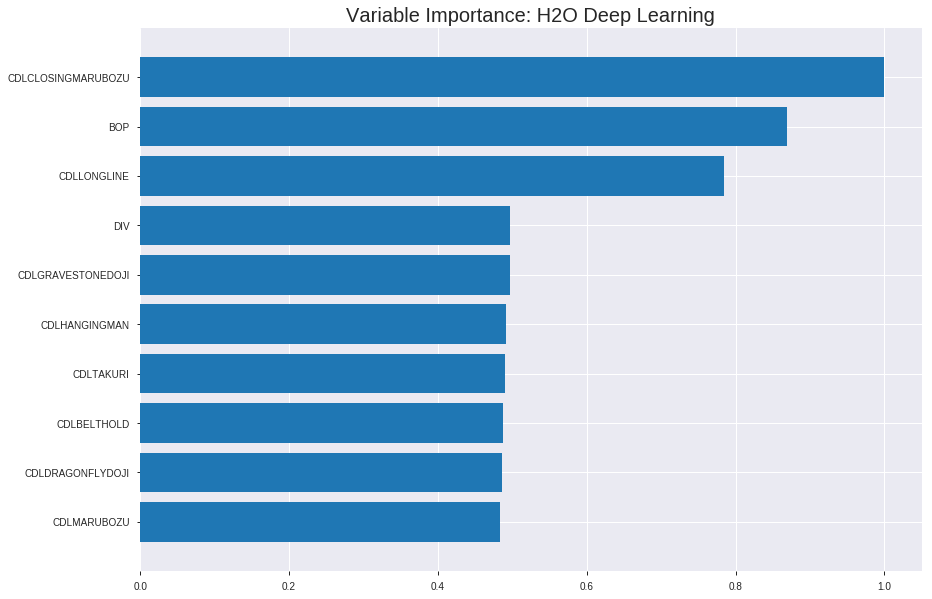

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190725_055141_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19389426123484552
RMSE: 0.4403342608006394
LogLoss: 0.5695573067154929
Mean Per-Class Error: 0.3009366413866501
AUC: 0.7714381881159091
pr_auc: 0.7135995234695783
Gini: 0.5428763762318183
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.27736501645451783: 


,0,1,Error,Rate
0,1615.0,1757.0,0.5211,(1757.0/3372.0)
1,321.0,2402.0,0.1179,(321.0/2723.0)
Total,1936.0,4159.0,0.3409,(2078.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2773650,0.6980529,277.0
max f2,0.1410692,0.8199711,336.0
max f0point5,0.5592280,0.6768875,143.0
max accuracy,0.5105942,0.7035275,165.0
max precision,0.9052675,0.92,4.0
max recall,0.0304763,1.0,394.0
max specificity,0.9253928,0.9997034,0.0
max absolute_mcc,0.4456576,0.3958806,200.0
max min_per_class_accuracy,0.4588884,0.6969158,193.0
max mean_per_class_accuracy,0.4456576,0.6990634,200.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 42.05 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.8933717,2.0548696,2.0548696,0.9180328,0.9045670,0.9180328,0.9045670,0.0205656,0.0205656,105.4869569,105.4869569
,2,0.0200164,0.8592968,1.7613168,1.9080932,0.7868852,0.8777026,0.8524590,0.8911348,0.0176276,0.0381932,76.1316773,90.8093171
,3,0.0300246,0.8279989,1.8713991,1.8958618,0.8360656,0.8437210,0.8469945,0.8753302,0.0187293,0.0569225,87.1399072,89.5861805
,4,0.0400328,0.8042845,1.9447873,1.9080932,0.8688525,0.8166382,0.8524590,0.8606572,0.0194638,0.0763863,94.4787271,90.8093171
,5,0.0500410,0.7875792,1.9447873,1.9154320,0.8688525,0.7949758,0.8557377,0.8475209,0.0194638,0.0958502,94.4787271,91.5431991
,6,0.1000820,0.7207033,1.7833332,1.8493826,0.7967213,0.7523429,0.8262295,0.7999319,0.0892398,0.1850900,78.3333233,84.9382612
,7,0.1501231,0.6813788,1.6659121,1.7882258,0.7442623,0.7011815,0.7989071,0.7670151,0.0833639,0.2684539,66.5912115,78.8225780
,8,0.2,0.6452400,1.5388588,1.7260375,0.6875,0.6633403,0.7711239,0.7411602,0.0767536,0.3452075,53.8858795,72.6037459
,9,0.3000820,0.5688438,1.4897804,1.6472421,0.6655738,0.6074260,0.7359213,0.6965578,0.1491003,0.4943077,48.9780437,64.7242061
,10,0.4,0.4976361,1.1871656,1.5323173,0.5303777,0.5309727,0.6845775,0.6551954,0.1186192,0.6129269,18.7165585,53.2317297




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.2060794831093465
RMSE: 0.4539597813786443
LogLoss: 0.5990698990580042
Mean Per-Class Error: 0.31286572494662357
AUC: 0.7382978094461337
pr_auc: 0.6706921774946051
Gini: 0.4765956188922673
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4443141810765662: 


,0,1,Error,Rate
0,596.0,395.0,0.3986,(395.0/991.0)
1,187.0,564.0,0.249,(187.0/751.0)
Total,783.0,959.0,0.3341,(582.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4443142,0.6596491,209.0
max f2,0.1108755,0.8003032,361.0
max f0point5,0.5077484,0.6435779,173.0
max accuracy,0.5077484,0.6923077,173.0
max precision,0.9198160,1.0,0.0
max recall,0.0449121,1.0,390.0
max specificity,0.9198160,1.0,0.0
max absolute_mcc,0.4843226,0.3711952,188.0
max min_per_class_accuracy,0.4843226,0.6870839,188.0
max mean_per_class_accuracy,0.4843226,0.6871343,188.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 44.42 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8888749,1.9329783,1.9329783,0.8333333,0.8987741,0.8333333,0.8987741,0.0199734,0.0199734,93.2978251,93.2978251
,2,0.0200918,0.8728914,2.1831284,2.0544797,0.9411765,0.8838386,0.8857143,0.8915197,0.0213049,0.0412783,118.3128378,105.4479741
,3,0.0304248,0.8329725,1.9329783,2.0132151,0.8333333,0.8557892,0.8679245,0.8793848,0.0199734,0.0612517,93.2978251,101.3215084
,4,0.0401837,0.8093466,1.7737918,1.9550694,0.7647059,0.8198431,0.8428571,0.8649247,0.0173103,0.0785619,77.3791807,95.5069431
,5,0.0505166,0.7951763,1.8041130,1.9241920,0.7777778,0.8013187,0.8295455,0.8519144,0.0186418,0.0972037,80.4113034,92.4191986
,6,0.1004592,0.7257979,1.7063532,1.8158950,0.7356322,0.7642874,0.7828571,0.8083512,0.0852197,0.1824234,70.6353215,81.5894997
,7,0.1504018,0.6740534,1.5997061,1.7441071,0.6896552,0.6951821,0.7519084,0.7707722,0.0798935,0.2623169,59.9706139,74.4107094
,8,0.2003444,0.6433387,1.4930591,1.6815249,0.6436782,0.6577361,0.7249284,0.7425941,0.0745672,0.3368842,49.3059063,68.1524920
,9,0.3002296,0.5840921,1.4264046,1.5966474,0.6149425,0.6121536,0.6883365,0.6991971,0.1424767,0.4793609,42.6404641,59.6647427
,10,0.4001148,0.5203242,1.2664340,1.5142125,0.5459770,0.5509835,0.6527977,0.6621968,0.1264980,0.6058589,26.6434027,51.4212518



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 06:14:26,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-07-25 06:14:30,9 min 54.681 sec,320 obs/sec,0.2255947,1,1375.0,0.4721322,0.6379174,0.0981395,0.7016724,0.6499050,2.0181755,0.4105004,0.4752477,0.6467715,0.0790780,0.6914400,0.6222350,1.8041130,0.4184845
,2019-07-25 06:15:41,11 min 4.861 sec,623 obs/sec,6.9054963,30,42089.0,0.4564770,0.6050029,0.1569563,0.7427692,0.6881430,1.9447873,0.3575062,0.4665050,0.6252081,0.1126493,0.7226832,0.6556729,2.1907087,0.3932262
,2019-07-25 06:16:51,12 min 16.025 sec,735 obs/sec,15.8607055,69,96671.0,0.4494317,0.5908667,0.1827789,0.7475916,0.6900399,1.9080932,0.3460213,0.4597371,0.6125160,0.1382094,0.7237830,0.6577268,2.0618435,0.3392652
,2019-07-25 06:18:05,13 min 29.590 sec,818 obs/sec,26.5929450,116,162084.0,0.4451534,0.5826651,0.1982636,0.7586980,0.7036233,2.0548696,0.3268253,0.4587775,0.6113775,0.1418033,0.7268412,0.6605690,2.1907087,0.3691160
,2019-07-25 06:19:15,14 min 39.306 sec,867 obs/sec,37.1371616,162,226351.0,0.4456386,0.5836423,0.1965150,0.7609741,0.7051081,2.0548696,0.3461854,0.4612294,0.6159167,0.1326054,0.7260215,0.6548611,2.0618435,0.3587830
,2019-07-25 06:20:23,15 min 47.614 sec,902 obs/sec,47.7114028,208,290801.0,0.4422093,0.5739708,0.2088333,0.7660530,0.7080111,2.0548696,0.3527482,0.4569637,0.6051864,0.1485757,0.7311630,0.6596220,1.9329783,0.3427095
,2019-07-25 06:21:32,16 min 57.765 sec,930 obs/sec,58.6954881,256,357749.0,0.4403343,0.5695573,0.2155285,0.7714382,0.7135995,2.0548696,0.3409352,0.4539598,0.5990699,0.1597327,0.7382978,0.6706922,1.9329783,0.3340987
,2019-07-25 06:22:53,18 min 17.277 sec,956 obs/sec,71.7588187,313,437370.0,0.4376610,0.5640135,0.2250245,0.7765638,0.7173757,2.0915637,0.3191140,0.4558580,0.6025697,0.1526911,0.7308815,0.6617414,2.0618435,0.3432836
,2019-07-25 06:24:00,19 min 23.999 sec,977 obs/sec,82.9786710,362,505755.0,0.4381105,0.5652391,0.2234319,0.7805406,0.7238394,2.0915637,0.3169811,0.4557282,0.6025537,0.1531732,0.7336434,0.6560467,1.8041130,0.3719862


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLCLOSINGMARUBOZU,1.0,1.0,0.0423550
BOP,0.8691968,0.8691968,0.0368148
CDLLONGLINE,0.7851552,0.7851552,0.0332552
DIV,0.4971858,0.4971858,0.0210583
CDLGRAVESTONEDOJI,0.4965602,0.4965602,0.0210318
---,---,---,---
ROCR100_20,0.1669114,0.1669114,0.0070695
RSI_24,0.1666995,0.1666995,0.0070605
ROCP_12,0.1636795,0.1636795,0.0069326
CMO_20,0.1574087,0.1574087,0.0066670



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6555683122847302)

('F1', 0.6793168880455408)

('auc', 0.7142769874743697)

('logloss', 0.6352893136812926)

('mean_per_class_error', 0.3391428601782698)

('rmse', 0.46917012418276893)

('mse', 0.22012060542567483)

deeplearning prediction progress: |███████████████████████████████████████| 100%


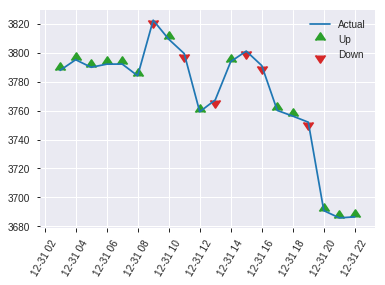


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.22012060542567483
RMSE: 0.46917012418276893
LogLoss: 0.6352893136812926
Mean Per-Class Error: 0.3391428601782698
AUC: 0.7142769874743697
pr_auc: 0.6440688532759969
Gini: 0.4285539749487395
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.1887092731238101: 


,0,1,Error,Rate
0,175.0,298.0,0.63,(298.0/473.0)
1,40.0,358.0,0.1005,(40.0/398.0)
Total,215.0,656.0,0.3881,(338.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1887093,0.6793169,315.0
max f2,0.1124959,0.8171862,358.0
max f0point5,0.5000222,0.6226533,156.0
max accuracy,0.5241915,0.6555683,144.0
max precision,0.6968017,0.7831325,54.0
max recall,0.0359005,1.0,397.0
max specificity,0.9115459,0.9978858,0.0
max absolute_mcc,0.2966492,0.3309360,267.0
max min_per_class_accuracy,0.4227600,0.6381910,206.0
max mean_per_class_accuracy,0.3170286,0.6608571,258.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 39.83 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8927350,1.2158012,1.2158012,0.5555556,0.9051264,0.5555556,0.9051264,0.0125628,0.0125628,21.5801228,21.5801228
,2,0.0206659,0.8682608,1.4589615,1.3373814,0.6666667,0.8826471,0.6111111,0.8938867,0.0150754,0.0276382,45.8961474,33.7381351
,3,0.0309989,0.8229721,1.9452820,1.5400149,0.8888889,0.8414010,0.7037037,0.8763915,0.0201005,0.0477387,94.5281965,54.0014889
,4,0.0401837,0.7881454,1.6413317,1.5631730,0.75,0.8092335,0.7142857,0.8610411,0.0150754,0.0628141,64.1331658,56.3173008
,5,0.0505166,0.7578613,1.7021217,1.5915943,0.7777778,0.7684387,0.7272727,0.8420997,0.0175879,0.0804020,70.2121720,59.1594335
,6,0.1010333,0.6934076,1.7408063,1.6662003,0.7954545,0.7232012,0.7613636,0.7826504,0.0879397,0.1683417,74.0806304,66.6200320
,7,0.1504018,0.6437409,1.6286082,1.6538609,0.7441860,0.6666872,0.7557252,0.7445862,0.0804020,0.2487437,62.8608157,65.3860908
,8,0.2009185,0.6060704,1.3926450,1.5881838,0.6363636,0.6238459,0.7257143,0.7142286,0.0703518,0.3190955,39.2645043,58.8183776
,9,0.3008037,0.5267448,1.3080344,1.4951571,0.5977011,0.5686878,0.6832061,0.6659002,0.1306533,0.4497487,30.8034425,49.5157083
,10,0.4006889,0.4718087,1.0061803,1.3732632,0.4597701,0.4959044,0.6275072,0.6235230,0.1005025,0.5502513,0.6180327,37.3263164


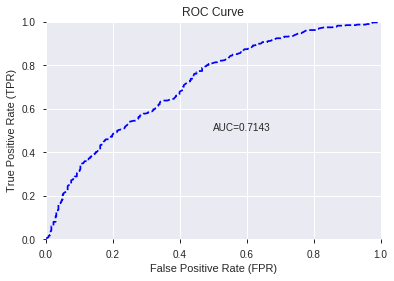

This function is available for GLM models only


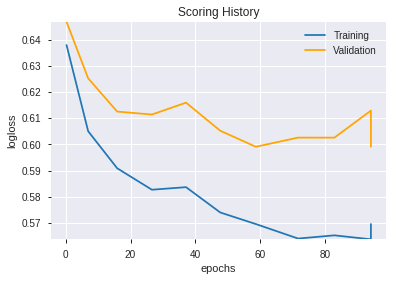

--2019-07-25 06:25:32--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.37.124
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.37.124|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


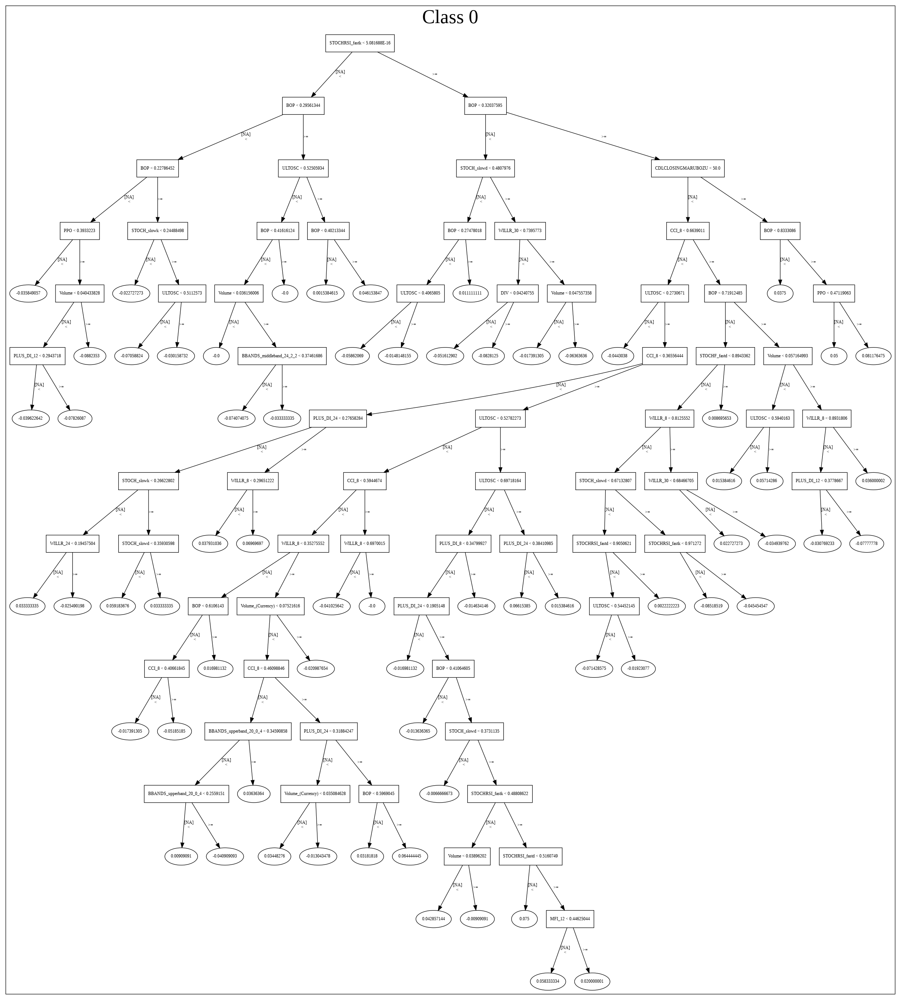

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190725_055141_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190725_055141_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_74_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLCLOSINGMARUBOZU',
 'BOP',
 'CDLLONGLINE',
 'DIV',
 'CDLGRAVESTONEDOJI',
 'CDLHANGINGMAN',
 'CDLTAKURI',
 'CDLBELTHOLD',
 'CDLDRAGONFLYDOJI',
 'CDLMARUBOZU',
 'CDLHIKKAKE',
 'CCI_8',
 'ULTOSC',
 'CDLENGULFING',
 'CDLHARAMI',
 'STOCHRSI_fastk',
 'DX_8',
 'CDLHAMMER',
 'STOCHF_fastk',
 'Volume',
 'SUB',
 'aroondown_14',
 'TRANGE',
 'CDLSHORTLINE',
 'CCI_14',
 'ADOSC',
 'CDL3INSIDE',
 'CCI_30',
 'CCI_12',
 'CCI_24',
 'CDLRICKSHAWMAN',
 'CCI_20',
 'CDLDOJI',
 'CDLLONGLEGGEDDOJI',
 'aroondown_20',
 'WILLR_8',
 'Volume_(Currency)',
 'ROCP_24',
 'WILLR_12',
 'aroondown_24',
 'ROCR_24',
 'ROCR100_24',
 'ROC_24',
 'WILLR_14',
 'MOM_24',
 'WILLR_30',
 'WILLR_24',
 'MINUS_DI_30',
 'ROC_8',
 'CMO_30',
 'MINUS_DI_8',
 'ROCR100_8',
 'ROCR_8',
 'MINUS_DI_14',
 'ROCR100_12',
 'CMO_8',
 'ROCP_8',
 'MOM_12',
 'RSI_30',
 'MOM_8',
 'WILLR_20',
 'RSI_8',
 'CMO_12',
 'ROC_14',
 'ROCR_12',
 'MOM_14',
 'ROCR_14',
 'ROCR_20',
 'CMO_24',
 'ROC_12',
 'ROCP_20',
 'RSI_14',
 'ROCP_14',
 'MINUS_DI_20',
 'ROC_20

In [0]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190725_062630_model_1,0.720388,0.616618,0.370547,0.46305,0.214416


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.612767,1.000000,0.123952
1,CCI_8,0.306155,0.499627,0.061930
2,ULTOSC,0.263239,0.429590,0.053249
3,DIV,0.260492,0.425107,0.052693
4,CDLCLOSINGMARUBOZU,0.211581,0.345287,0.042799
5,CDLHIKKAKE,0.156821,0.255922,0.031722
6,CDLGRAVESTONEDOJI,0.137190,0.223885,0.027751
7,CDLHAMMER,0.124275,0.202810,0.025139
8,STOCHF_fastk,0.118575,0.193508,0.023986
9,CDLDRAGONFLYDOJI,0.115086,0.187813,0.023280


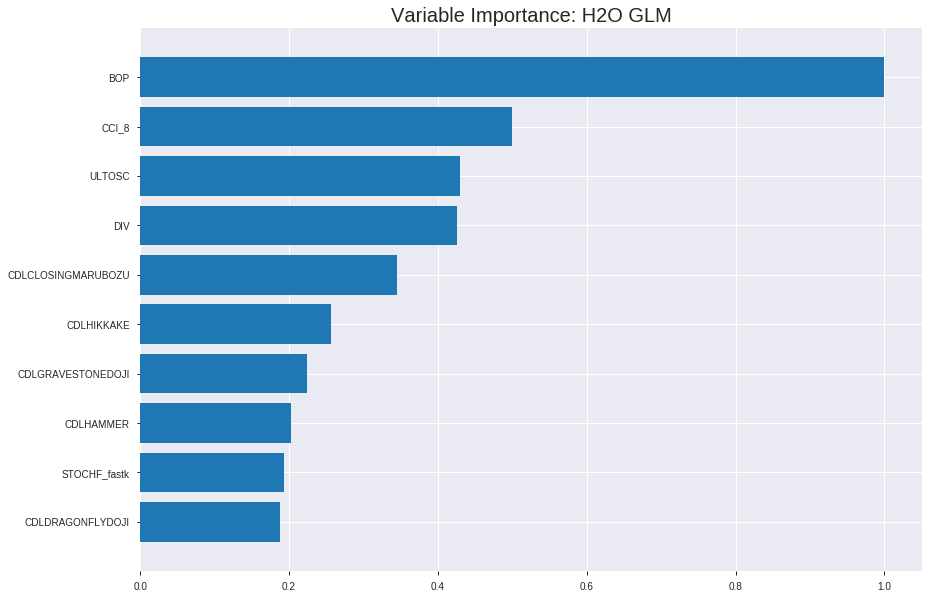

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190725_062630_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.20200682926098962
RMSE: 0.44945169847380667
LogLoss: 0.5895744748729792
Null degrees of freedom: 6094
Residual degrees of freedom: 6008
Null deviance: 8380.226957690009
Residual deviance: 7186.912848701617
AIC: 7360.912848701617
AUC: 0.7491188152066945
pr_auc: 0.6898640935466215
Gini: 0.4982376304133891
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3496499633103742: 


,0,1,Error,Rate
0,1651.0,1721.0,0.5104,(1721.0/3372.0)
1,396.0,2327.0,0.1454,(396.0/2723.0)
Total,2047.0,4048.0,0.3473,(2117.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3496500,0.6873431,260.0
max f2,0.1781859,0.8109756,342.0
max f0point5,0.5146462,0.6467458,169.0
max accuracy,0.5095664,0.6825267,172.0
max precision,0.9523469,1.0,0.0
max recall,0.0370814,1.0,396.0
max specificity,0.9523469,1.0,0.0
max absolute_mcc,0.4133782,0.3696206,226.0
max min_per_class_accuracy,0.4653893,0.6782325,198.0
max mean_per_class_accuracy,0.4133782,0.6842469,226.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 44.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.8841720,1.9814814,1.9814814,0.8852459,0.9080080,0.8852459,0.9080080,0.0198311,0.0198311,98.1481370,98.1481370
,2,0.0200164,0.8615705,1.7980109,1.8897461,0.8032787,0.8738136,0.8442623,0.8909108,0.0179949,0.0378259,79.8010873,88.9746121
,3,0.0300246,0.8366779,1.7246227,1.8347050,0.7704918,0.8483014,0.8196721,0.8767077,0.0172604,0.0550863,72.4622674,83.4704972
,4,0.0400328,0.8171515,1.9080932,1.8530520,0.8524590,0.8269968,0.8278689,0.8642800,0.0190966,0.0741829,90.8093171,85.3052022
,5,0.0500410,0.7945906,1.8347050,1.8493826,0.8196721,0.8061020,0.8262295,0.8526444,0.0183621,0.0925450,83.4704972,84.9382612
,6,0.1000820,0.7058071,1.8126885,1.8310356,0.8098361,0.7483730,0.8180328,0.8005087,0.0907088,0.1832538,81.2688513,83.1035562
,7,0.1501231,0.6525441,1.5851851,1.7490854,0.7081967,0.6761291,0.7814208,0.7590488,0.0793243,0.2625780,58.5185096,74.9085407
,8,0.2,0.6138948,1.5020440,1.6874770,0.6710526,0.6322218,0.7538966,0.7274201,0.0749174,0.3374954,50.2043992,68.7477047
,9,0.3000820,0.5590274,1.3466734,1.5738137,0.6016393,0.5850316,0.7031165,0.6799313,0.1347778,0.4722732,34.6673450,57.3813737
,10,0.4,0.5074667,1.1871656,1.4772310,0.5303777,0.5341627,0.6599672,0.6435191,0.1186192,0.5908924,18.7165585,47.7230995




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2077512575761857
RMSE: 0.45579738653944224
LogLoss: 0.603550474185727
Null degrees of freedom: 1741
Residual degrees of freedom: 1655
Null deviance: 2383.4834095378615
Residual deviance: 2102.769852063073
AIC: 2276.769852063073
AUC: 0.7338469662380868
pr_auc: 0.6792133472948344
Gini: 0.4676939324761735
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3930224993840276: 


,0,1,Error,Rate
0,505.0,486.0,0.4904,(486.0/991.0)
1,143.0,608.0,0.1904,(143.0/751.0)
Total,648.0,1094.0,0.3611,(629.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3930225,0.6590786,247.0
max f2,0.1689892,0.7963644,355.0
max f0point5,0.5936816,0.6412540,138.0
max accuracy,0.5335090,0.6894374,171.0
max precision,0.9584037,1.0,0.0
max recall,0.0311619,1.0,395.0
max specificity,0.9584037,1.0,0.0
max absolute_mcc,0.5335090,0.3630673,171.0
max min_per_class_accuracy,0.4929821,0.6740666,192.0
max mean_per_class_accuracy,0.5194428,0.6801594,179.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 47.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.9092621,2.3195739,2.3195739,1.0,0.9263102,1.0,0.9263102,0.0239680,0.0239680,131.9573901,131.9573901
,2,0.0200918,0.8916729,2.1831284,2.2533004,0.9411765,0.8987505,0.9714286,0.9129241,0.0213049,0.0452730,118.3128378,125.3300361
,3,0.0304248,0.8708864,2.0618435,2.1882773,0.8888889,0.8816990,0.9433962,0.9023193,0.0213049,0.0665779,106.1843468,118.8277266
,4,0.0401837,0.8618095,1.6373463,2.0544797,0.7058824,0.8660459,0.8857143,0.8935101,0.0159787,0.0825566,63.7346283,105.4479741
,5,0.0505166,0.8562071,1.8041130,2.0032684,0.7777778,0.8592362,0.8636364,0.8864995,0.0186418,0.1011984,80.4113034,100.3268369
,6,0.1004592,0.7712762,1.7063532,1.8556591,0.7356322,0.8155623,0.8,0.8512336,0.0852197,0.1864181,70.6353215,85.5659121
,7,0.1504018,0.7115575,1.6263679,1.7795204,0.7011494,0.7400010,0.7671756,0.8142976,0.0812250,0.2676431,62.6367908,77.9520436
,8,0.2003444,0.6561241,1.5730444,1.7280493,0.6781609,0.6818075,0.7449857,0.7812700,0.0785619,0.3462051,57.3044370,72.8049325
,9,0.3002296,0.5910439,1.3597502,1.6055177,0.5862069,0.6226397,0.6921606,0.7284943,0.1358189,0.4820240,35.9750218,60.5517691
,10,0.4001148,0.5356472,1.1997796,1.5042287,0.5172414,0.5635723,0.6484935,0.6873230,0.1198402,0.6018642,19.9779604,50.4228699



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-07-25 06:26:31,0.000 sec,2,.16E2,87,1.3564785,1.3534531
,2019-07-25 06:26:31,0.070 sec,4,.1E2,87,1.3488750,1.3466652
,2019-07-25 06:26:31,0.139 sec,6,.63E1,87,1.3388748,1.3373731
,2019-07-25 06:26:31,0.209 sec,8,.39E1,87,1.3260025,1.3250991
,2019-07-25 06:26:31,0.283 sec,10,.24E1,87,1.3101210,1.3098124
---,---,---,---,---,---,---,---
,2019-07-25 06:26:32,1.145 sec,34,.8E-2,87,1.1770858,1.2074832
,2019-07-25 06:26:32,1.218 sec,36,.5E-2,87,1.1756956,1.2081362
,2019-07-25 06:26:32,1.289 sec,38,.31E-2,87,1.1748488,1.2089842
,2019-07-25 06:26:32,1.372 sec,40,.19E-2,87,1.1741648,1.2095517



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6727898966704937)

('F1', 0.676109537299339)

('auc', 0.7203884114016169)

('logloss', 0.6166180808170533)

('mean_per_class_error', 0.326765965132215)

('rmse', 0.46305043697268844)

('mse', 0.2144157071805977)

glm prediction progress: |████████████████████████████████████████████████| 100%


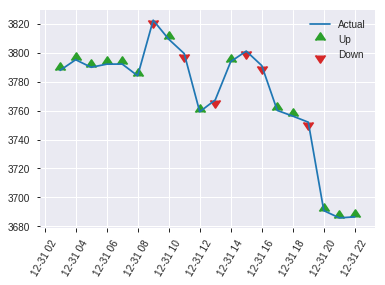


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2144157071805977
RMSE: 0.46305043697268844
LogLoss: 0.6166180808170533
Null degrees of freedom: 870
Residual degrees of freedom: 784
Null deviance: 1201.3614369590905
Residual deviance: 1074.1486967833068
AIC: 1248.1486967833068
AUC: 0.7203884114016169
pr_auc: 0.6675328189869212
Gini: 0.4407768228032338
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.25239541722460496: 


,0,1,Error,Rate
0,170.0,303.0,0.6406,(303.0/473.0)
1,40.0,358.0,0.1005,(40.0/398.0)
Total,210.0,661.0,0.3938,(343.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2523954,0.6761095,298.0
max f2,0.1604414,0.8192568,349.0
max f0point5,0.4131150,0.6410256,205.0
max accuracy,0.4131150,0.6727899,205.0
max precision,0.9743615,1.0,0.0
max recall,0.0525959,1.0,392.0
max specificity,0.9743615,1.0,0.0
max absolute_mcc,0.4131150,0.3452470,205.0
max min_per_class_accuracy,0.4152974,0.6680761,203.0
max mean_per_class_accuracy,0.4131150,0.6732340,205.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 40.83 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8739961,2.1884422,2.1884422,1.0,0.9041654,1.0,0.9041654,0.0226131,0.0226131,118.8442211,118.8442211
,2,0.0206659,0.8437190,1.2158012,1.7021217,0.5555556,0.8584975,0.7777778,0.8813314,0.0125628,0.0351759,21.5801228,70.2121720
,3,0.0309989,0.8105497,1.4589615,1.6210683,0.6666667,0.8256251,0.7407407,0.8627627,0.0150754,0.0502513,45.8961474,62.1068304
,4,0.0401837,0.7810020,1.9148869,1.6882268,0.875,0.7981071,0.7714286,0.8479843,0.0175879,0.0678392,91.4886935,68.8226849
,5,0.0505166,0.7612062,2.1884422,1.7905436,1.0,0.7715090,0.8181818,0.8323416,0.0226131,0.0904523,118.8442211,79.0543627
,6,0.1010333,0.6648663,1.6910690,1.7408063,0.7727273,0.7078015,0.7954545,0.7700715,0.0854271,0.1758794,69.1068981,74.0806304
,7,0.1504018,0.6000975,1.6286082,1.7039779,0.7441860,0.6314361,0.7786260,0.7245653,0.0804020,0.2562814,62.8608157,70.3977905
,8,0.2009185,0.5695427,1.2931704,1.6006892,0.5909091,0.5840645,0.7314286,0.6892393,0.0653266,0.3216080,29.3170397,60.0689160
,9,0.3008037,0.5162462,1.1571074,1.4533929,0.5287356,0.5404977,0.6641221,0.6398480,0.1155779,0.4371859,15.7107376,45.3392919
,10,0.4006889,0.4623437,1.1571074,1.3795338,0.5287356,0.4870408,0.6303725,0.6017557,0.1155779,0.5527638,15.7107376,37.9533772


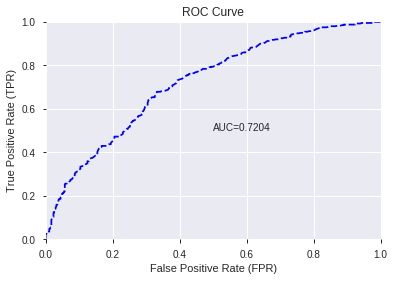

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


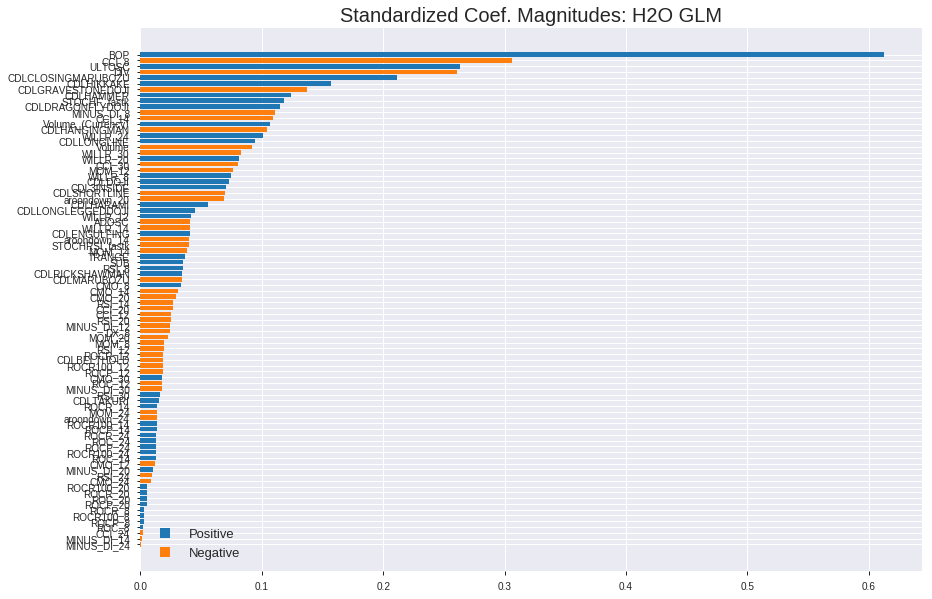

'log_likelihood'
--2019-07-25 06:26:44--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.130.171
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.130.171|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


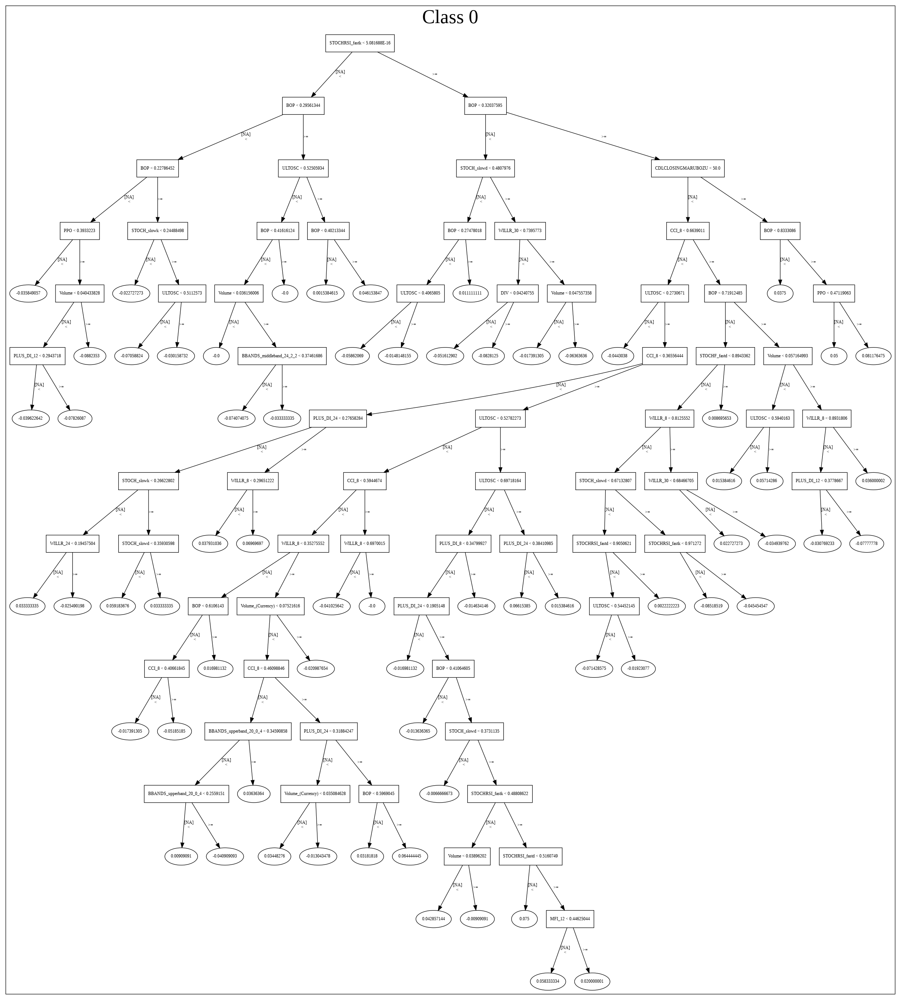

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190725_062630_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190725_062630_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_82_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_82_s

['BOP',
 'CCI_8',
 'ULTOSC',
 'DIV',
 'CDLCLOSINGMARUBOZU',
 'CDLHIKKAKE',
 'CDLGRAVESTONEDOJI',
 'CDLHAMMER',
 'STOCHF_fastk',
 'CDLDRAGONFLYDOJI',
 'MINUS_DI_8',
 'CCI_14',
 'Volume_(Currency)',
 'CDLHANGINGMAN',
 'WILLR_24',
 'CDLLONGLINE',
 'Volume',
 'WILLR_30',
 'WILLR_20',
 'CCI_30',
 'MOM_12',
 'WILLR_8',
 'CDLDOJI',
 'CDL3INSIDE',
 'CDLSHORTLINE',
 'aroondown_20',
 'CDLHARAMI',
 'CDLLONGLEGGEDDOJI',
 'WILLR_12',
 'ADOSC',
 'WILLR_14',
 'CDLENGULFING',
 'aroondown_14',
 'STOCHRSI_fastk',
 'MOM_14',
 'TRANGE',
 'SUB',
 'RSI_8',
 'CDLRICKSHAWMAN',
 'CDLMARUBOZU',
 'CMO_8',
 'CMO_14',
 'CMO_20',
 'RSI_14',
 'CCI_20',
 'CCI_12',
 'RSI_20',
 'MINUS_DI_12',
 'DX_8',
 'MOM_20',
 'MOM_8',
 'RSI_12',
 'ROCR_12',
 'CDLBELTHOLD',
 'ROCR100_12',
 'ROCP_12',
 'CMO_30',
 'ROC_12',
 'MINUS_DI_30',
 'RSI_30',
 'CDLTAKURI',
 'ROCR_14',
 'MOM_24',
 'aroondown_24',
 'ROCR100_14',
 'ROCP_14',
 'ROCR_24',
 'ROC_24',
 'ROCP_24',
 'ROCR100_24',
 'ROC_14',
 'CMO_12',
 'MINUS_DI_20',
 'RSI_24',
 'CMO_2

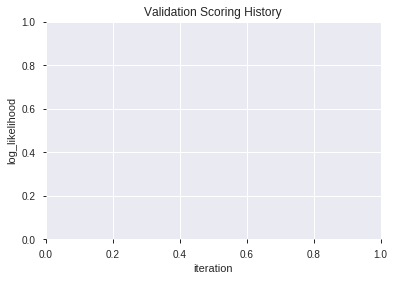

In [0]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_3_AutoML_20190725_062742,0.742401,0.598181,0.323592,0.454284,0.206374
1,XGBoost_grid_1_AutoML_20190725_062742_model_2,0.740019,0.602882,0.306695,0.456703,0.208578
2,XGBoost_grid_1_AutoML_20190725_062742_model_4,0.737350,0.602655,0.346112,0.456668,0.208546
3,XGBoost_grid_1_AutoML_20190725_062742_model_6,0.733953,0.604120,0.338713,0.457556,0.209357
4,XGBoost_grid_1_AutoML_20190725_062742_model_1,0.730856,0.606045,0.355488,0.458368,0.210101
5,XGBoost_grid_1_AutoML_20190725_062742_model_3,0.730431,0.608729,0.332907,0.459220,0.210883
6,XGBoost_2_AutoML_20190725_062742,0.725939,0.614666,0.330869,0.461606,0.213081
7,XGBoost_grid_1_AutoML_20190725_062742_model_7,0.725841,0.616210,0.342880,0.462096,0.213533
8,XGBoost_1_AutoML_20190725_062742,0.724508,0.615213,0.328097,0.461938,0.213387
9,XGBoost_grid_1_AutoML_20190725_062742_model_5,0.723082,0.616220,0.352255,0.462061,0.213501


,variable,relative_importance,scaled_importance,percentage
0,BOP,4738.197266,1.000000,0.260024
1,CCI_8,955.482056,0.201655,0.052435
2,CDLCLOSINGMARUBOZU,944.159668,0.199266,0.051814
3,STOCHF_fastk,873.537842,0.184361,0.047938
4,DIV,800.093811,0.168860,0.043908
5,ULTOSC,687.241577,0.145043,0.037715
6,STOCHRSI_fastk,651.922485,0.137589,0.035776
7,CDLLONGLINE,480.159180,0.101338,0.026350
8,WILLR_8,429.161011,0.090575,0.023552
9,CDLSHORTLINE,394.862061,0.083336,0.021669


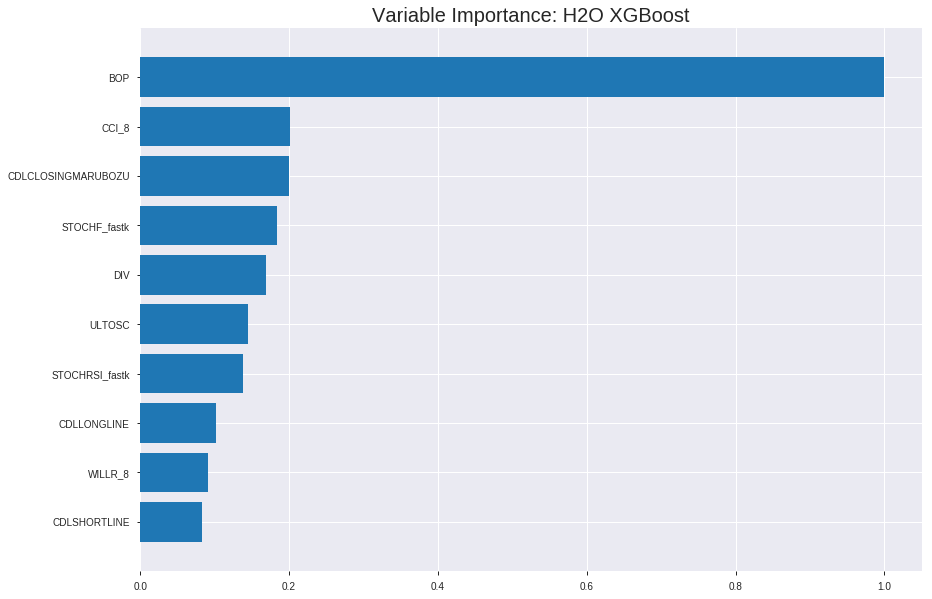

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_3_AutoML_20190725_062742


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.17499650268253825
RMSE: 0.4183258331522669
LogLoss: 0.525520882699901
Mean Per-Class Error: 0.25099706424208523
AUC: 0.8300809762102977
pr_auc: 0.7979867353900032
Gini: 0.6601619524205955
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4357088840007782: 


,0,1,Error,Rate
0,2253.0,1119.0,0.3319,(1119.0/3372.0)
1,484.0,2239.0,0.1777,(484.0/2723.0)
Total,2737.0,3358.0,0.263,(1603.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4357089,0.7363920,215.0
max f2,0.2595790,0.8411960,303.0
max f0point5,0.5576882,0.7241476,148.0
max accuracy,0.4903605,0.7468417,186.0
max precision,0.9307947,1.0,0.0
max recall,0.1164142,1.0,373.0
max specificity,0.9307947,1.0,0.0
max absolute_mcc,0.4670196,0.4951962,197.0
max min_per_class_accuracy,0.4781390,0.7449585,192.0
max mean_per_class_accuracy,0.4670196,0.7490029,197.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 44.73 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.8830866,2.2383401,2.2383401,1.0,0.8999676,1.0,0.8999676,0.0224018,0.0224018,123.8340066,123.8340066
,2,0.0200164,0.8522160,2.2383401,2.2383401,1.0,0.8676140,1.0,0.8837908,0.0224018,0.0448035,123.8340066,123.8340066
,3,0.0300246,0.8208971,2.1649519,2.2138773,0.9672131,0.8360371,0.9890710,0.8678729,0.0216673,0.0664708,116.4951867,121.3877333
,4,0.0400328,0.7883348,1.9447873,2.1466048,0.8688525,0.8046839,0.9590164,0.8520756,0.0194638,0.0859346,94.4787271,114.6604817
,5,0.0500410,0.7691621,2.1282578,2.1429354,0.9508197,0.7783428,0.9573770,0.8373291,0.0213000,0.1072347,112.8257768,114.2935408
,6,0.1000820,0.6903563,2.0622084,2.1025719,0.9213115,0.7260447,0.9393443,0.7816869,0.1031950,0.2104297,106.2208389,110.2571898
,7,0.1501231,0.6479902,1.8347050,2.0132829,0.8196721,0.6675653,0.8994536,0.7436464,0.0918105,0.3022402,83.4704972,101.3282923
,8,0.2,0.6175655,1.5830366,1.9059860,0.7072368,0.6324510,0.8515176,0.7159159,0.0789570,0.3811972,58.3036560,90.5986045
,9,0.3000820,0.5674765,1.4787722,1.7635036,0.6606557,0.5914392,0.7878622,0.6744010,0.1479985,0.5291957,47.8772208,76.3503573
,10,0.4,0.5161759,1.2937532,1.6461623,0.5779967,0.5427251,0.7354389,0.6415090,0.1292692,0.6584649,29.3753207,64.6162321




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.20770123926224537
RMSE: 0.4557425142141617
LogLoss: 0.6023752622535987
Mean Per-Class Error: 0.3103376460044529
AUC: 0.7474292601455711
pr_auc: 0.6843387182550104
Gini: 0.4948585202911422
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4759899005293846: 


,0,1,Error,Rate
0,567.0,424.0,0.4279,(424.0/991.0)
1,160.0,591.0,0.213,(160.0/751.0)
Total,727.0,1015.0,0.3352,(584.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4759899,0.6693092,216.0
max f2,0.2400590,0.8015769,335.0
max f0point5,0.5777778,0.6521739,156.0
max accuracy,0.5777778,0.6986223,156.0
max precision,0.9317600,1.0,0.0
max recall,0.0394463,1.0,399.0
max specificity,0.9317600,1.0,0.0
max absolute_mcc,0.5777778,0.3806069,156.0
max min_per_class_accuracy,0.5417397,0.6844208,180.0
max mean_per_class_accuracy,0.5584848,0.6896624,169.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 50.45 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8971014,2.1907087,2.1907087,0.9444444,0.9101531,0.9444444,0.9101531,0.0226365,0.0226365,119.0708685,119.0708685
,2,0.0200918,0.8755373,1.9102373,2.0544797,0.8235294,0.8871237,0.8857143,0.8989674,0.0186418,0.0412783,91.0237331,105.4479741
,3,0.0304248,0.8537668,1.6752478,1.9256840,0.7222222,0.8642303,0.8301887,0.8871699,0.0173103,0.0585885,67.5247818,92.5683994
,4,0.0401837,0.8307423,2.0466829,1.9550694,0.8823529,0.8417303,0.8428571,0.8761346,0.0199734,0.0785619,104.6682854,95.5069431
,5,0.0505166,0.8057508,2.0618435,1.9769096,0.8888889,0.8150378,0.8522727,0.8636375,0.0213049,0.0998668,106.1843468,97.6909575
,6,0.1004592,0.7336615,1.7330150,1.8556591,0.7471264,0.7668862,0.8,0.8155383,0.0865513,0.1864181,73.3014984,85.5659121
,7,0.1504018,0.6928415,1.5730444,1.7618138,0.6781609,0.7101093,0.7595420,0.7805294,0.0785619,0.2649800,57.3044370,76.1813765
,8,0.2003444,0.6638492,1.6796914,1.7413420,0.7241379,0.6787803,0.7507163,0.7551650,0.0838881,0.3488682,67.9691446,74.1342012
,9,0.3002296,0.6164381,1.2797649,1.5877772,0.5517241,0.6407169,0.6845124,0.7170886,0.1278296,0.4766977,27.9764911,58.7777164
,10,0.4001148,0.5759750,1.3730811,1.5341802,0.5919540,0.5965567,0.6614060,0.6869989,0.1371505,0.6138482,37.3081103,53.4180156



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 06:27:52,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5532404,0.5,0.6931472,0.5,0.0,1.0,0.5688863
,2019-07-25 06:27:52,0.187 sec,5.0,0.4819593,0.6574928,0.7614352,0.7065009,2.1125906,0.3522559,0.4855170,0.6644419,0.7211663,0.6286062,1.8363293,0.3553387
,2019-07-25 06:27:52,0.275 sec,10.0,0.4696598,0.6332467,0.7742242,0.7250069,2.1410209,0.3248564,0.4768855,0.6473300,0.7334795,0.6585839,1.8312426,0.3352468
,2019-07-25 06:27:52,0.429 sec,15.0,0.4599509,0.6137939,0.7811094,0.7376886,2.2039041,0.3235439,0.4710154,0.6354937,0.7372545,0.6686150,2.0618435,0.3404133
,2019-07-25 06:27:53,0.569 sec,20.0,0.4529246,0.5994003,0.7862135,0.7451573,2.2383401,0.3050041,0.4668842,0.6269823,0.7412794,0.6729145,2.0618435,0.3318025
,2019-07-25 06:27:53,0.730 sec,25.0,0.4471200,0.5873732,0.7918893,0.7508599,2.2016460,0.3110747,0.4632550,0.6194295,0.7414339,0.6738746,2.0618435,0.3335247
,2019-07-25 06:27:53,0.864 sec,30.0,0.4422654,0.5769502,0.7960498,0.7559650,2.2383401,0.3079573,0.4605130,0.6135209,0.7445223,0.6793404,2.0618435,0.3639495
,2019-07-25 06:27:53,0.977 sec,35.0,0.4384699,0.5686060,0.7992735,0.7591606,2.2383401,0.2982773,0.4595024,0.6110947,0.7433237,0.6761265,2.0618435,0.3645235
,2019-07-25 06:27:53,1.086 sec,40.0,0.4349142,0.5607307,0.8039495,0.7649131,2.2383401,0.2986054,0.4582334,0.6083345,0.7460131,0.6815341,2.0618435,0.3553387
,2019-07-25 06:27:53,1.194 sec,45.0,0.4323314,0.5550518,0.8069195,0.7692157,2.2383401,0.2943396,0.4572568,0.6061835,0.7467635,0.6835460,2.0618435,0.3478760


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,4738.1972656,1.0,0.2600236
CCI_8,955.4820557,0.2016552,0.0524351
CDLCLOSINGMARUBOZU,944.1596680,0.1992656,0.0518138
STOCHF_fastk,873.5378418,0.1843608,0.0479382
DIV,800.0938110,0.1688604,0.0439077
---,---,---,---
ROCR100_14,9.1931095,0.0019402,0.0005045
CDLHARAMI,8.3339167,0.0017589,0.0004574
ROCR_20,8.3320427,0.0017585,0.0004572
ROCR100_12,4.0881519,0.0008628,0.0002244



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.687715269804822)

('F1', 0.6968139773895168)

('auc', 0.742401223878377)

('logloss', 0.5981814878598963)

('mean_per_class_error', 0.3058527308848683)

('rmse', 0.45428371411713536)

('mse', 0.20637369291205915)

xgboost prediction progress: |████████████████████████████████████████████| 100%


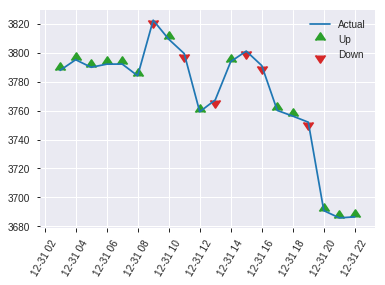


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.20637369291205915
RMSE: 0.45428371411713536
LogLoss: 0.5981814878598963
Mean Per-Class Error: 0.3058527308848683
AUC: 0.742401223878377
pr_auc: 0.6687986942923447
Gini: 0.4848024477567541
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3505411346753438: 


,0,1,Error,Rate
0,237.0,236.0,0.4989,(236.0/473.0)
1,59.0,339.0,0.1482,(59.0/398.0)
Total,296.0,575.0,0.3387,(295.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3505411,0.6968140,247.0
max f2,0.1445208,0.8236030,359.0
max f0point5,0.4539338,0.6545894,181.0
max accuracy,0.4077958,0.6877153,212.0
max precision,0.7340728,0.8378378,27.0
max recall,0.1102536,1.0,374.0
max specificity,0.9163218,0.9978858,0.0
max absolute_mcc,0.4059738,0.3894798,213.0
max min_per_class_accuracy,0.4530411,0.6834171,182.0
max mean_per_class_accuracy,0.4059738,0.6941473,213.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 43.07 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8485819,1.2158012,1.2158012,0.5555556,0.8737877,0.5555556,0.8737877,0.0125628,0.0125628,21.5801228,21.5801228
,2,0.0206659,0.8167319,1.9452820,1.5805416,0.8888889,0.8370584,0.7222222,0.8554230,0.0201005,0.0326633,94.5281965,58.0541597
,3,0.0309989,0.7488028,1.9452820,1.7021217,0.8888889,0.7762386,0.7777778,0.8290282,0.0201005,0.0527638,94.5281965,70.2121720
,4,0.0401837,0.7354692,2.1884422,1.8132807,1.0,0.7441629,0.8285714,0.8096304,0.0201005,0.0728643,118.8442211,81.3280689
,5,0.0505166,0.7218027,1.7021217,1.7905436,0.7777778,0.7292381,0.8181818,0.7931865,0.0175879,0.0904523,70.2121720,79.0543627
,6,0.1010333,0.6573754,1.4921197,1.6413317,0.6818182,0.6830547,0.75,0.7381206,0.0753769,0.1658291,49.2119689,64.1331658
,7,0.1504018,0.6238631,1.5777142,1.6204496,0.7209302,0.6412391,0.7404580,0.7063198,0.0778894,0.2437186,57.7714152,62.0449576
,8,0.2009185,0.5972655,1.6910690,1.6382053,0.7727273,0.6096656,0.7485714,0.6820182,0.0854271,0.3291457,69.1068981,63.8205312
,9,0.3008037,0.5484910,1.2074164,1.4951571,0.5517241,0.5730332,0.6832061,0.6458285,0.1206030,0.4497487,20.7416392,49.5157083
,10,0.4006889,0.4984509,1.2828799,1.4422399,0.5862069,0.5222501,0.6590258,0.6150224,0.1281407,0.5778894,28.2879917,44.2239853


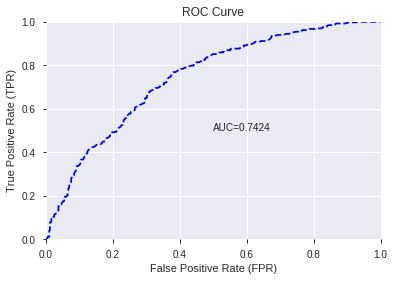

This function is available for GLM models only


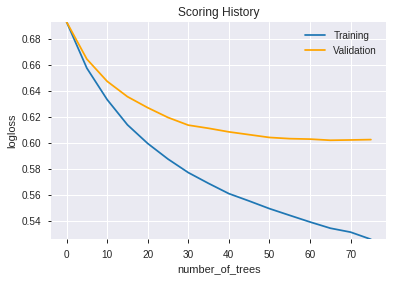

--2019-07-25 06:28:25--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.165.203
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.165.203|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMo

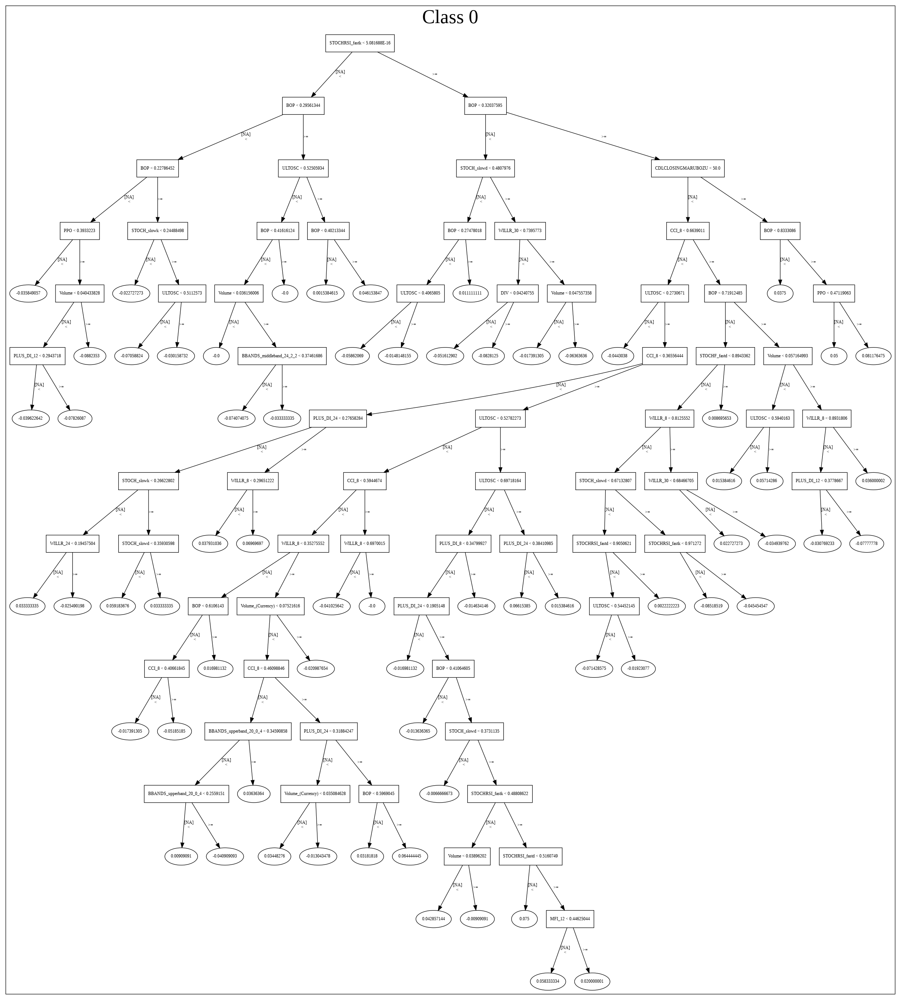

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_3_AutoML_20190725_062742',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_3_AutoML_20190725_062742',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_90_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_90_sid_8dc6',
   'type

['BOP',
 'CCI_8',
 'CDLCLOSINGMARUBOZU',
 'STOCHF_fastk',
 'DIV',
 'ULTOSC',
 'STOCHRSI_fastk',
 'CDLLONGLINE',
 'WILLR_8',
 'CDLSHORTLINE',
 'TRANGE',
 'CDLGRAVESTONEDOJI',
 'Volume',
 'CDLHAMMER',
 'CDLHIKKAKE',
 'CDLDRAGONFLYDOJI',
 'ADOSC',
 'MOM_24',
 'MOM_8',
 'CCI_12',
 'CCI_14',
 'ROC_24',
 'DX_8',
 'CCI_24',
 'Volume_(Currency)',
 'WILLR_20',
 'CCI_20',
 'SUB',
 'WILLR_24',
 'CCI_30',
 'WILLR_12',
 'ROC_14',
 'WILLR_14',
 'ROC_20',
 'MOM_20',
 'MOM_12',
 'CDLBELTHOLD',
 'WILLR_30',
 'CDLDOJI',
 'MINUS_DI_8',
 'CMO_30',
 'MOM_14',
 'aroondown_20',
 'ROC_12',
 'MINUS_DI_12',
 'CMO_12',
 'CDLHANGINGMAN',
 'MINUS_DI_14',
 'CMO_8',
 'ROC_8',
 'MINUS_DI_24',
 'MINUS_DI_30',
 'RSI_8',
 'CMO_20',
 'CMO_14',
 'CMO_24',
 'ROCR_24',
 'aroondown_24',
 'ROCP_24',
 'aroondown_14',
 'ROCR_8',
 'RSI_30',
 'MINUS_DI_20',
 'ROCP_8',
 'ROCR_12',
 'RSI_14',
 'RSI_12',
 'ROCP_12',
 'CDLENGULFING',
 'RSI_24',
 'ROCR100_20',
 'ROCR100_8',
 'ROCP_20',
 'CDLTAKURI',
 'ROCR100_24',
 'ROCP_14',
 'RSI_20

In [0]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [0]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=5).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

135

['Volume',
 'day',
 'dayofyear',
 'days_in_month',
 'hour',
 'weekday_name',
 'weekofyear',
 'BBANDS_lowerband_8_4_4',
 'BBANDS_lowerband_8_6_5',
 'BBANDS_upperband_14_5_5',
 'BBANDS_middleband_20_1_4',
 'BBANDS_lowerband_24_5_4',
 'BBANDS_lowerband_30_2_4',
 'BBANDS_lowerband_30_7_3',
 'BOP',
 'aroondown_8',
 'aroonup_8',
 'AROONOSC_8',
 'CCI_8',
 'MINUS_DI_8',
 'MOM_8',
 'PLUS_DI_8',
 'PLUS_DM_8',
 'ROC_8',
 'ROCR_8',
 'ROCR100_8',
 'RSI_8',
 'WILLR_8',
 'aroondown_12',
 'aroonup_12',
 'CCI_12',
 'MACDFIX_hist_12',
 'MFI_12',
 'MOM_12',
 'PLUS_DI_12',
 'PLUS_DM_12',
 'ROC_12',
 'ROCP_12',
 'ROCR100_12',
 'RSI_12',
 'TRIX_12',
 'WILLR_12',
 'ADX_14',
 'ADXR_14',
 'aroondown_14',
 'aroonup_14',
 'CCI_14',
 'DX_14',
 'MACDFIX_signal_14',
 'MACDFIX_hist_14',
 'MFI_14',
 'MINUS_DI_14',
 'PLUS_DI_14',
 'PLUS_DM_14',
 'ROC_14',
 'ROCP_14',
 'ROCR_14',
 'ROCR100_14',
 'RSI_14',
 'WILLR_14',
 'aroondown_20',
 'aroonup_20',
 'MACDFIX_20',
 'MFI_20',
 'MINUS_DI_20',
 'PLUS_DI_20',
 'PLUS_DM_20'

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190725_063612_model_8,0.712867,0.626828,0.370685,0.469394,0.220331
1,DeepLearning_grid_1_AutoML_20190725_063612_model_3,0.711796,0.649580,0.380260,0.472297,0.223065
2,DeepLearning_grid_1_AutoML_20190725_063612_model_9,0.702312,0.634795,0.397556,0.472177,0.222951
3,DeepLearning_grid_1_AutoML_20190725_063612_model_2,0.701364,0.736635,0.395442,0.493369,0.243413
4,DeepLearning_grid_1_AutoML_20190725_063612_model_6,0.698835,0.678857,0.365079,0.491522,0.241594
5,DeepLearning_grid_1_AutoML_20190725_063612_model_5,0.692644,0.627202,0.363761,0.469939,0.220843
6,DeepLearning_grid_1_AutoML_20190725_063612_model_1,0.689590,1.178087,0.372616,0.576377,0.332211
7,DeepLearning_1_AutoML_20190725_063612,0.680578,0.685242,0.417702,0.487739,0.237890
8,DeepLearning_grid_1_AutoML_20190725_063612_model_4,0.680201,0.820917,0.414392,0.508936,0.259016
9,DeepLearning_grid_1_AutoML_20190725_063612_model_7,0.662533,0.815246,0.374776,0.513890,0.264083


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.020409
1,CDLCLOSINGMARUBOZU,0.913836,0.913836,0.018650
2,ULTOSC,0.664075,0.664075,0.013553
3,DIV,0.615499,0.615499,0.012562
4,CDLLONGLINE,0.609267,0.609267,0.012435
5,TRANGE,0.599136,0.599136,0.012228
6,CDLHIKKAKE,0.567804,0.567804,0.011588
7,SUB,0.562554,0.562554,0.011481
8,CDLTAKURI,0.546804,0.546804,0.011160
9,STOCHF_fastk,0.540024,0.540024,0.011021


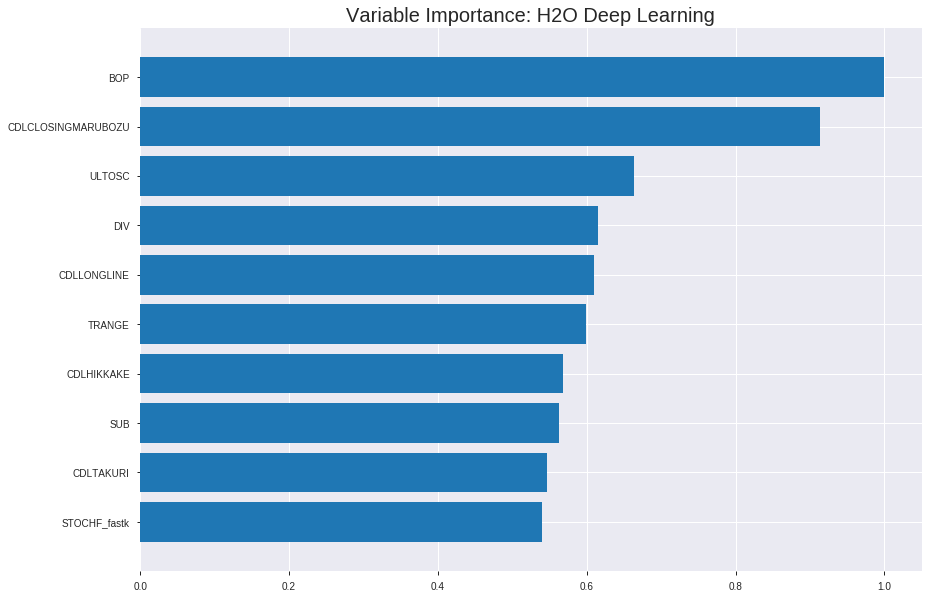

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190725_063612_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19962057576493888
RMSE: 0.4467891849238731
LogLoss: 0.5804114747837844
Mean Per-Class Error: 0.3033053088034837
AUC: 0.7689609926251008
pr_auc: 0.7091051090928885
Gini: 0.5379219852502015
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38153842660438414: 


,0,1,Error,Rate
0,1689.0,1683.0,0.4991,(1683.0/3372.0)
1,349.0,2374.0,0.1282,(349.0/2723.0)
Total,2038.0,4057.0,0.3334,(2032.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3815384,0.7002950,230.0
max f2,0.2469013,0.8277959,301.0
max f0point5,0.4855783,0.6611106,152.0
max accuracy,0.4767224,0.6938474,160.0
max precision,0.8606158,1.0,0.0
max recall,0.0582197,1.0,382.0
max specificity,0.8606158,1.0,0.0
max absolute_mcc,0.4000217,0.3942907,219.0
max min_per_class_accuracy,0.4593087,0.6904150,174.0
max mean_per_class_accuracy,0.4385277,0.6966947,191.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 41.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.7910984,1.9447873,1.9447873,0.8688525,0.8146532,0.8688525,0.8146532,0.0194638,0.0194638,94.4787271,94.4787271
,2,0.0200164,0.7632209,1.9447873,1.9447873,0.8688525,0.7785293,0.8688525,0.7965913,0.0194638,0.0389277,94.4787271,94.4787271
,3,0.0300246,0.7296995,1.9447873,1.9447873,0.8688525,0.7479996,0.8688525,0.7803941,0.0194638,0.0583915,94.4787271,94.4787271
,4,0.0400328,0.6989005,1.9080932,1.9356137,0.8524590,0.7128039,0.8647541,0.7634965,0.0190966,0.0774881,90.8093171,93.5613746
,5,0.0500410,0.6750186,2.0181755,1.9521261,0.9016393,0.6894370,0.8721311,0.7486846,0.0201983,0.0976864,101.8175469,95.2126090
,6,0.1000820,0.6035210,1.7833332,1.8677297,0.7967213,0.6363636,0.8344262,0.6925241,0.0892398,0.1869262,78.3333233,86.7729662
,7,0.1501231,0.5630391,1.5338134,1.7564242,0.6852459,0.5815736,0.7846995,0.6555406,0.0767536,0.2636798,53.3813357,75.6424227
,8,0.2,0.5388244,1.5020440,1.6929857,0.6710526,0.5502707,0.7563577,0.6292879,0.0749174,0.3385971,50.2043992,69.2985678
,9,0.3000820,0.4992367,1.4384087,1.6080803,0.6426230,0.5170273,0.7184254,0.5918472,0.1439589,0.4825560,43.8408698,60.8080288
,10,0.4027892,0.4786862,1.2049850,1.5052951,0.5383387,0.4876331,0.6725051,0.5652737,0.1237606,0.6063166,20.4984988,50.5295091




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.20814831461905636
RMSE: 0.456232741721872
LogLoss: 0.6048038200047037
Mean Per-Class Error: 0.3080332849171169
AUC: 0.7346282991665334
pr_auc: 0.6708802124614549
Gini: 0.46925659833306677
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3853198212593217: 


,0,1,Error,Rate
0,519.0,472.0,0.4763,(472.0/991.0)
1,143.0,608.0,0.1904,(143.0/751.0)
Total,662.0,1080.0,0.353,(615.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3853198,0.6641180,230.0
max f2,0.1388676,0.7942004,355.0
max f0point5,0.4781880,0.6534326,169.0
max accuracy,0.4781880,0.7003444,169.0
max precision,0.8529429,1.0,0.0
max recall,0.0297626,1.0,395.0
max specificity,0.8529429,1.0,0.0
max absolute_mcc,0.4781880,0.3861984,169.0
max min_per_class_accuracy,0.4523502,0.6684421,187.0
max mean_per_class_accuracy,0.4781880,0.6919667,169.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 41.74 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.7943319,2.0618435,2.0618435,0.8888889,0.8095716,0.8888889,0.8095716,0.0213049,0.0213049,106.1843468,106.1843468
,2,0.0200918,0.7694761,2.0466829,2.0544797,0.8823529,0.7822335,0.8857143,0.7962931,0.0199734,0.0412783,104.6682854,105.4479741
,3,0.0304248,0.7534075,1.8041130,1.9694495,0.7777778,0.7626187,0.8490566,0.7848565,0.0186418,0.0599201,80.4113034,96.9449539
,4,0.0401837,0.7371703,1.9102373,1.9550694,0.8235294,0.7472378,0.8428571,0.7757205,0.0186418,0.0785619,91.0237331,95.5069431
,5,0.0505166,0.7132091,1.9329783,1.9505508,0.8333333,0.7224227,0.8409091,0.7648187,0.0199734,0.0985353,93.2978251,95.0550781
,6,0.1004592,0.6202829,1.6796914,1.8158950,0.7241379,0.6618733,0.7828571,0.7136401,0.0838881,0.1824234,67.9691446,81.5894997
,7,0.1504018,0.5714765,1.5463826,1.7264004,0.6666667,0.5913572,0.7442748,0.6730347,0.0772304,0.2596538,54.6382601,72.6400423
,8,0.2003444,0.5431674,1.5463826,1.6815249,0.6666667,0.5561465,0.7249284,0.6438964,0.0772304,0.3368842,54.6382601,68.1524920
,9,0.3002296,0.5053610,1.4130738,1.5922123,0.6091954,0.5239444,0.6864245,0.6039889,0.1411451,0.4780293,41.3073756,59.2212296
,10,0.4001148,0.4790085,1.3330884,1.5275243,0.5747126,0.4910591,0.6585366,0.5757969,0.1331558,0.6111851,33.3088449,52.7524277



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 06:51:07,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-07-25 06:51:10,4 min 5.053 sec,474 obs/sec,0.2008203,1,1224.0,0.5292385,0.7594557,-0.1332224,0.5700057,0.4970034,1.0641289,0.5094340,0.5256768,0.7496697,-0.1267312,0.6028605,0.5062350,1.1597870,0.4965557
,2019-07-25 06:51:53,4 min 48.400 sec,1009 obs/sec,6.8992617,34,42051.0,0.4467892,0.5804115,0.1923606,0.7689610,0.7091051,1.9447873,0.3333880,0.4562327,0.6048038,0.1512973,0.7346283,0.6708802,2.0618435,0.3530425
,2019-07-25 06:52:36,5 min 31.363 sec,1155 obs/sec,15.2241181,75,92791.0,0.4419221,0.5687726,0.2098608,0.7786407,0.7196832,2.0548696,0.3192781,0.4551780,0.6072214,0.1552170,0.7377489,0.6672019,2.0618435,0.3650976
,2019-07-25 06:53:20,6 min 15.462 sec,1236 obs/sec,24.3727646,120,148552.0,0.4269608,0.5366708,0.2624555,0.8053641,0.7531209,1.9814814,0.3030353,0.4585574,0.6398794,0.1426264,0.7359095,0.6618402,1.9329783,0.3450057
,2019-07-25 06:54:04,6 min 59.142 sec,1288 obs/sec,33.6725185,166,205234.0,0.4170698,0.5154571,0.2962316,0.8272713,0.7913610,2.2383401,0.2861362,0.4664072,0.6417732,0.1130212,0.7213826,0.6447318,1.9329783,0.3570608
,2019-07-25 06:54:49,7 min 43.953 sec,1325 obs/sec,43.4589007,214,264882.0,0.3940465,0.4651127,0.3717867,0.8553004,0.8284517,2.2016460,0.2646432,0.4749863,0.6940525,0.0800909,0.7192952,0.6370023,1.8041130,0.4052813
,2019-07-25 06:55:32,8 min 26.994 sec,1343 obs/sec,52.5803117,259,320477.0,0.3924123,0.4653424,0.3769867,0.8725911,0.8518406,2.2383401,0.2457752,0.4835109,0.7093814,0.0467753,0.7110271,0.6225429,1.8041130,0.3760046
,2019-07-25 06:55:36,8 min 31.352 sec,1342 obs/sec,52.5803117,259,320477.0,0.4467892,0.5804115,0.1923606,0.7689610,0.7091051,1.9447873,0.3333880,0.4562327,0.6048038,0.1512973,0.7346283,0.6708802,2.0618435,0.3530425


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0204090
CDLCLOSINGMARUBOZU,0.9138362,0.9138362,0.0186505
ULTOSC,0.6640747,0.6640747,0.0135531
DIV,0.6154988,0.6154988,0.0125617
CDLLONGLINE,0.6092666,0.6092666,0.0124345
---,---,---,---
TAN,0.2815012,0.2815012,0.0057452
MOM_8,0.2790433,0.2790433,0.0056950
ROC_12,0.2769720,0.2769720,0.0056527
ROC_14,0.2740113,0.2740113,0.0055923



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6647531572904707)

('F1', 0.6730401529636711)

('auc', 0.7128666588757742)

('logloss', 0.62682785619207)

('mean_per_class_error', 0.3421335004833894)

('rmse', 0.4693940967868087)

('mse', 0.22033081809830396)

deeplearning prediction progress: |███████████████████████████████████████| 100%


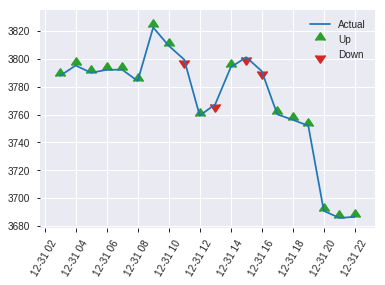


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.22033081809830396
RMSE: 0.4693940967868087
LogLoss: 0.62682785619207
Mean Per-Class Error: 0.3421335004833894
AUC: 0.7128666588757742
pr_auc: 0.6503424475087254
Gini: 0.4257333177515483
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.29845060252848715: 


,0,1,Error,Rate
0,177.0,296.0,0.6258,(296.0/473.0)
1,46.0,352.0,0.1156,(46.0/398.0)
Total,223.0,648.0,0.3927,(342.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2984506,0.6730402,267.0
max f2,0.1876531,0.8241525,328.0
max f0point5,0.4488284,0.6339581,148.0
max accuracy,0.4488284,0.6647532,148.0
max precision,0.8258336,1.0,0.0
max recall,0.0948386,1.0,375.0
max specificity,0.8258336,1.0,0.0
max absolute_mcc,0.4488284,0.3202176,148.0
max min_per_class_accuracy,0.4266112,0.6482412,170.0
max mean_per_class_accuracy,0.4488284,0.6578665,148.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 39.11 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.7437282,1.7021217,1.7021217,0.7777778,0.7755509,0.7777778,0.7755509,0.0175879,0.0175879,70.2121720,70.2121720
,2,0.0206659,0.6971768,1.4589615,1.5805416,0.6666667,0.7208852,0.7222222,0.7482180,0.0150754,0.0326633,45.8961474,58.0541597
,3,0.0309989,0.6620049,1.9452820,1.7021217,0.8888889,0.6788438,0.7777778,0.7250933,0.0201005,0.0527638,94.5281965,70.2121720
,4,0.0401837,0.6250506,1.6413317,1.6882268,0.75,0.6397182,0.7714286,0.7055790,0.0150754,0.0678392,64.1331658,68.8226849
,5,0.0505166,0.6058943,1.7021217,1.6910690,0.7777778,0.6143244,0.7727273,0.6869133,0.0175879,0.0854271,70.2121720,69.1068981
,6,0.1010333,0.5427946,1.5418570,1.6164630,0.7045455,0.5725185,0.7386364,0.6297159,0.0778894,0.1633166,54.1857012,61.6462997
,7,0.1504018,0.5168781,1.6795022,1.6371552,0.7674419,0.5285812,0.7480916,0.5965190,0.0829146,0.2462312,67.9502162,63.7155242
,8,0.2009185,0.4961436,1.4423824,1.5881838,0.6590909,0.5039998,0.7257143,0.5732571,0.0728643,0.3190955,44.2382366,58.8183776
,9,0.3008037,0.4783432,1.2074164,1.4617458,0.5517241,0.4856145,0.6679389,0.5441544,0.1206030,0.4396985,20.7416392,46.1745752
,10,0.4006889,0.4494625,1.2828799,1.4171574,0.5862069,0.4638001,0.6475645,0.5241234,0.1281407,0.5678392,28.2879917,41.7157420


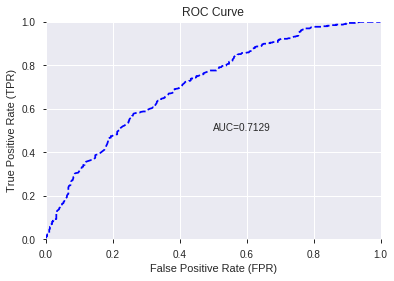

This function is available for GLM models only


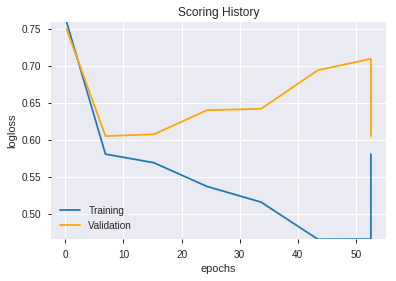

--2019-07-25 07:03:18--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.147.67
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.147.67|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


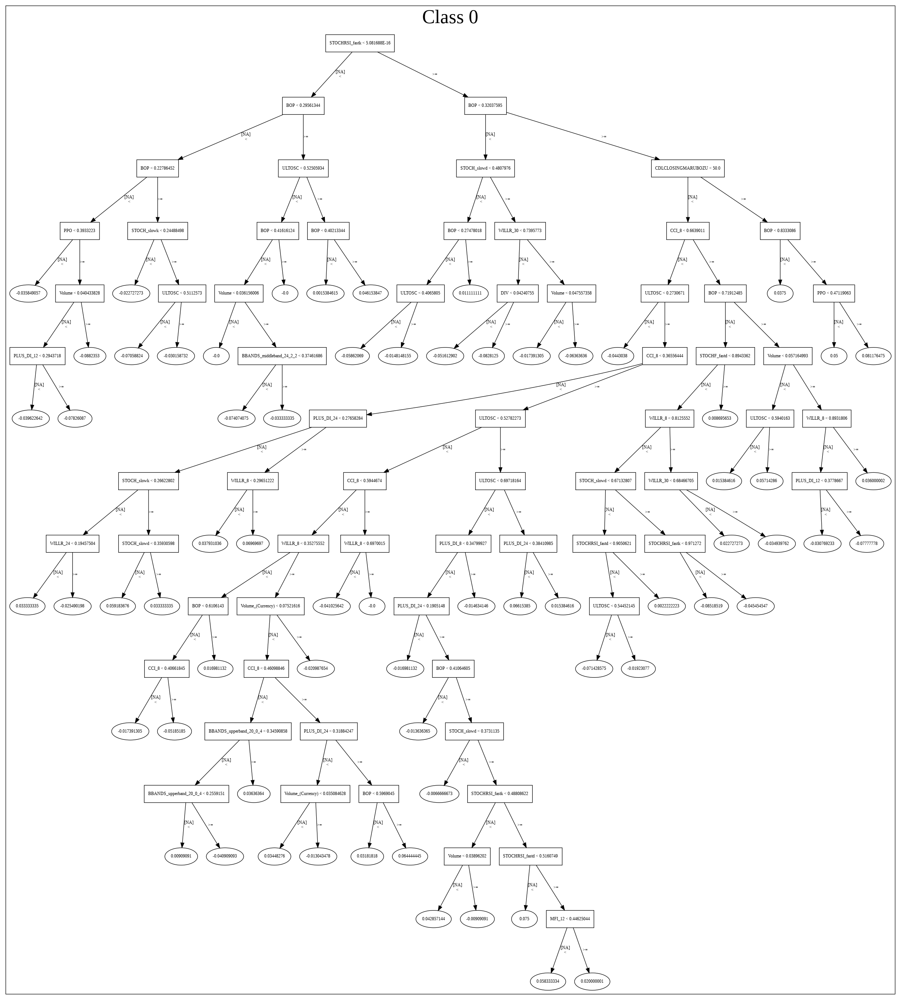

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190725_063612_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190725_063612_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_98_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'ULTOSC',
 'DIV',
 'CDLLONGLINE',
 'TRANGE',
 'CDLHIKKAKE',
 'SUB',
 'CDLTAKURI',
 'STOCHF_fastk',
 'CCI_8',
 'STOCHRSI_fastk',
 'hour',
 'COS',
 'SIN',
 'LINEARREG_ANGLE_8',
 'Volume',
 'STOCHRSI_fastd',
 'aroonup_20',
 'day',
 'aroonup_24',
 'days_in_month',
 'STOCH_slowd',
 'STOCH_slowk',
 'CDLSPINNINGTOP',
 'weekday_name',
 'AD',
 'HT_PHASOR_quadrature',
 'WILLR_8',
 'STDDEV_30',
 'CDLSHORTLINE',
 'ADOSC',
 'PLUS_DI_8',
 'STOCHF_fastd',
 'aroonup_14',
 'BETA_30',
 'aroondown_8',
 'aroondown_20',
 'aroonup_12',
 'DX_14',
 'aroonup_8',
 'CDLBELTHOLD',
 'MACDEXT_hist',
 'CCI_12',
 'CORREL_30',
 'ADXR_14',
 'BETA_20',
 'aroondown_14',
 'CCI_14',
 'aroondown_12',
 'BETA_12',
 'AROONOSC_24',
 'dayofyear',
 'aroondown_30',
 'aroondown_24',
 'CORREL_8',
 'MACDFIX_hist_14',
 'AROONOSC_30',
 'MACDFIX_hist_12',
 'CORREL_24',
 'PLUS_DI_12',
 'LINEARREG_ANGLE_20',
 'NATR_30',
 'weekofyear',
 'MFI_12',
 'BBANDS_middleband_20_1_4',
 'CDLHIGHWAVE',
 'LINEARREG_ANGLE

In [0]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190725_070417_model_1,0.728436,0.613036,0.368096,0.461713,0.213179


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.571133,1.000000,0.052134
1,DIV,0.556432,0.974260,0.050792
2,CCI_8,0.539980,0.945454,0.049290
3,ULTOSC,0.412578,0.722385,0.037661
4,STOCHF_fastk,0.334065,0.584915,0.030494
5,LINEARREG_ANGLE_8,0.322572,0.564793,0.029445
6,TRIX_12,0.286536,0.501697,0.026155
7,RSI_8,0.285265,0.499471,0.026039
8,PLUS_DI_8,0.273933,0.479631,0.025005
9,STOCHF_fastd,0.195723,0.342693,0.017866


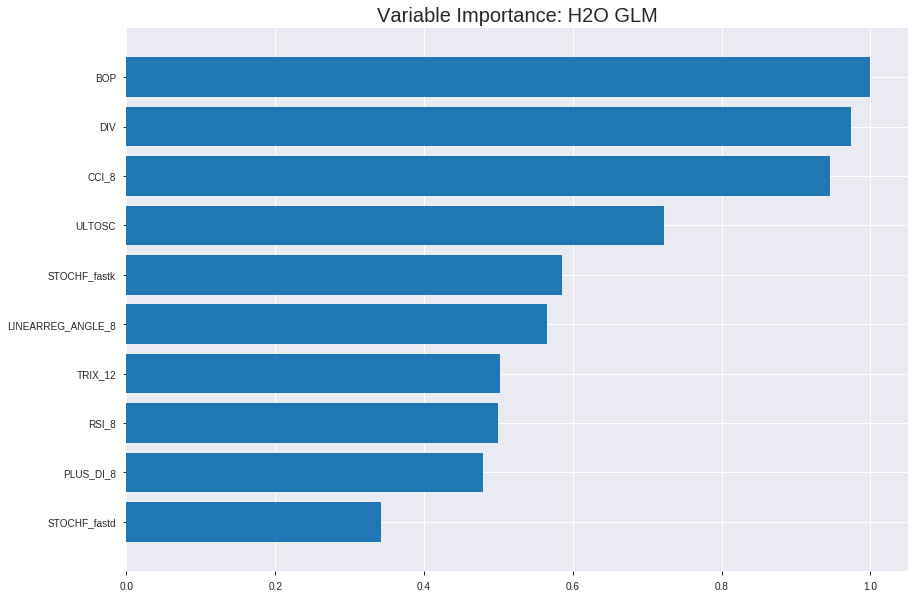

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190725_070417_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19615197075875077
RMSE: 0.4428904726439154
LogLoss: 0.573514170166558
Null degrees of freedom: 6094
Residual degrees of freedom: 5959
Null deviance: 8380.226957690009
Residual deviance: 6991.137734330342
AIC: 7263.137734330342
AUC: 0.7638208569067418
pr_auc: 0.7016984425716053
Gini: 0.5276417138134837
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36429578987887185: 


,0,1,Error,Rate
0,1822.0,1550.0,0.4597,(1550.0/3372.0)
1,424.0,2299.0,0.1557,(424.0/2723.0)
Total,2246.0,3849.0,0.3239,(1974.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3642958,0.6996348,248.0
max f2,0.1853966,0.8213158,330.0
max f0point5,0.4866287,0.6547038,186.0
max accuracy,0.4519081,0.6918786,203.0
max precision,0.9269967,0.9545455,6.0
max recall,0.0134506,1.0,396.0
max specificity,0.9680053,0.9997034,0.0
max absolute_mcc,0.3788725,0.3974337,240.0
max min_per_class_accuracy,0.4572529,0.6896805,200.0
max mean_per_class_accuracy,0.4053863,0.6971487,227.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 44.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.9033279,2.0915637,2.0915637,0.9344262,0.9221366,0.9344262,0.9221366,0.0209328,0.0209328,109.1563668,109.1563668
,2,0.0200164,0.8763723,1.8713991,1.9814814,0.8360656,0.8887513,0.8852459,0.9054439,0.0187293,0.0396621,87.1399072,98.1481370
,3,0.0300246,0.8531083,1.8347050,1.9325559,0.8196721,0.8647996,0.8633880,0.8918958,0.0183621,0.0580242,83.4704972,93.2555904
,4,0.0400328,0.8331346,1.7246227,1.8805726,0.7704918,0.8432307,0.8401639,0.8797296,0.0172604,0.0752846,72.4622674,88.0572597
,5,0.0500410,0.8188352,1.6145404,1.8273662,0.7213115,0.8267096,0.8163934,0.8691256,0.0161586,0.0914433,61.4540376,82.7366152
,6,0.1000820,0.7454432,1.8567214,1.8420438,0.8295082,0.7791136,0.8229508,0.8241196,0.0929122,0.1843555,85.6721432,84.2043792
,7,0.1501231,0.6915847,1.5925239,1.7588705,0.7114754,0.7162762,0.7857923,0.7881718,0.0796915,0.2640470,59.2523916,75.8870500
,8,0.2,0.6480696,1.5241329,1.7003305,0.6809211,0.6688933,0.7596390,0.7584255,0.0760191,0.3400661,52.4132874,70.0330518
,9,0.3000820,0.5749235,1.3209876,1.5738137,0.5901639,0.6091698,0.7031165,0.7086464,0.1322071,0.4722732,32.0987580,57.3813737
,10,0.4,0.5036811,1.2386217,1.4900845,0.5533662,0.5402104,0.6657096,0.6665719,0.1237606,0.5960338,23.8621679,49.0084466




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.20295248836013255
RMSE: 0.45050248429962353
LogLoss: 0.5937094021526784
Null degrees of freedom: 1741
Residual degrees of freedom: 1606
Null deviance: 2383.4834095378615
Residual deviance: 2068.4835570999317
AIC: 2340.4835570999317
AUC: 0.7420237530584851
pr_auc: 0.6843873426917425
Gini: 0.4840475061169702
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34893061511320633: 


,0,1,Error,Rate
0,484.0,507.0,0.5116,(507.0/991.0)
1,134.0,617.0,0.1784,(134.0/751.0)
Total,618.0,1124.0,0.368,(641.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3489306,0.6581333,253.0
max f2,0.1914063,0.7960585,331.0
max f0point5,0.5437278,0.6565340,155.0
max accuracy,0.5437278,0.6997704,155.0
max precision,0.9455326,1.0,0.0
max recall,0.0184457,1.0,395.0
max specificity,0.9455326,1.0,0.0
max absolute_mcc,0.5418408,0.3791769,156.0
max min_per_class_accuracy,0.4566131,0.6804261,197.0
max mean_per_class_accuracy,0.4810427,0.6875038,185.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 44.91 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.9010977,2.1907087,2.1907087,0.9444444,0.9210694,0.9444444,0.9210694,0.0226365,0.0226365,119.0708685,119.0708685
,2,0.0200918,0.8902766,1.7737918,1.9882062,0.7647059,0.8960433,0.8571429,0.9089138,0.0173103,0.0399467,77.3791807,98.8206201
,3,0.0304248,0.8680900,2.1907087,2.0569806,0.9444444,0.8798856,0.8867925,0.8990552,0.0226365,0.0625832,119.0708685,105.6980630
,4,0.0401837,0.8466951,1.7737918,1.9882062,0.7647059,0.8562949,0.8571429,0.8886705,0.0173103,0.0798935,77.3791807,98.8206201
,5,0.0505166,0.8360325,1.5463826,1.8978332,0.6666667,0.8405664,0.8181818,0.8788311,0.0159787,0.0958722,54.6382601,89.7833192
,6,0.1004592,0.7686548,1.9196474,1.9086780,0.8275862,0.7994062,0.8228571,0.8393456,0.0958722,0.1917443,91.9647367,90.8677953
,7,0.1504018,0.7027640,1.5997061,1.8060804,0.6896552,0.7359721,0.7786260,0.8050193,0.0798935,0.2716378,59.9706139,80.6080442
,8,0.2003444,0.6486371,1.6263679,1.7612810,0.7011494,0.6740499,0.7593123,0.7723708,0.0812250,0.3528628,62.6367908,76.1281043
,9,0.3002296,0.5747415,1.3464193,1.6232582,0.5804598,0.6104824,0.6998088,0.7185112,0.1344874,0.4873502,34.6419334,62.3258218
,10,0.4001148,0.5029906,1.2131105,1.5208684,0.5229885,0.5412629,0.6556671,0.6742627,0.1211718,0.6085220,21.3110489,52.0868397



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-07-25 07:04:17,0.000 sec,2,.16E2,135,1.3590143,1.3549784
,2019-07-25 07:04:18,0.150 sec,4,.1E2,136,1.3517688,1.3483751
,2019-07-25 07:04:18,0.286 sec,6,.63E1,136,1.3418100,1.3390310
,2019-07-25 07:04:18,0.422 sec,8,.39E1,136,1.3285258,1.3263633
,2019-07-25 07:04:18,0.560 sec,10,.24E1,136,1.3116346,1.3102085
---,---,---,---,---,---,---,---
,2019-07-25 07:04:20,2.931 sec,40,.19E-2,136,1.1456339,1.1875133
,2019-07-25 07:04:21,3.088 sec,42,.12E-2,136,1.1446110,1.1878209
,2019-07-25 07:04:21,3.235 sec,44,.74E-3,136,1.1438060,1.1881987
,2019-07-25 07:04:21,3.383 sec,46,.46E-3,136,1.1432170,1.1886545



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6796785304247991)

('F1', 0.6809701492537313)

('auc', 0.728436049167614)

('logloss', 0.6130364219710573)

('mean_per_class_error', 0.3287898265109904)

('rmse', 0.4617133693912537)

('mse', 0.21317923547462428)

glm prediction progress: |████████████████████████████████████████████████| 100%


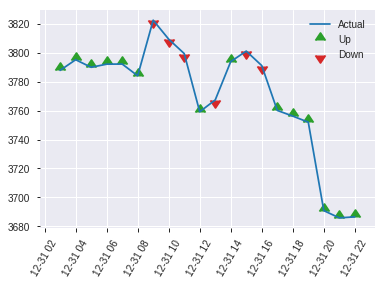


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.21317923547462428
RMSE: 0.4617133693912537
LogLoss: 0.6130364219710573
Null degrees of freedom: 870
Residual degrees of freedom: 735
Null deviance: 1201.3614369590905
Residual deviance: 1067.9094470735822
AIC: 1339.9094470735822
AUC: 0.728436049167614
pr_auc: 0.6715048834636009
Gini: 0.4568720983352279
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.22520854770046778: 


,0,1,Error,Rate
0,164.0,309.0,0.6533,(309.0/473.0)
1,33.0,365.0,0.0829,(33.0/398.0)
Total,197.0,674.0,0.3927,(342.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2252085,0.6809701,301.0
max f2,0.1432512,0.8241525,342.0
max f0point5,0.4587898,0.6529210,170.0
max accuracy,0.4587898,0.6796785,170.0
max precision,0.9497431,1.0,0.0
max recall,0.0408408,1.0,387.0
max specificity,0.9497431,1.0,0.0
max absolute_mcc,0.4587898,0.3502242,170.0
max min_per_class_accuracy,0.3998469,0.6638478,205.0
max mean_per_class_accuracy,0.4587898,0.6712102,170.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 39.98 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8809418,1.9452820,1.9452820,0.8888889,0.9016442,0.8888889,0.9016442,0.0201005,0.0201005,94.5281965,94.5281965
,2,0.0206659,0.8469081,1.9452820,1.9452820,0.8888889,0.8612601,0.8888889,0.8814521,0.0201005,0.0402010,94.5281965,94.5281965
,3,0.0309989,0.8142055,1.2158012,1.7021217,0.5555556,0.8316648,0.7777778,0.8648564,0.0125628,0.0527638,21.5801228,70.2121720
,4,0.0401837,0.8031068,1.9148869,1.7507538,0.875,0.8088516,0.8,0.8520553,0.0175879,0.0703518,91.4886935,75.0753769
,5,0.0505166,0.7772086,1.2158012,1.6413317,0.5555556,0.7874709,0.75,0.8388448,0.0125628,0.0829146,21.5801228,64.1331658
,6,0.1010333,0.6807791,1.6413317,1.6413317,0.75,0.7260739,0.75,0.7824594,0.0829146,0.1658291,64.1331658,64.1331658
,7,0.1504018,0.6208681,1.5777142,1.6204496,0.7209302,0.6498022,0.7404580,0.7389154,0.0778894,0.2437186,57.7714152,62.0449576
,8,0.2009185,0.5790045,1.7408063,1.6507107,0.7954545,0.6008450,0.7542857,0.7042006,0.0879397,0.3316583,74.0806304,65.0710696
,9,0.3008037,0.5081322,1.2577254,1.5202156,0.5747126,0.5437964,0.6946565,0.6509366,0.1256281,0.4572864,25.7725409,52.0215582
,10,0.4006889,0.4484266,1.2074164,1.4422399,0.5517241,0.4806381,0.6590258,0.6084840,0.1206030,0.5778894,20.7416392,44.2239853


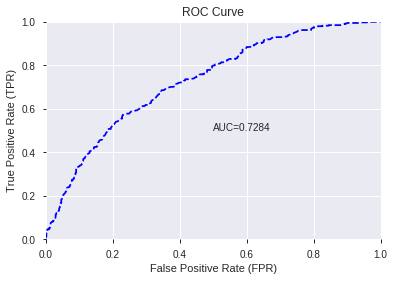

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


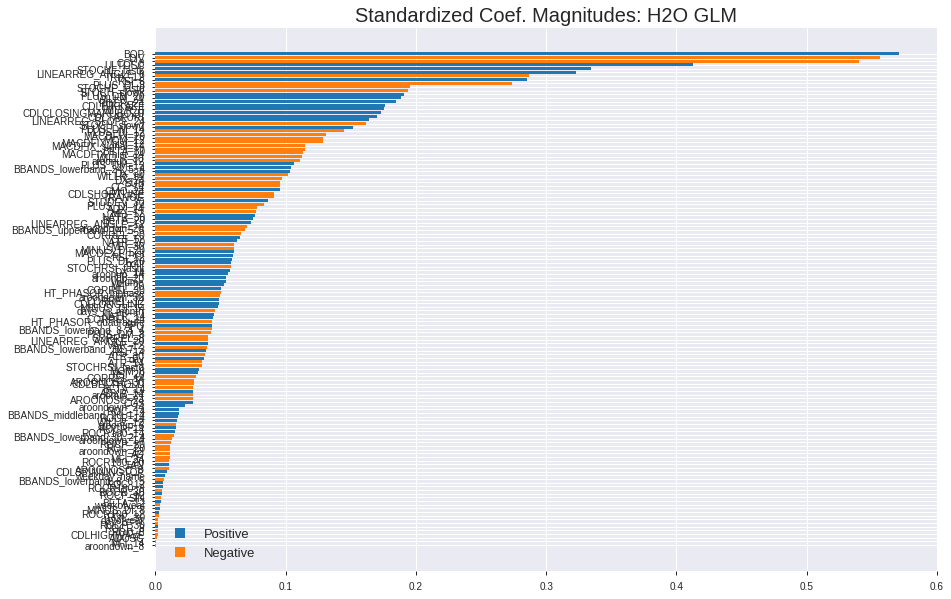

'log_likelihood'
--2019-07-25 07:04:32--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.207.195
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.207.195|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


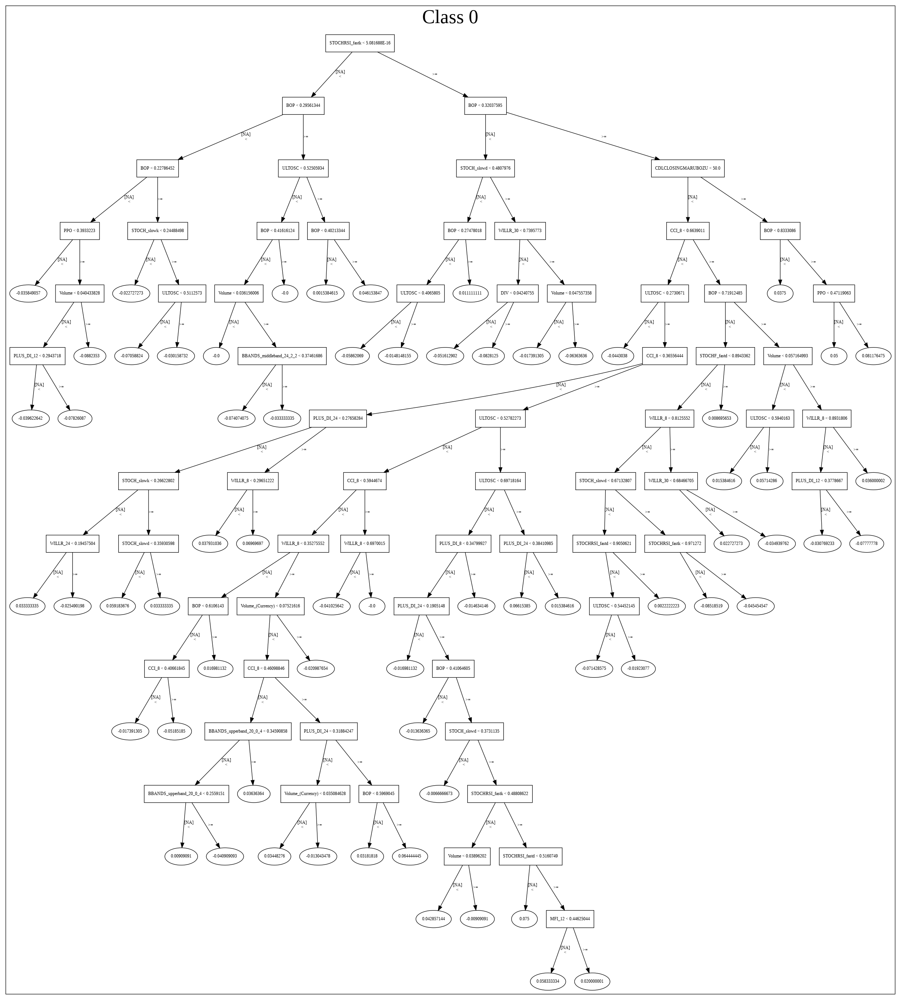

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190725_070417_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190725_070417_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_106_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_106

['BOP',
 'DIV',
 'CCI_8',
 'ULTOSC',
 'STOCHF_fastk',
 'LINEARREG_ANGLE_8',
 'TRIX_12',
 'RSI_8',
 'PLUS_DI_8',
 'STOCHF_fastd',
 'STOCH_slowk',
 'PLUS_DM_20',
 'WILLR_24',
 'ROCR_24',
 'CDLHIKKAKE',
 'WILLR_8',
 'CDLCLOSINGMARUBOZU',
 'CDLTAKURI',
 'LINEARREG_SLOPE_24',
 'STOCH_slowd',
 'PLUS_DM_14',
 'PLUS_DI_12',
 'MACDFIX_20',
 'MOM_12',
 'MACDFIX_hist_12',
 'MACDFIX_signal_14',
 'BETA_30',
 'MACDFIX_hist_14',
 'WILLR_30',
 'aroonup_12',
 'PLUS_DM_12',
 'BBANDS_lowerband_24_5_4',
 'DX_30',
 'WILLR_14',
 'DX_24',
 'SUB',
 'CCI_14',
 'CMO_24',
 'CDLSHORTLINE',
 'TRANGE',
 'STDDEV_30',
 'PLUS_DI_14',
 'ADX_14',
 'MFI_12',
 'NATR_30',
 'BETA_20',
 'LINEARREG_ANGLE_12',
 'aroondown_20',
 'BBANDS_upperband_14_5_5',
 'CORREL_20',
 'CCI_12',
 'NATR_20',
 'MFI_30',
 'MINUS_DI_20',
 'MACDEXT_hist',
 'RSI_12',
 'PLUS_DI_20',
 'hour',
 'STOCHRSI_fastk',
 'DX_14',
 'aroonup_14',
 'aroonup_20',
 'Volume',
 'MFI_20',
 'CORREL_30',
 'HT_PHASOR_inphase',
 'aroondown_30',
 'CORREL_12',
 'CDLLONGLINE

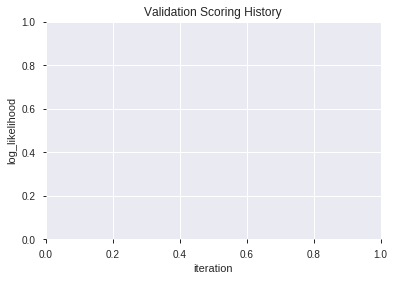

In [52]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190725_070530_model_2,0.749556,0.595083,0.333672,0.453066,0.205269
1,XGBoost_2_AutoML_20190725_070530,0.744138,0.594514,0.321998,0.452897,0.205116
2,XGBoost_grid_1_AutoML_20190725_070530_model_7,0.742027,0.596928,0.335127,0.454024,0.206138
3,XGBoost_3_AutoML_20190725_070530,0.741145,0.598297,0.329719,0.454942,0.206972
4,XGBoost_grid_1_AutoML_20190725_070530_model_6,0.740571,0.597192,0.316315,0.454772,0.206818
5,XGBoost_1_AutoML_20190725_070530,0.738136,0.602369,0.327743,0.457002,0.208851
6,XGBoost_grid_1_AutoML_20190725_070530_model_3,0.737581,0.606652,0.325109,0.458600,0.210314
7,XGBoost_grid_1_AutoML_20190725_070530_model_4,0.737530,0.601996,0.328004,0.456734,0.208606
8,XGBoost_grid_1_AutoML_20190725_070530_model_1,0.736521,0.597334,0.336123,0.455245,0.207248
9,XGBoost_grid_1_AutoML_20190725_070530_model_5,0.718853,0.612584,0.339310,0.462017,0.213460


,variable,relative_importance,scaled_importance,percentage
0,BOP,5844.947754,1.000000,0.273227
1,DIV,1033.057251,0.176744,0.048291
2,STOCHF_fastk,890.835815,0.152411,0.041643
3,CDLCLOSINGMARUBOZU,807.893799,0.138221,0.037766
4,ULTOSC,736.789795,0.126056,0.034442
5,CCI_8,625.316040,0.106984,0.029231
6,aroonup_8,560.424744,0.095882,0.026198
7,STOCHRSI_fastd,378.952301,0.064834,0.017714
8,TRANGE,344.142395,0.058879,0.016087
9,WILLR_8,314.561676,0.053818,0.014704


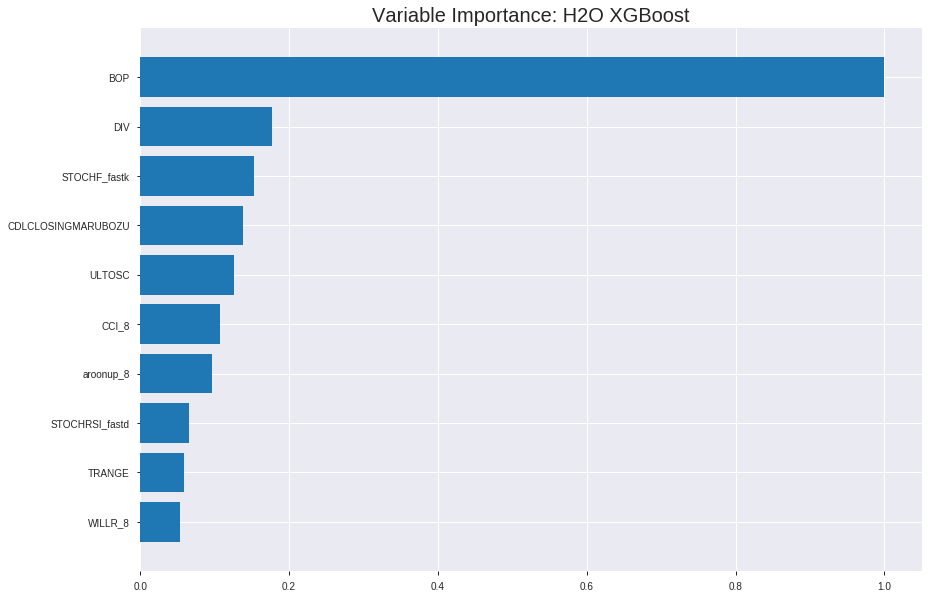

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190725_070530_model_2


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.16975431859772194
RMSE: 0.4120125223797475
LogLoss: 0.5140950731421975
Mean Per-Class Error: 0.23868754108601697
AUC: 0.8454247657035168
pr_auc: 0.81346026089938
Gini: 0.6908495314070335
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4474336536307084: 


,0,1,Error,Rate
0,2333.0,1039.0,0.3081,(1039.0/3372.0)
1,478.0,2245.0,0.1755,(478.0/2723.0)
Total,2811.0,3284.0,0.2489,(1517.0/6095.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4474337,0.7474613,210.0
max f2,0.2482242,0.8465356,311.0
max f0point5,0.5435086,0.7471264,153.0
max accuracy,0.5087933,0.7625923,175.0
max precision,0.9120317,1.0,0.0
max recall,0.1241868,1.0,372.0
max specificity,0.9120317,1.0,0.0
max absolute_mcc,0.4669185,0.5196780,200.0
max min_per_class_accuracy,0.4860147,0.7603796,189.0
max mean_per_class_accuracy,0.4669185,0.7613125,200.0


Gains/Lift Table: Avg response rate: 44.68 %, avg score: 44.78 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100082,0.8653306,2.2383401,2.2383401,1.0,0.8816364,1.0,0.8816364,0.0224018,0.0224018,123.8340066,123.8340066
,2,0.0200164,0.8414924,2.2383401,2.2383401,1.0,0.8526627,1.0,0.8671496,0.0224018,0.0448035,123.8340066,123.8340066
,3,0.0300246,0.8057869,2.0915637,2.1894146,0.9344262,0.8242823,0.9781421,0.8528605,0.0209328,0.0657363,109.1563668,118.9414600
,4,0.0400328,0.7789028,2.1282578,2.1741254,0.9508197,0.7927464,0.9713115,0.8378320,0.0213000,0.0870364,112.8257768,117.4125392
,5,0.0500410,0.7558071,2.0915637,2.1576130,0.9344262,0.7663325,0.9639344,0.8235321,0.0209328,0.1079692,109.1563668,115.7613047
,6,0.1000820,0.6946420,2.0328531,2.0952331,0.9081967,0.7227491,0.9360656,0.7731406,0.1017260,0.2096952,103.2853109,109.5233078
,7,0.1501231,0.6567104,1.8787379,2.0230680,0.8393443,0.6733913,0.9038251,0.7398908,0.0940140,0.3037091,87.8737892,102.3068016
,8,0.2,0.6269875,1.6934810,1.9408740,0.7565789,0.6409045,0.8671042,0.7152052,0.0844657,0.3881748,69.3480971,94.0874036
,9,0.3000820,0.5747017,1.5484910,1.8100082,0.6918033,0.6001029,0.8086386,0.6768168,0.1549761,0.5431509,54.8490997,81.0008178
,10,0.4,0.5225805,1.3452093,1.6939038,0.6009852,0.5492049,0.7567678,0.6449400,0.1344106,0.6775615,34.5209301,69.3903783




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.20596125432463938
RMSE: 0.4538295432479461
LogLoss: 0.598938970645111
Mean Per-Class Error: 0.31216904201730356
AUC: 0.7475407831602935
pr_auc: 0.6781833222171295
Gini: 0.495081566320587
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45512981414794923: 


,0,1,Error,Rate
0,566.0,425.0,0.4289,(425.0/991.0)
1,148.0,603.0,0.1971,(148.0/751.0)
Total,714.0,1028.0,0.3289,(573.0/1742.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4551298,0.6779089,218.0
max f2,0.2269958,0.8028322,343.0
max f0point5,0.5674222,0.6505521,149.0
max accuracy,0.5674222,0.6963261,149.0
max precision,0.8955970,1.0,0.0
max recall,0.0726453,1.0,398.0
max specificity,0.8955970,1.0,0.0
max absolute_mcc,0.4551298,0.3766723,218.0
max min_per_class_accuracy,0.5208865,0.6817577,179.0
max mean_per_class_accuracy,0.4873967,0.6878310,199.0


Gains/Lift Table: Avg response rate: 43.11 %, avg score: 48.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.8395844,2.0618435,2.0618435,0.8888889,0.8557478,0.8888889,0.8557478,0.0213049,0.0213049,106.1843468,106.1843468
,2,0.0200918,0.8219385,2.0466829,2.0544797,0.8823529,0.8305324,0.8857143,0.8435003,0.0199734,0.0412783,104.6682854,105.4479741
,3,0.0304248,0.7977639,1.5463826,1.8819184,0.6666667,0.8120554,0.8113208,0.8328209,0.0159787,0.0572570,54.6382601,88.1918448
,4,0.0401837,0.7793226,2.0466829,1.9219327,0.8823529,0.7891522,0.8285714,0.8222156,0.0199734,0.0772304,104.6682854,92.1932661
,5,0.0505166,0.7631942,2.0618435,1.9505508,0.8888889,0.7714511,0.8409091,0.8118320,0.0213049,0.0985353,106.1843468,95.0550781
,6,0.1004592,0.7141737,1.7063532,1.8291497,0.7356322,0.7344366,0.7885714,0.7733554,0.0852197,0.1837550,70.6353215,82.9149705
,7,0.1504018,0.6759096,1.7863385,1.8149338,0.7701149,0.6940981,0.7824427,0.7470371,0.0892144,0.2729694,78.6338522,81.4933778
,8,0.2003444,0.6478588,1.3864120,1.7081103,0.5977011,0.6632020,0.7363897,0.7261384,0.0692410,0.3422104,38.6411987,70.8110294
,9,0.3002296,0.6018490,1.3864120,1.6010826,0.5977011,0.6235620,0.6902486,0.6920116,0.1384820,0.4806924,38.6411987,60.1082559
,10,0.4001148,0.5510770,1.2797649,1.5208684,0.5517241,0.5782013,0.6556671,0.6635999,0.1278296,0.6085220,27.9764911,52.0868397



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-07-25 07:05:46,2.183 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5532404,0.5,0.6931472,0.5,0.0,1.0,0.5688863
,2019-07-25 07:05:46,2.444 sec,5.0,0.4822829,0.6581693,0.7647415,0.6640160,1.9846615,0.3314192,0.4875158,0.6683998,0.7252207,0.6401887,1.6752478,0.3358209
,2019-07-25 07:05:47,2.554 sec,10.0,0.4690789,0.6322698,0.7703048,0.6789436,2.0260837,0.3240361,0.4792640,0.6521179,0.7287492,0.6477875,1.6752478,0.3507463
,2019-07-25 07:05:47,2.668 sec,15.0,0.4594637,0.6131709,0.7799932,0.7064241,2.1085812,0.3204266,0.4720418,0.6377910,0.7334734,0.6564013,1.6752478,0.3461538
,2019-07-25 07:05:47,2.789 sec,20.0,0.4518928,0.5977593,0.7859764,0.7333869,2.2016460,0.3159967,0.4676547,0.6288593,0.7348251,0.6610411,1.8041130,0.3478760
,2019-07-25 07:05:47,2.914 sec,25.0,0.4467789,0.5870527,0.7907752,0.7421237,2.1282578,0.3143560,0.4641069,0.6215433,0.7389367,0.6681816,1.8041130,0.3421355
,2019-07-25 07:05:47,3.058 sec,30.0,0.4418741,0.5767210,0.7970358,0.7532520,2.2016460,0.3135357,0.4612398,0.6155535,0.7408991,0.6711861,1.8041130,0.3340987
,2019-07-25 07:05:47,3.188 sec,35.0,0.4377774,0.5678655,0.8011511,0.7574541,2.2016460,0.3036916,0.4589335,0.6106673,0.7421265,0.6717696,1.8041130,0.3340987
,2019-07-25 07:05:47,3.325 sec,40.0,0.4339605,0.5596166,0.8066468,0.7630212,2.2383401,0.3023790,0.4577030,0.6079340,0.7429979,0.6728516,1.8041130,0.3404133
,2019-07-25 07:05:47,3.461 sec,45.0,0.4303998,0.5519606,0.8123763,0.7707543,2.2383401,0.3056604,0.4567247,0.6057333,0.7437362,0.6724723,1.8041130,0.3392652


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,5844.9477539,1.0,0.2732274
DIV,1033.0572510,0.1767436,0.0482912
STOCHF_fastk,890.8358154,0.1524113,0.0416429
CDLCLOSINGMARUBOZU,807.8937988,0.1382209,0.0377657
ULTOSC,736.7897949,0.1260558,0.0344419
---,---,---,---
AROONOSC_8,10.3102608,0.0017640,0.0004820
days_in_month,10.0009480,0.0017110,0.0004675
CDLHIGHWAVE,9.6999922,0.0016596,0.0004534
LINEARREG_SLOPE_24,5.9905891,0.0010249,0.0002800



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6831228473019518)

('F1', 0.7036328871892926)

('auc', 0.7495564503277488)

('logloss', 0.5950826310659497)

('mean_per_class_error', 0.3151513380857778)

('rmse', 0.4530659286031297)

('mse', 0.20526873566101625)

xgboost prediction progress: |████████████████████████████████████████████| 100%


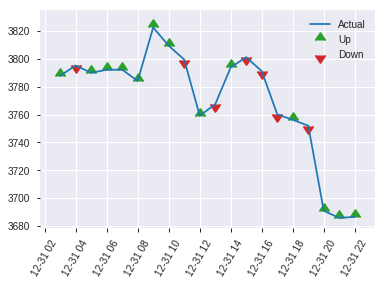


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.20526873566101625
RMSE: 0.4530659286031297
LogLoss: 0.5950826310659497
Mean Per-Class Error: 0.3151513380857778
AUC: 0.7495564503277488
pr_auc: 0.6808229647908847
Gini: 0.4991129006554975
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2721869846185048: 


,0,1,Error,Rate
0,193.0,280.0,0.592,(280.0/473.0)
1,30.0,368.0,0.0754,(30.0/398.0)
Total,223.0,648.0,0.3559,(310.0/871.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2721870,0.7036329,295.0
max f2,0.2212040,0.8293737,327.0
max f0point5,0.4951281,0.6583630,155.0
max accuracy,0.4951281,0.6831228,155.0
max precision,0.8361169,1.0,0.0
max recall,0.1390906,1.0,373.0
max specificity,0.8361169,1.0,0.0
max absolute_mcc,0.2828503,0.3800135,288.0
max min_per_class_accuracy,0.4425708,0.6758794,191.0
max mean_per_class_accuracy,0.3603723,0.6848487,240.0


Gains/Lift Table: Avg response rate: 45.69 %, avg score: 41.84 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103330,0.7905032,1.4589615,1.4589615,0.6666667,0.8142250,0.6666667,0.8142250,0.0150754,0.0150754,45.8961474,45.8961474
,2,0.0206659,0.7495209,1.7021217,1.5805416,0.7777778,0.7688148,0.7222222,0.7915199,0.0175879,0.0326633,70.2121720,58.0541597
,3,0.0309989,0.7204879,1.7021217,1.6210683,0.7777778,0.7291412,0.7407407,0.7707270,0.0175879,0.0502513,70.2121720,62.1068304
,4,0.0401837,0.7061922,1.9148869,1.6882268,0.875,0.7153942,0.7714286,0.7580795,0.0175879,0.0678392,91.4886935,68.8226849
,5,0.0505166,0.6854160,1.9452820,1.7408063,0.8888889,0.6954185,0.7954545,0.7452625,0.0201005,0.0879397,94.5281965,74.0806304
,6,0.1010333,0.6454697,1.7408063,1.7408063,0.7954545,0.6627481,0.7954545,0.7040053,0.0879397,0.1758794,74.0806304,74.0806304
,7,0.1504018,0.6128551,1.3232441,1.6037439,0.6046512,0.6260709,0.7328244,0.6784238,0.0653266,0.2412060,32.3244128,60.3743910
,8,0.2009185,0.5843454,1.5915943,1.6006892,0.7272727,0.5960353,0.7314286,0.6577090,0.0804020,0.3216080,59.1594335,60.0689160
,9,0.3008037,0.5270293,1.4086525,1.5369212,0.6436782,0.5567318,0.7022901,0.6241784,0.1407035,0.4623116,40.8652458,53.6921247
,10,0.4006889,0.4794848,1.2828799,1.4735929,0.5862069,0.5032416,0.6733524,0.5940308,0.1281407,0.5904523,28.2879917,47.3592893


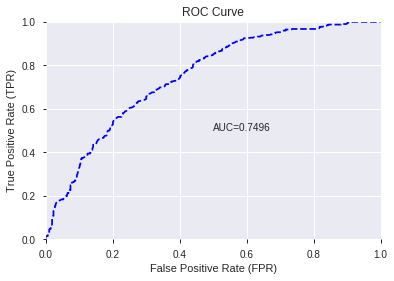

This function is available for GLM models only


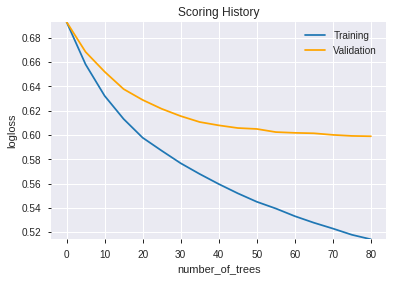

--2019-07-25 07:06:22--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 54.231.72.155
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|54.231.72.155|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

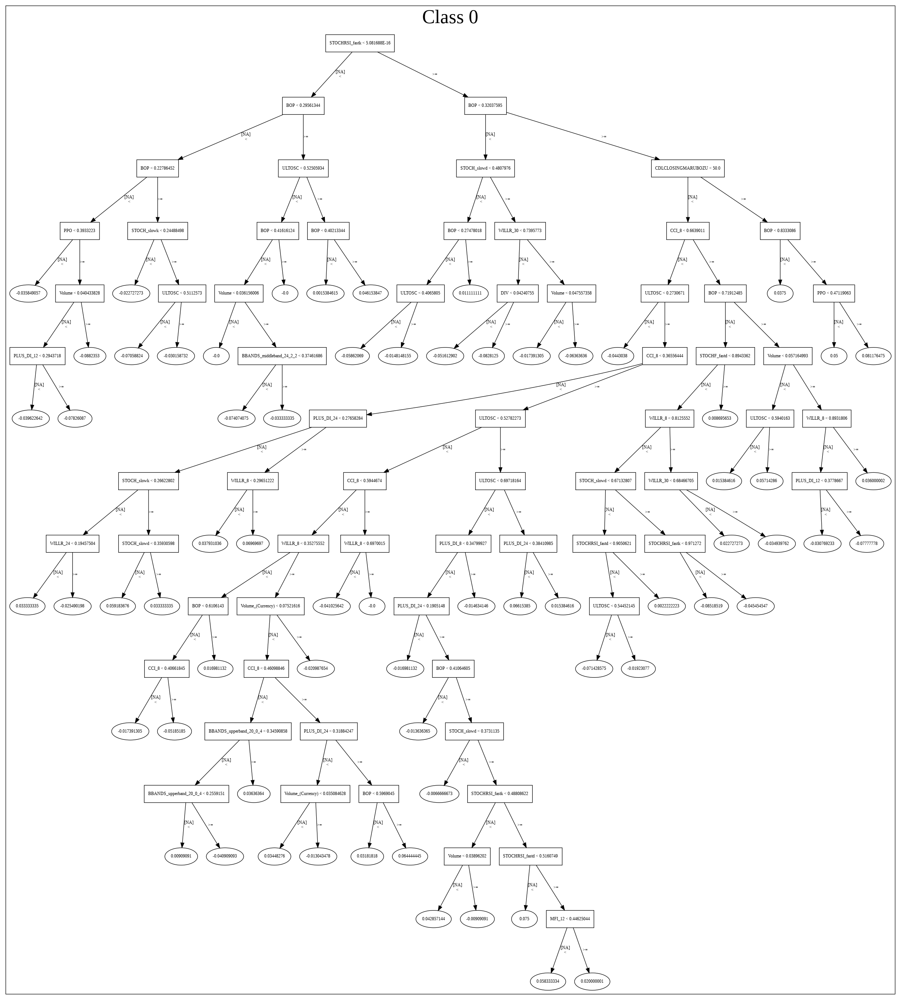

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190725_070530_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190725_070530_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_114_sid_8dc6',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['BOP',
 'DIV',
 'STOCHF_fastk',
 'CDLCLOSINGMARUBOZU',
 'ULTOSC',
 'CCI_8',
 'aroonup_8',
 'STOCHRSI_fastd',
 'TRANGE',
 'WILLR_8',
 'CDLHIKKAKE',
 'Volume',
 'STOCHRSI_fastk',
 'CDLSHORTLINE',
 'STDDEV_30',
 'CDLLONGLINE',
 'CDLTAKURI',
 'ATR_30',
 'NATR_30',
 'STOCH_slowd',
 'COS',
 'STOCH_slowk',
 'hour',
 'dayofyear',
 'TAN',
 'NATR_20',
 'MACDEXT_hist',
 'HT_PHASOR_quadrature',
 'SIN',
 'MFI_12',
 'BETA_30',
 'LINEARREG_ANGLE_12',
 'day',
 'CORREL_8',
 'MACDFIX_signal_14',
 'ROC_20',
 'BETA_12',
 'CCI_14',
 'CORREL_14',
 'BETA_20',
 'LINEARREG_ANGLE_8',
 'ADXR_14',
 'NATR_14',
 'ATR_14',
 'MACDFIX_hist_12',
 'CCI_12',
 'ADOSC',
 'HT_PHASOR_inphase',
 'PLUS_DI_8',
 'SUB',
 'CDLSPINNINGTOP',
 'AD',
 'BBANDS_middleband_20_1_4',
 'WILLR_12',
 'WILLR_24',
 'aroonup_24',
 'MFI_14',
 'WILLR_14',
 'BBANDS_lowerband_24_5_4',
 'MFI_30',
 'MFI_20',
 'BBANDS_lowerband_8_4_4',
 'CORREL_30',
 'RSI_8',
 'ROCR_24',
 'VAR_12',
 'PLUS_DM_8',
 'BETA_14',
 'MACDFIX_hist_14',
 'CORREL_20',
 'MFI_24',

In [53]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [0]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


DeepLearning    0.668
GLM             0.680
XGBoost         0.692
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.651,0.665,0.692
DLF,0.668,0.662,0.690
Fwe,0.656,0.673,0.688
RFE,0.665,0.680,0.683
XGBF,0.660,0.662,0.690






F1


DeepLearning    0.688
GLM             0.689
XGBoost         0.704
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.688,0.689,0.704
DLF,0.685,0.686,0.696
Fwe,0.679,0.676,0.697
RFE,0.673,0.681,0.704
XGBF,0.679,0.686,0.696






auc


DeepLearning    0.721
GLM             0.728
XGBoost         0.750
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.713,0.726,0.747
DLF,0.721,0.719,0.744
Fwe,0.714,0.720,0.742
RFE,0.713,0.728,0.750
XGBF,0.713,0.719,0.744






logloss


DeepLearning    0.706
GLM             0.646
XGBoost         0.600
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.670,0.613,0.595
DLF,0.706,0.646,0.600
Fwe,0.635,0.617,0.598
RFE,0.627,0.613,0.595
XGBF,0.666,0.646,0.600






mean_per_class_error


DeepLearning    0.342
GLM             0.333
XGBoost         0.315
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.337,0.333,0.300
DLF,0.325,0.332,0.306
Fwe,0.339,0.327,0.306
RFE,0.342,0.329,0.315
XGBF,0.334,0.332,0.306






rmse


DeepLearning    0.485
GLM             0.478
XGBoost         0.455
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.484,0.463,0.453
DLF,0.472,0.478,0.455
Fwe,0.469,0.463,0.454
RFE,0.469,0.462,0.453
XGBF,0.485,0.478,0.455






mse


DeepLearning    0.235
GLM             0.229
XGBoost         0.207
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.234,0.214,0.205
DLF,0.223,0.229,0.207
Fwe,0.220,0.214,0.206
RFE,0.220,0.213,0.205
XGBF,0.235,0.229,0.207


{'F1':       DeepLearning    GLM  XGBoost
 All          0.688    NaN      NaN
 DLF          0.685    NaN      NaN
 DLF            NaN  0.686      NaN
 DLF            NaN    NaN    0.696
 All            NaN  0.689      NaN
 All            NaN    NaN    0.704
 XGBF         0.679    NaN      NaN
 XGBF           NaN  0.686      NaN
 XGBF           NaN    NaN    0.696
 Fwe          0.679    NaN      NaN
 Fwe            NaN  0.676      NaN
 Fwe            NaN    NaN    0.697
 RFE          0.673    NaN      NaN
 RFE            NaN  0.681      NaN
 RFE            NaN    NaN    0.704,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.651    NaN      NaN
 DLF          0.668    NaN      NaN
 DLF            NaN  0.662      NaN
 DLF            NaN    NaN    0.690
 All            NaN  0.665      NaN
 All            NaN    NaN    0.692
 XGBF         0.660    NaN      NaN
 XGBF           NaN  0.662      NaN
 XGBF           NaN    NaN    0.690
 Fwe          0.656    NaN      NaN
 Fwe     

accuracy


DeepLearning    0.668
GLM             0.680
XGBoost         0.692
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.651,0.665,0.692
DLF,0.668,0.662,0.690
Fwe,0.656,0.673,0.688
RFE,0.665,0.680,0.683
XGBF,0.660,0.662,0.690






F1


DeepLearning    0.688
GLM             0.689
XGBoost         0.704
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.688,0.689,0.704
DLF,0.685,0.686,0.696
Fwe,0.679,0.676,0.697
RFE,0.673,0.681,0.704
XGBF,0.679,0.686,0.696






auc


DeepLearning    0.721
GLM             0.728
XGBoost         0.750
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.713,0.726,0.747
DLF,0.721,0.719,0.744
Fwe,0.714,0.720,0.742
RFE,0.713,0.728,0.750
XGBF,0.713,0.719,0.744






logloss


DeepLearning    0.706
GLM             0.646
XGBoost         0.600
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.670,0.613,0.595
DLF,0.706,0.646,0.600
Fwe,0.635,0.617,0.598
RFE,0.627,0.613,0.595
XGBF,0.666,0.646,0.600






mean_per_class_error


DeepLearning    0.342
GLM             0.333
XGBoost         0.315
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.337,0.333,0.300
DLF,0.325,0.332,0.306
Fwe,0.339,0.327,0.306
RFE,0.342,0.329,0.315
XGBF,0.334,0.332,0.306






rmse


DeepLearning    0.485
GLM             0.478
XGBoost         0.455
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.484,0.463,0.453
DLF,0.472,0.478,0.455
Fwe,0.469,0.463,0.454
RFE,0.469,0.462,0.453
XGBF,0.485,0.478,0.455






mse


DeepLearning    0.235
GLM             0.229
XGBoost         0.207
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.234,0.214,0.205
DLF,0.223,0.229,0.207
Fwe,0.220,0.214,0.206
RFE,0.220,0.213,0.205
XGBF,0.235,0.229,0.207


{'F1':       DeepLearning    GLM  XGBoost
 All          0.688    NaN      NaN
 DLF          0.685    NaN      NaN
 DLF            NaN  0.686      NaN
 DLF            NaN    NaN    0.696
 All            NaN  0.689      NaN
 All            NaN    NaN    0.704
 XGBF         0.679    NaN      NaN
 XGBF           NaN  0.686      NaN
 XGBF           NaN    NaN    0.696
 Fwe          0.679    NaN      NaN
 Fwe            NaN  0.676      NaN
 Fwe            NaN    NaN    0.697
 RFE          0.673    NaN      NaN
 RFE            NaN  0.681      NaN
 RFE            NaN    NaN    0.704,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.651    NaN      NaN
 DLF          0.668    NaN      NaN
 DLF            NaN  0.662      NaN
 DLF            NaN    NaN    0.690
 All            NaN  0.665      NaN
 All            NaN    NaN    0.692
 XGBF         0.660    NaN      NaN
 XGBF           NaN  0.662      NaN
 XGBF           NaN    NaN    0.690
 Fwe          0.656    NaN      NaN
 Fwe     

accuracy


DeepLearning    0.668
GLM             0.680
XGBoost         0.692
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.651,0.665,0.692
DLF,0.668,0.662,0.690
Fwe,0.656,0.673,0.688
RFE,0.665,0.680,0.683
XGBF,0.660,0.662,0.690






F1


DeepLearning    0.688
GLM             0.689
XGBoost         0.704
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.688,0.689,0.704
DLF,0.685,0.686,0.696
Fwe,0.679,0.676,0.697
RFE,0.673,0.681,0.704
XGBF,0.679,0.686,0.696






auc


DeepLearning    0.721
GLM             0.728
XGBoost         0.750
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.713,0.726,0.747
DLF,0.721,0.719,0.744
Fwe,0.714,0.720,0.742
RFE,0.713,0.728,0.750
XGBF,0.713,0.719,0.744






logloss


DeepLearning    0.706
GLM             0.646
XGBoost         0.600
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.670,0.613,0.595
DLF,0.706,0.646,0.600
Fwe,0.635,0.617,0.598
RFE,0.627,0.613,0.595
XGBF,0.666,0.646,0.600






mean_per_class_error


DeepLearning    0.342
GLM             0.333
XGBoost         0.315
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.337,0.333,0.300
DLF,0.325,0.332,0.306
Fwe,0.339,0.327,0.306
RFE,0.342,0.329,0.315
XGBF,0.334,0.332,0.306






rmse


DeepLearning    0.485
GLM             0.478
XGBoost         0.455
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.484,0.463,0.453
DLF,0.472,0.478,0.455
Fwe,0.469,0.463,0.454
RFE,0.469,0.462,0.453
XGBF,0.485,0.478,0.455






mse


DeepLearning    0.235
GLM             0.229
XGBoost         0.207
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.234,0.214,0.205
DLF,0.223,0.229,0.207
Fwe,0.220,0.214,0.206
RFE,0.220,0.213,0.205
XGBF,0.235,0.229,0.207


{'F1':       DeepLearning    GLM  XGBoost
 All          0.688    NaN      NaN
 DLF          0.685    NaN      NaN
 DLF            NaN  0.686      NaN
 DLF            NaN    NaN    0.696
 All            NaN  0.689      NaN
 All            NaN    NaN    0.704
 XGBF         0.679    NaN      NaN
 XGBF           NaN  0.686      NaN
 XGBF           NaN    NaN    0.696
 Fwe          0.679    NaN      NaN
 Fwe            NaN  0.676      NaN
 Fwe            NaN    NaN    0.697
 RFE          0.673    NaN      NaN
 RFE            NaN  0.681      NaN
 RFE            NaN    NaN    0.704,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.651    NaN      NaN
 DLF          0.668    NaN      NaN
 DLF            NaN  0.662      NaN
 DLF            NaN    NaN    0.690
 All            NaN  0.665      NaN
 All            NaN    NaN    0.692
 XGBF         0.660    NaN      NaN
 XGBF           NaN  0.662      NaN
 XGBF           NaN    NaN    0.690
 Fwe          0.656    NaN      NaN
 Fwe     

accuracy


DeepLearning    0.668
GLM             0.680
XGBoost         0.692
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.651,0.665,0.692
DLF,0.668,0.662,0.690
Fwe,0.656,0.673,0.688
RFE,0.665,0.680,0.683
XGBF,0.660,0.662,0.690






F1


DeepLearning    0.688
GLM             0.689
XGBoost         0.704
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.688,0.689,0.704
DLF,0.685,0.686,0.696
Fwe,0.679,0.676,0.697
RFE,0.673,0.681,0.704
XGBF,0.679,0.686,0.696






auc


DeepLearning    0.721
GLM             0.728
XGBoost         0.750
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.713,0.726,0.747
DLF,0.721,0.719,0.744
Fwe,0.714,0.720,0.742
RFE,0.713,0.728,0.750
XGBF,0.713,0.719,0.744






logloss


DeepLearning    0.706
GLM             0.646
XGBoost         0.600
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.670,0.613,0.595
DLF,0.706,0.646,0.600
Fwe,0.635,0.617,0.598
RFE,0.627,0.613,0.595
XGBF,0.666,0.646,0.600






mean_per_class_error


DeepLearning    0.342
GLM             0.333
XGBoost         0.315
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.337,0.333,0.300
DLF,0.325,0.332,0.306
Fwe,0.339,0.327,0.306
RFE,0.342,0.329,0.315
XGBF,0.334,0.332,0.306






rmse


DeepLearning    0.485
GLM             0.478
XGBoost         0.455
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.484,0.463,0.453
DLF,0.472,0.478,0.455
Fwe,0.469,0.463,0.454
RFE,0.469,0.462,0.453
XGBF,0.485,0.478,0.455






mse


DeepLearning    0.235
GLM             0.229
XGBoost         0.207
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.234,0.214,0.205
DLF,0.223,0.229,0.207
Fwe,0.220,0.214,0.206
RFE,0.220,0.213,0.205
XGBF,0.235,0.229,0.207


{'F1':       DeepLearning    GLM  XGBoost
 All          0.688    NaN      NaN
 DLF          0.685    NaN      NaN
 DLF            NaN  0.686      NaN
 DLF            NaN    NaN    0.696
 All            NaN  0.689      NaN
 All            NaN    NaN    0.704
 XGBF         0.679    NaN      NaN
 XGBF           NaN  0.686      NaN
 XGBF           NaN    NaN    0.696
 Fwe          0.679    NaN      NaN
 Fwe            NaN  0.676      NaN
 Fwe            NaN    NaN    0.697
 RFE          0.673    NaN      NaN
 RFE            NaN  0.681      NaN
 RFE            NaN    NaN    0.704,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.651    NaN      NaN
 DLF          0.668    NaN      NaN
 DLF            NaN  0.662      NaN
 DLF            NaN    NaN    0.690
 All            NaN  0.665      NaN
 All            NaN    NaN    0.692
 XGBF         0.660    NaN      NaN
 XGBF           NaN  0.662      NaN
 XGBF           NaN    NaN    0.690
 Fwe          0.656    NaN      NaN
 Fwe     